In [1]:
import os
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import random_split
from torch.utils.data import DataLoader, Dataset, Subset
from torch.utils.data import random_split, SubsetRandomSampler
from torchvision import datasets, transforms, models 
from torchvision.datasets import ImageFolder
from torchvision.transforms import ToTensor
from torchvision.utils import make_grid
from pytorch_lightning import LightningModule
from pytorch_lightning import Trainer
import pytorch_lightning as pl
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from PIL import Image
from torchmetrics.classification import MulticlassConfusionMatrix
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
import seaborn as sns

# Introduction

Our term project utilized a convolutional neural network (CNN) for multi-class image classification problems. Our intended project aimed to create a single CNN that was capable of classifying hundreds of different species from animal, flower, and mushroom image datasets. We adapted two different CNN programs, one from a class assignment and the other which we found on the Kaggle website. We performed testing for each class individually to determine the best hyperparameters for classification. This included experimenting with smaller, more manageable mini data sets and testing grayscale only versions of our images. After acceptable performance was achieved, we then tested our networks on each class individually and a reduced size data set with images from all three larger datasets. Our models achieved very good performance when tuned for the specific characteristics of each of our different datasets as well as with the combined mini dataset comprised of animal, flower, and mushroom images.




 

# Methods

## Lightning Version 1
These method versions were used to run the flowers, animals, combined, and grayscale images. 

### Discussion of Transformations

Transforming the images in the datasets has two purposes. The first is that it is essential to resize, turn the data into tensors, and normalize in order to run the data through the CNN. The other purpose is for more robust analysis. Transformations generally increases the variety of image orientations fed into the CNN leading to possibly enhanced training and subsequent performance of the CNN. Transforming the data with random rotations, crops, and flips could lead to a model that is ready for any type of image, even ones that are not perfect, e.g., images not right side up. Performing these transformations added additional images to the dataset that are not perfectly oriented.   

Below are transformations for both grayscale, and color. There are two types of gray scale transformations: gray_transform performs a transformation with just the necessary components to run the data through the CNN, and gray_transform_rand adds the experimental elements as well. Both of these types of transformations were combined into one in the color_transform method which can perform the experimental transformations if the right parameters are set.

#### Transformations for Grayscale

In [3]:
def gray_transform(w, h):
    return transforms.Compose([
    transforms.Grayscale(),
    transforms.Resize((w, h)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485], std=[0.229]),  # Convert images to PyTorch tensors
])

def gray_transform_rand(w, h, rotation=10, zoom_range=(0.9,1.1)):
    return transforms.Compose([
    transforms.Grayscale(),
    transforms.Resize((w, h)),
    transforms.RandomRotation(rotation),      # rotate +/- 10 degrees
    transforms.RandomResizedCrop((w, h), scale=zoom_range), # zoom in/out
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485], std=[0.229]),  # Convert images to PyTorch tensors
])

#### Transformations for Color

In [4]:
def color_transform(rotation=10,size=224,flip=True):
    if flip is True:
        return transforms.Compose([
                transforms.RandomRotation(rotation),      # rotate +/- 10 degrees
                transforms.RandomHorizontalFlip(),  # reverse 50% of images
                transforms.Resize(size),             # resize shortest side to 224 pixels
                transforms.CenterCrop(size),         # crop longest side to 224 pixels at center
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406],
                                    [0.229, 0.224, 0.225])
        ])
    return transforms.Compose([
            transforms.RandomRotation(rotation),      # rotate +/- 10 degrees
            transforms.Resize(size),             # resize shortest side to 224 pixels
            transforms.CenterCrop(size),         # crop longest side to 224 pixels at center
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406],
                                [0.229, 0.224, 0.225])
    ])

def defineTransforms(randRota, randHoriFlip, resizeVal, centCrop):
    transform = transforms.Compose([
        transforms.RandomRotation(randRota), # rotate +/- randRota degrees
        transforms.RandomHorizontalFlip(randHoriFlip), # horizontal flip images, randHoriFlip value is probability of being flipped
        transforms.Resize(resizeVal), # if int, resize shortest side to 224 pixels, else include sequence
        transforms.CenterCrop(centCrop), # square crop performed with one value passed
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])
    return transform

### Discussion of Lightning Module

The lightning module is a python library that utilizes PyTorch and makes creating a CNN more organized and easier to follow. To use the lightning module you make a data loader and a CNN class that are both child classes of the respective parent lightning classes. It also simplifies the loading of, specifically, image data, which was important for this project. The initial implementations for this notebook's data loader and CNN were derived from an online source that showed an example of its use (see references for link). This initial implementation hard coaded many values such as, all transformations, amount of hidden networks, neurons, learning rate, file used, and settings for color vs grayscale, among others. In order to run meaningful experiments, we since expanded the flexibility of these classes to be faciliate changing these values. In the individual results sections that come later in this notebook, these flexible parameters will be experimented with in order to create the best performing model for a specific set of data. 

#### DataLoader

The DataModule class inherits from the LightningDataModule and is used to create train and test splits that are transformed and ready to be run through a CNN. It uses an element of randomness when creating the train and test split which adds to the usefulness of the results obtained by running a CNN. Another approach could have been to ake and use pre-determined train/test splits already made in a file structure, but we found this approach to be less realistic and the process could be easily manipulated utilizing a function. One area where the DataLoader could have been improved would have been be to add the capability to only transform the train data, and to leave the test data as-is. Interesting experiments could have be run on this type of setup, but that was not implememted in this project. It would be a future area for additional experimentation.

In [5]:
class DataModule(pl.LightningDataModule):
    
    def __init__(self, transform=color_transform(224,224), batch_size=32, file="miniMushroomDataset"):
        super().__init__()
        self.root_dir = file
        self.transform = transform
        self.batch_size = batch_size

    def setup(self, stage=None):
        dataset = datasets.ImageFolder(root=self.root_dir, transform=self.transform)
        n_data = len(dataset)
        n_train = int(0.8 * n_data)
        n_test = n_data - n_train

        train_dataset, test_dataset = torch.utils.data.random_split(dataset, [n_train, n_test])

        self.train_dataset = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True, drop_last=True)
        self.test_dataset = DataLoader(test_dataset, batch_size=self.batch_size, drop_last=True)

    def train_dataloader(self):
        return self.train_dataset

    def test_dataloader(self):
        return self.test_dataset

#### Lightning CNN

Below is the convolutional network that was used for the experiments in this notebook. It includes flexibility for changing hidden layers, neurons, learning rate, and choosing between color or grayscale, but utilizes the same convolutional layer for each run. This was done intentionally due to the nature of the data in this experiment (complex images). It uses the Adam optimizer, because this was found to be the best optimizer for the type of data we are running. The validation step is also included here even though we do not report on the validation or training accuracy. It was the objective of this project to optimize for test accuracy.

In [6]:
class ConvolutionalNetwork(LightningModule):
    
    def __init__(self, class_names, n_hiddens=[120, 84, 20], lr=0.001, color=True):
        super(ConvolutionalNetwork, self).__init__()
        self.class_names = class_names
        self.n_hiddens = n_hiddens
        self.lr=lr
        if color is False:
            self.conv1 = nn.Conv2d(1, 6, 3, 1)
        else:
            self.conv1 = nn.Conv2d(3, 6, 3, 1)
        self.conv2 = nn.Conv2d(6, 16, 3, 1)

        self.n_hiddens = n_hiddens
        self.fc_layers = nn.ModuleList()
        in_features = 16 * 54 * 54

        for out_features in n_hiddens:
            self.fc_layers.append(nn.Linear(in_features, out_features))
            in_features = out_features

        self.fc_out = nn.Linear(n_hiddens[-1], len(class_names))
        self.class_names = class_names

    def forward(self, X):
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2)
        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        X = X.view(-1, 16 * 54 * 54)
        for layer in self.fc_layers:
            X = F.relu(layer(X))
        X = self.fc_out(X)
        return F.log_softmax(X, dim=1)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        X, y = train_batch
        y_hat = self(X)
        loss = F.cross_entropy(y_hat, y)
        pred = y_hat.argmax(dim=1, keepdim=True)
        acc = pred.eq(y.view_as(pred)).sum().item() / y.shape[0]
        self.log("train_loss", loss)
        self.log("train_acc", acc)
        return loss

    def validation_step(self, val_batch, batch_idx):
        X, y = val_batch
        y_hat = self(X)
        loss = F.cross_entropy(y_hat, y)
        pred = y_hat.argmax(dim=1, keepdim=True)
        acc = pred.eq(y.view_as(pred)).sum().item() / y.shape[0]
        self.log("val_loss", loss)
        self.log("val_acc", acc)


    def test_step(self, test_batch, batch_idx):
        X, y = test_batch
        y_hat = self(X)
        loss = F.cross_entropy(y_hat, y)
        pred = y_hat.argmax(dim=1, keepdim=True)
        acc = pred.eq(y.view_as(pred)).sum().item() / y.shape[0]
        self.log("test_loss", loss)
        self.log("test_acc", acc)

#### Runs the DataLoader and CNN

In [ ]:
def runTrainer (transformSpecs, datasetName, classNames, nHiddens, lr, numEpochs=10, color=True, l=False,
                transform='normal', name_of_data='flowers', test_color='Grayscale'):
    datamodule = DataModule(transform=transformSpecs, file=datasetName)
    datamodule.setup()
    model = ConvolutionalNetwork(classNames, n_hiddens=nHiddens, lr=lr, color=color)
    trainer = pl.Trainer(max_epochs=numEpochs)
    trainer.fit(model, datamodule)
    datamodule.setup(stage='test')
    test_loader = datamodule.test_dataloader()
    trainer.test(dataloaders=test_loader)
 
    if l:
        # evaluate test data
        test_results = trainer.test(dataloaders=test_loader)
        # get acc.
        test_accuracy = test_results[0]['test_acc']
        df = pd.DataFrame({
            'Data': name_of_data,
            'Transform': transform,
            'Fully Connected Layers': [nHiddens],
            'Learning Rate': [lr],
            'Number of Epochs': [numEpochs],
            'Color': test_color,
            'Test Accuracy': [test_accuracy]
        })
        return datamodule, test_loader, model, df
    return datamodule, model

### View CNN Performance Metrics

#### Find and Plot Missclassified Images

It is useful in these types of experiments to visualize the images that are misclassified in order to determine why the model may have predicted the wrong class. Below are two functions that help achieve this. The plot_misclassified_images function is s a helper function for miss_classified. The miss_classified function finds a group of misclassified images after the model has run on a group of test images. It then calls the helper function with these images and their respective predicted/true labels. The helper function then shows the images in a way that can be viewed but the user and analyzed.

In [1]:
def miss_classified(model, loader, num_samples=5, color=True):
    all_labels = []
    all_predictions = []
    misclassified_inputs = []
    misclassified_true_labels = []
    misclassified_predicted_labels = []

    for batch in loader:
        inputs, labels = batch
        outputs = model(inputs)
        predictions = torch.argmax(outputs, dim=1)
        all_labels.extend(labels.numpy())
        all_predictions.extend(predictions.numpy())

    all_labels = np.array(all_labels)
    all_predictions = np.array(all_predictions)
    misclassified_idx = np.where(all_labels != all_predictions)[0]
    misclassified_idx = misclassified_idx[misclassified_idx < len(inputs)]

    num_samples = min(len(misclassified_idx), num_samples)

    for i in range(num_samples):
        idx = misclassified_idx[i]
        input_image = inputs[idx].squeeze().cpu().numpy()
        true_label = all_labels[idx]
        predicted_label = all_predictions[idx]
        misclassified_inputs.append(input_image)
        misclassified_true_labels.append(true_label)
        misclassified_predicted_labels.append(predicted_label)

    # Display misclassified images
    plot_misclassified_images(misclassified_inputs, misclassified_true_labels, misclassified_predicted_labels, color)


def plot_misclassified_images(inputs, true_labels, predicted_labels, color=True):
    fig, axes = plt.subplots(1, len(inputs), figsize=(15, 3))
    for ax, image, true_label, predicted_label in zip(axes, inputs, true_labels, predicted_labels):
        # Transpose the image data to (height, width, channels)
        if color:
            image = np.transpose(image, (1, 2, 0))
        ax.imshow(image, cmap='gray')
        ax.set_title(f'True: {true_label}, Predicted: {predicted_label}')
        ax.axis('off')
    plt.show()

#### Get Y_pred and Y_true for Scoring Metrics

A confusion matrix is an easy visualization for presenting the data and asessing performance. It is also the main ways project notebook will present the data findings. When working with image data it is useful to not only know the accuracy of your model, but which images were misclassified as others. This is where a confusion matrix comes in handy. The below functions make_cm and show_confusion_matrix produce a confusion matrix from a model that has been run on a test set.

In [8]:
def make_cm(datamodule, model):
    
    device = torch.device("cpu")
    model.eval()
    y_true=[]
    y_pred=[]

    with torch.no_grad():
        for test_data in datamodule.test_dataloader():
            test_images, test_labels = test_data[0].to(device), test_data[1].to(device)
            pred = model(test_images).argmax(dim=1)
            for i in range(len(pred)):
                y_true.append(test_labels[i].item())
                y_pred.append(pred[i].item())

    return(y_true, y_pred)

def show_confusion_matrix(a, b, labels, gray=False):
    
    df = confusion_matrix(a, b)
    df = pd.DataFrame(df, index=labels, columns=labels) 
    if gray:
        new_df = df.style.background_gradient(cmap='Grays')
        return new_df
    else:
        new_df = df.style.background_gradient(cmap='Blues')
        return new_df

#### Read in csv Files to Show Results in a Pandas Dataframe

This is used to read in csv files of results that we have been collected over time. This is very useful to not have to continue to re-run the same experiment. If we did choose to re-run the exact same experiment, we could also show multiple results easier. It not only allowed us to perform experiments in stages, but it was also an extra safeguard to avoid losing our results and to visualize them at anytime.

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

def make_dataframe(directory):
    files = [file for file in os.listdir(directory) if file.endswith('.csv')]

    if files:
        data = []
        for file in files:
            file_path = os.path.join(directory, file)  # Get the full file path
            df = pd.read_csv(file_path)  # Read the CSV file
            data.append(df)
    else:
        print('No files found in the directory')
    final_df = pd.concat(data, ignore_index=True)
    sort_df = final_df.sort_values(by='Test Accuracy', ascending=False)
    sort_df.reset_index(drop=True, inplace=True)
    return sort_df

def make_csv(df, name):
    df.to_csv(name, index=False)

## Lightning Version 2

Due to working in parallel on this project, data was generated during different times with functions sometimes designed for a specific dataset need. Overall, all datasets were run on the same network, but there were differences in approach to implementing and running the CNNs. Below is a second version utilized for training and testing the mini mushroom and full mushroom datasets.

#### Transformations
Due to the specific task of running the mushroom datasets in color, this defineTransforms function was designed to easily pass differnt transformation specifications during hyperparameter testing encompassing all possible transformations needed without the need to define a color and grayscale option.

In [ ]:
# this functioncan be used to set your own transform details for the options included in our project

def defineTransforms(randRota, randHoriFlip, resizeVal, centCrop):
    transform = transforms.Compose([
        transforms.RandomRotation(randRota), # rotate +/- randRota degrees
        transforms.RandomHorizontalFlip(randHoriFlip), # horizontal flip images, randHoriFlip value is probability of being flipped
        transforms.Resize(resizeVal), # if int, resize shortest side to 224 pixels, else include sequence
        transforms.CenterCrop(centCrop), # square crop performed with one value passed
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])
    return transform

### DataModule

This is the same implementation as in Version 1 but was renamed for use in the mushroom dataset experiments.

In [ ]:
class DataModuleJen(pl.LightningDataModule):
    
    # changed this to take in data set parameter
    # you must include a transform and a file folder location
    def __init__(self, transform=defineTransforms(0, 0, (224, 224), 224), batch_size=32, file="None"):
        super().__init__()
        self.root_dir = file
        self.transform = transform
        self.batch_size = batch_size

    def setup(self, stage=None):
        dataset = datasets.ImageFolder(root=self.root_dir, transform=self.transform)
        n_data = len(dataset)
        n_train = int(0.8 * n_data)
        n_test = n_data - n_train

        train_dataset, test_dataset = torch.utils.data.random_split(dataset, [n_train, n_test])

        self.train_dataset = DataLoader(train_dataset, batch_size=self.batch_size, shuffle=True, drop_last=True)
        self.test_dataset = DataLoader(test_dataset, batch_size=self.batch_size, drop_last=True)

    def train_dataloader(self):
        return self.train_dataset

    def test_dataloader(self):
        return self.test_dataset

### Lightning CNN
This version is almost identical to Version 1 aside from the lack of grayscale and color options.

In [ ]:
class ConvolutionalNetworkJen(LightningModule):
    
    def __init__(self, class_names, n_hiddens=[120,84,20], lr=0.001):
        super(ConvolutionalNetworkJen, self).__init__()
        self.lr=lr
        self.n_hiddens = n_hiddens
        self.class_names = class_names
        #for color only
        self.conv1 = nn.Conv2d(3, 6, 3, 1)
        self.conv2 = nn.Conv2d(6, 16, 3, 1)

        self.fc_layers = nn.ModuleList()
        in_features = 16 * 54 * 54
        
        for out_features in n_hiddens:
            self.fc_layers.append(nn.Linear(in_features, out_features))
            in_features = out_features

        self.fc_out = nn.Linear(n_hiddens[-1], len(class_names))
        self.class_names = class_names

    def forward(self, X):
        X = F.relu(self.conv1(X))
        X = F.max_pool2d(X, 2, 2)
        X = F.relu(self.conv2(X))
        X = F.max_pool2d(X, 2, 2)
        X = X.view(-1, 16 * 54 * 54)

        for layer in self.fc_layers:
            X = F.relu(layer(X))
        X = self.fc_out(X)
        # same
        return F.log_softmax(X, dim=1)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        X, y = train_batch
        y_hat = self(X)
        loss = F.cross_entropy(y_hat, y)
        pred = y_hat.argmax(dim=1, keepdim=True)
        acc = pred.eq(y.view_as(pred)).sum().item() / y.shape[0]
        self.log("train_loss", loss)
        self.log("train_acc", acc)
        return loss

    def validation_step(self, val_batch, batch_idx):
        X, y = val_batch
        y_hat = self(X)
        loss = F.cross_entropy(y_hat, y)
        pred = y_hat.argmax(dim=1, keepdim=True)
        acc = pred.eq(y.view_as(pred)).sum().item() / y.shape[0]
        self.log("val_loss", loss)
        self.log("val_acc", acc)

    def test_step(self, test_batch, batch_idx):
        X, y = test_batch
        y_hat = self(X)
        loss = F.cross_entropy(y_hat, y)
        pred = y_hat.argmax(dim=1, keepdim=True)
        acc = pred.eq(y.view_as(pred)).sum().item() / y.shape[0]
        self.log("test_loss", loss)
        self.log("test_acc", acc)

### Runs the CNN
This version does not employ inline data gathering and saving data to file. The functionality was implemented manually while testing the mushroom datasets.

In [ ]:
def runTrainer (transformSpecs, datasetName, classNames, nHiddens, lr, bs, numEpochs=10):
    datamodule = DataModuleJen(transform=transformSpecs, file=datasetName, batch_size=bs)
    datamodule.setup()
    model = ConvolutionalNetworkJen(classNames, n_hiddens=nHiddens, lr=lr)
    trainer = pl.Trainer(max_epochs=numEpochs)
    trainer.fit(model, datamodule)
    datamodule.setup(stage='test')
    test_loader = datamodule.test_dataloader()
    trainer.test(dataloaders=test_loader)

    return datamodule, model, test_loader


### View CNN Performance Metrics

### Find and Plot Missclassified Images
This version is almost identical aside from the color parameter in Version 1

In [ ]:
def miss_classified(model, loader, num_samples=5):
    all_labels = []
    all_predictions = []
    misclassified_inputs = []
    misclassified_true_labels = []
    misclassified_predicted_labels = []

    for batch in loader:
        inputs, labels = batch
        outputs = model(inputs)
        predictions = torch.argmax(outputs, dim=1)
        all_labels.extend(labels.numpy())
        all_predictions.extend(predictions.numpy())

    all_labels = np.array(all_labels)
    all_predictions = np.array(all_predictions)
    #misclassified_idx = np.where(all_labels != all_predictions)[0]
    misclassified_idx = np.where(labels.numpy() != predictions.numpy())[0]


    num_samples = min(len(misclassified_idx), num_samples)

    for i in range(num_samples):
        idx = misclassified_idx[i]
        input_image = inputs[idx].squeeze().cpu().numpy()
        true_label = all_labels[idx]
        predicted_label = all_predictions[idx]
        misclassified_inputs.append(input_image)
        misclassified_true_labels.append(true_label)
        misclassified_predicted_labels.append(predicted_label)

    # Display misclassified images in a row
    plot_misclassified_images(misclassified_inputs, misclassified_true_labels, misclassified_predicted_labels)


def plot_misclassified_images(inputs, true_labels, predicted_labels, color=True):
    fig, axes = plt.subplots(1, len(inputs), figsize=(15, 3))
    for ax, image, true_label, predicted_label in zip(axes, inputs, true_labels, predicted_labels):
        if color:
            image = np.transpose(image, (1, 2, 0))
        ax.imshow(image, cmap='gray')
        ax.set_title(f'True: {true_label}, Predicted: {predicted_label}')
        ax.axis('off')
    plt.show()


### Show Select Images Used in CNN
This function was utilized for view images after transformation.

In [ ]:
def showImages(dataModule):
    for images, labels in dataModule.train_dataloader():
        break
    im=make_grid(images,nrow=16)

    plt.figure(figsize=(12,12))
    plt.imshow(np.transpose(im.numpy(),(1,2,0)))

    inv_normalize=transforms.Normalize(mean=[-0.485/0.229,-0.456/0.224,-0.406/0.225],
                                    std=[1/0.229,1/0.224,1/0.225])
    im=inv_normalize(im)

    plt.figure(figsize=(12,12))
    plt.imshow(np.transpose(im.numpy(),(1,2,0)))

### Get Y_pred and Y_true for Scoring Metrics
This version is slightly different from Version 1. In Version 2, the library function confusion_matrix was utilized to generate confusion matrices and therefore this function lacks that additional functionality.

In [ ]:
def getClassificationReport(module, model):
    device = torch.device("cpu")  # must use cpu here or get type and weight error

    model.eval()
    y_true=[]
    y_pred=[]

    with torch.no_grad():
        for test_data in module.test_dataloader():
            test_images, test_labels = test_data[0].to(device), test_data[1].to(device)
            pred = model(test_images).argmax(dim=1)
            for i in range(len(pred)):
                y_true.append(test_labels[i].item())
                y_pred.append(pred[i].item())

    return y_true, y_pred

## CS-445 CNN2D
This CNN2D is taken from class. The original implementation did not allow for color images so we did make that update.

processes the data for Neural Network

In [ ]:
def data_to_cnn(root_name, w=224, h=224, grayscale=False, random=False):

    if grayscale:
        transform = gray_transform(w, h)
    else: 
        transform = color_transform(w, h, flip=False)

    
    dataset = datasets.ImageFolder(root=root_name, transform=transform)
    train_size = int(0.6 * len(dataset))
    val_size = int(0.2 * len(dataset))
    test_size = len(dataset) - train_size - val_size

    train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])


    train_loader = DataLoader(train_dataset, batch_size=len(train_dataset), shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=len(val_dataset), shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=True)

    for image, label in train_loader:
        print(image.shape, label.shape)
        break

    return train_loader, val_loader, test_loader

#### CNN2D 
only change below is to allow for color and grayscale images.

In [ ]:
import numpy as np
import torch

class CNN2D(torch.nn.Module):

    def __init__(self, n_inputs, n_hiddens_per_conv_layer, n_hiddens_per_fc_layer, n_outputs,
                 patch_size_per_conv_layer, stride_per_conv_layer, activation_function='tanh', device='cpu', grayscale=False):

        super().__init__()

        self.device = device
        self.grayscale = grayscale

        n_conv_layers = len(n_hiddens_per_conv_layer)
        if (len(patch_size_per_conv_layer) != n_conv_layers
            or len(stride_per_conv_layer) != n_conv_layers):
            raise Exception('The lengths of n_hiddens_per_conv_layer, patch_size_per_conv_layer, and stride_per_conv_layer must be equal.')

        self.activation_function = torch.tanh if activation_function == 'tanh' else torch.relu

        self.make_conv_and_fc_layers(n_inputs, n_hiddens_per_conv_layer, n_hiddens_per_fc_layer, n_outputs,
                                     patch_size_per_conv_layer, stride_per_conv_layer)
        
        self.Xmeans = None
        self.to(self.device)

    def make_conv_and_fc_layers(self, n_inputs, n_hiddens_per_conv_layer, n_hiddens_per_fc_layer, n_outputs,
                                patch_size_per_conv_layer, stride_per_conv_layer):
                # Create all convolutional layers
        # First argument to first Conv2d is number of channels for each pixel.
        # Just 1 for our grayscale images.

        if self.grayscale: # gray uses 1 as input
            n_in = 1
        else: # color needs 3 as input
            n_in = 3
        input_hw = int(np.sqrt(n_inputs))  # original input image height (=width because image assumed square)
        self.conv_layers = torch.nn.ModuleList()
        layeri = 0

        for nh, patch_size, stride in zip(n_hiddens_per_conv_layer,
                                          patch_size_per_conv_layer,
                                          stride_per_conv_layer):
            self.conv_layers.append(torch.nn.Conv2d(n_in, nh, kernel_size=patch_size, stride=stride))   
            conv_layer_output_hw = (input_hw - patch_size) // stride + 1

            if conv_layer_output_hw <= 0:
                raise Exception(f'''For conv layer {layeri}, input_hw of {input_hw} is less than patch_size {patch_size}.
Try reducing the patch_size for this layer or for the previous layer.''')
            input_hw = conv_layer_output_hw # for next trip through this loop
            n_in = nh
            layeri += 1
           
        # Create all fully connected layers.  First must determine number of inputs to first
        # fully-connected layer that results from flattening the images coming out of the last
        # convolutional layer.
        n_in = input_hw ** 2 * n_in
        self.fc_layers = torch.nn.ModuleList()
        for nh in n_hiddens_per_fc_layer:
            self.fc_layers.append(torch.nn.Linear(n_in, nh))
            # self.fc_layers.append(torch.nn.ReLU()) # =eee
            n_in = nh
        self.fc_layers.append(torch.nn.Linear(n_in, n_outputs))

    def forward_all_outputs(self, X):
        n_samples = X.shape[0]
        Ys = [X]
        for conv_layer in self.conv_layers:
            Ys.append(self.activation_function(conv_layer(Ys[-1])))

        flattened_input = Ys[-1].reshape(n_samples, -1)

        for layeri, fc_layer in enumerate(self.fc_layers[:-1]):
            if layeri == 0:
                Ys.append(self.activation_function(fc_layer(flattened_input)))
            else:
                Ys.append(self.activation_function(fc_layer(Ys[-1])))

        if len(self.fc_layers) == 1:
            # only the output layer
            Ys.append(self.fc_layers[-1](flattened_input))
        else:
            Ys.append(self.fc_layers[-1](Ys[-1]))

        return Ys

    def forward(self, X):
        Ys = self.forward_all_outputs(X)
        return Ys[-1]

    def train(self, X, T, batch_size, n_epochs, learning_rate, method='sgd', verbose=True):
        '''X and T must be numpy arrays'''

        self.classes = np.unique(T)
        T = np.arange(len(self.classes))[np.where(T.reshape(-1, 1) == self.classes)[1]]

        # Set data matrices to torch.tensors
        X = torch.from_numpy(X).float().to(self.device)
        T = torch.from_numpy(T).long().to(self.device)  # required for classification in pytorch

        # Setup standardization parameters
        if self.Xmeans is None:
            self.Xmeans = X.mean(axis=0)
            self.Xstds = X.std(axis=0)
            self.Xstds[self.Xstds == 0] = 1  # So we don't divide by zero when standardizing

        # Standardize X
        X = (X - self.Xmeans) / self.Xstds

        X.requires_grad_(True)

        if method == 'sgd':
            optimizer = torch.optim.SGD(self.parameters(), lr=learning_rate, momentum=0.9)
        else:
            optimizer = torch.optim.Adam(self.parameters(), lr=learning_rate)

        CELoss = torch.nn.CrossEntropyLoss(reduction='mean')
        self.error_trace = []

        for epoch in range(n_epochs):

            num_batches = X.shape[0] // batch_size
            loss_sum = 0

            for k in range(num_batches):
                start = k * batch_size
                end = (k + 1) * batch_size
                X_batch = X[start:end, ...]
                T_batch = T[start:end, ...]

                Y = self.forward(X_batch)

                loss = CELoss(Y, T_batch)
                loss.backward()

                # Update parameters
                optimizer.step()
                optimizer.zero_grad()

                loss_sum += loss

            self.error_trace.append(loss_sum / num_batches)

            if verbose and (epoch + 1) % (max(1, n_epochs // 10)) == 0:
                print(f'{method}: Epoch {epoch + 1} Loss {self.error_trace[-1]:.3f}')

        return self

    def softmax(self, Y):
        '''Apply to final layer weighted sum outputs'''
        # Trick to avoid overflow
        maxY = torch.max(Y, axis=1)[0].reshape((-1, 1))
        expY = torch.exp(Y - maxY)
        denom = torch.sum(expY, axis=1).reshape((-1, 1))
        Y = expY / denom
        return Y

    def use(self, X):
        # Set input matrix to torch.tensors
        X = torch.from_numpy(X).float().to(self.device)
        # Standardize X
        X = (X - self.Xmeans) / self.Xstds
        # Calculate output of net for all samples in X
        Y = self.forward(X)
        # Convert output to class probabilities
        probs = self.softmax(Y)
        # For each sample pick highest probability and translate that to class labels
        classes = self.classes[torch.argmax(probs, axis=1).cpu().numpy()].reshape(-1, 1)
        return classes, probs.detach().cpu().numpy()

#### Used to test parameters in class CNN2D network.
Saves the parameter combinations and accuracy scores into a dataframe.

In [2]:
def get_X_T(loader):
    X = []
    T = []

    for images, labels in loader:
        X.append(images.numpy())
        T.append(labels.numpy())

    X = np.concatenate(X)
    T = np.concatenate(T)
    return X, T

def run(train_loader, val_loader, test_loader, size, n_epochs, batch_size, learning_rate, n_hid_list, fc_list, patch_list, stride_list, method, act_function, device='cpu', grayscale=False):
    results = []

    Xtrain, Ttrain = get_X_T(train_loader)
    Xtest, Ttest = get_X_T(test_loader)
    Xval, Tval = get_X_T(val_loader)
    Ttrain = Ttrain.reshape(-1, 1)
    Ttest = Ttest.reshape(-1, 1)
    Tval = Tval.reshape(-1, 1)
    
    unique_labels = len(np.unique(Ttrain))

    for n_hid in n_hid_list:
        for n_fc in fc_list:
            for patch in patch_list:
                for stride in stride_list:
                    for lr in learning_rate:
                        for epochs in n_epochs:
                            for m in method:
                                for act in act_function:
                                    net = CNN2D(size * size, n_hid, n_fc, unique_labels, 
                                        patch, stride, activation_function=act, device=device, grayscale=grayscale)

                                    net.train(Xtrain, Ttrain, batch_size, epochs, lr, method=m)

                                    Y_train_classes, _ = net.use(Xtrain)
                                    Y_val_classes, _ = net.use(Xval)
                                    Y_test_classes, _ = net.use(Xtest)
        
                                    train_accuracy = 100 * np.mean(Y_train_classes == Ttrain)
                                    val_accuracy = 100 * np.mean(Y_val_classes == Tval)
                                    test_accuracy = 100 * np.mean(Y_test_classes == Ttest)
                                
                                    results.append({
                                        'n_hiddens_per_conv_layer': n_hid,
                                        'patch size per layer': patch,
                                        'stride_per_conv_layer':  stride,
                                        'n_hiddens_per_fc_layer': n_fc,
                                        'learning_rate': lr,
                                        'act_function': act,
                                        'method': m,
                                        'Train Accuracy': train_accuracy,
                                        'Validation Accuracy': val_accuracy,
                                        'Test Accuracy': test_accuracy
                                    })
                                    
    return pd.DataFrame(results) 

# Results

***
## Class Convolutional network 2D

## CNN2D

The tests below were done for the Flowers Dataset only. We all experimented with the class CNN with mini-mushrooms, mini-animals, and Flowers datasets. Due to all the results being poor across the board, we have only shown a handful of the Flowers tests only. 

#### Load the data for use in the CNN
many different sizes were tried here.

In [ ]:
flower_train_loader_1, flower_val_loader_1, flower_test_loader_1 = data_to_cnn('flowers', w=100, h=100, grayscale=False)

#### Parameter combinations
All combinations can be seen below in the dataframe.

In [ ]:
n_hiddens_per_conv_layer = [[1]]
patch_size_per_conv_layer = [[3]]
stride_per_conv_layer=[[3]]
n_hiddens_per_fc_layer = [[120, 84, 20]]
learning_rate = [0.1]
method = ['adam']
n_epochs = [1]
act_func = ['relu']
size = 100
batch_size = 32

df = run(flower_train_loader_1, flower_val_loader_1, flower_test_loader_1, size, n_epochs, batch_size, 
                learning_rate, n_hiddens_per_conv_layer, n_hiddens_per_fc_layer, patch_size_per_conv_layer, stride_per_conv_layer, 
                method, act_func, grayscale=False)

#### Cell below is reserved to save results to a csv for Flowers tests.

In [ ]:
make_csv(df_1, 'l_csv/class_1.csv')
# etc...

#### Results

In [4]:
df = make_dataframe('l_csv')
df

,n_hiddens_per_conv_layer,patch size per layer,stride_per_conv_layer,n_hiddens_per_fc_layer,learning_rate,act_function,method,Train Accuracy,Validation Accuracy,Test Accuracy
0,"[200, 40]","[3, 1]","[3, 1]","[120, 84, 20]",0.0001,relu,adam,87.953668,63.035921,63.888889
1,"[100, 20]","[2, 1]","[2, 1]","[120, 84, 20]",0.0010,relu,adam,96.216216,59.907300,61.574074
2,"[200, 40]","[3, 1]","[3, 1]","[120, 84, 20]",0.0010,relu,adam,98.725869,62.688297,61.111111
3,"[200, 40]","[3, 1]","[3, 1]","[120, 84, 20]",0.0010,tanh,adam,73.899614,60.602549,59.722222
4,[100],[2],[2],"[120, 84, 20, 12]",0.0010,relu,adam,96.795367,56.199305,57.754630
5,"[200, 40, 10]","[4, 2, 1]","[4, 2, 1]","[120, 84, 20]",0.0001,relu,adam,66.679537,53.997683,57.523148
6,"[50, 10]","[2, 1]","[2, 1]",[7],0.0010,relu,adam,64.285714,38.006952,42.592593
7,"[50, 10]","[2, 1]","[2, 1]",[7],0.0010,relu,adam,55.019305,38.354577,41.435185
8,"[100, 20]","[2, 2]","[2, 2]","[100, 50, 12]",0.0010,relu,adam,91.891892,39.281576,40.972222
9,"[50, 10]","[2, 1]","[2, 1]","[20, 20]",0.0010,relu,adam,68.494208,37.195829,38.773148


## CNN2D results
These are the results from the CNN2D implementation given in class for Flowers only. The results are from various tests saved to a csv file and then uploaded here. Figuring out how to resize the data correctly and understand the color images vs. grayscale did take some time. We all tested this CNN and were never able to get accuracies over 70%.

It was extremely easy to overfit the data in this implementation. Some of these parameter combinations shown above do have a more balanced accuracy between train, validation and test, but many have a train accuracy that is double the validation and test accuracies. We decided to include this in our project because we all spent many hours trying differnet parameter combinations and attempting to make this better and it shows exactly why we searched for a different approach with a CNN. We also gained valuable information in general about how CNN's work from experimenting with two different networks and trying to understand why one performed poorly and the other performed very well.

This is what led us to the Lightning CNN. Instead of continuing to fine tune the class CNN2D further, we moved our efforts into the Lightning CNN. This did give us more insight into parameter combinations with fully connected layers and convolutional layers. 

Some things worth adding to the class CNN2D is maxPooling and BatchNormalization. Maxpooling helps to reduce dimensionality but still keeps important features and BatchNormalization can 'normalize' things to help with overfitting. This dimensionality reduction could be beneficial here. Depending on what parameters were passed, this was a big problem for the class CNN2D. The class CNN2D worked our computers very hard and maxPooling may help here. We tried resizing to smaller images in the class CNN2D((50,50), (70,70)) and making the network more complex. We tried other resizings like ((100,100), (128,128), (224,224)) and used simpler networks. Neither approach worked.

The parameter combinations shown above are a mix of what we originally tried with our class CNN2D and again after finding some optimal parameter combinations from the lightning CNN. We learned quite a lot form experimenting with both of these CNN's. 

***

# Grayscale - Lightning CNN
The Lightning CNN consisted of two Convolution layers that were consisted throughout the experimentation.
Because these tests are grayscale, the first layer was nn.Conv2d(1, 6, 3, 1) and the second was nn.Conv2d(6, 16, 3, 1). The input channels, output channels, kernel size, and strides were all constants in this CNN. We experimented with transformations/no transformations of images, learning rates, number of epochs and fully connected layers. 

***
The tests below will include:
* mini-animal dataset
* mini-mushroom dataset
* full flowers dataset

### intro - grayscale
One of the main differences between color images and grayscale is that the CNN only needs 1 channel inputted to the network. Transforming these color images to grayscale reduced the dimensionality and allowed for faster computation times. Because of the faster computation times, we were able to use a resizing of (224,224) for all tests below.



## mini-Animals

In [40]:
dataset1=datasets.ImageFolder(root="miniAnimalDataset",transform=None)

class_names=dataset1.classes
print(class_names)
print(len(class_names))

['Beetle', 'Butterfly', 'Cat', 'Cow', 'Dog', 'Elephant', 'Gorilla', 'Hippo', 'Lizard', 'Monkey', 'Mouse', 'Panda', 'Spider', 'Tiger', 'Zebra']
15


### Experiments

#### Normal tests (no image transformations)

In [ ]:
transform = gray_transform(224,224)
datamodule_1, t_loader_1,  model_1, df_1 = runTrainer(transform, "miniAnimalDataset", class_names, [100], 0.0001, 10, color=False, l=True,transform='normal', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_2, t_loader_2,  model_2, df_2 = runTrainer(transform, "miniAnimalDataset", class_names, [100], 0.0001, 50, color=False, l=True, transform='normal', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_3, t_loader_3,  model_3, df_3 = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84], 0.0001, 10, color=False, l=True, transform='normal', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_4, t_loader_4,  model_4, df_4 = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84, 20], 0.0001, 60, color=False, l=True, transform='normal', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_5, t_loader_5,  model_5, df_5 = runTrainer(transform, "miniAnimalDataset", class_names, [200, 120, 80, 40, 20], 0.0001, 10, color=False, l=True, transform='normal', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_6, t_loader_6,  model_6, df_6 = runTrainer(transform, "miniAnimalDataset", class_names, [200, 120, 80, 40, 20], 0.0001, 10, color=False, l=True, transform='normal', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_7, t_loader_7,  model_7, df_7 = runTrainer(transform, "miniAnimalDataset", class_names, [300], 0.001, 40, color=False, l=True, transform='normal', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_8, t_loader_8,  model_8, df_8 = runTrainer(transform, "miniAnimalDataset", class_names, [50, 20], 0.001, 20, color=False, l=True, transform='normal', name_of_data='mini-Animals', test_color='Grayscale')

#### Random image transformation tests (rotate, zoom, flip, crop)

In [ ]:
transform = gray_transform_rand(224,224)
datamodule_r1, t_loader_r1,  model_r1, df_r1 = runTrainer(transform, 'miniAnimalDataset', class_names, [120, 84, 20], 0.001, 10, color=False, l=True,  transform='random', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_r2, t_loader_r2,  model_r2, dr_r2 = runTrainer(transform, 'miniAnimalDataset', class_names, [120, 84, 20], 0.01, 60, color=False, l=True,  transform='random', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_r3, t_loader_r3,  model_r3, df_r3 = runTrainer(transform, 'miniAnimalDataset', class_names, [300], 0.001, 50, color=False, l=True,  transform='random', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_r4, t_loader_r4,  model_r4, dr_r4 = runTrainer(transform, 'miniAnimalDataset', class_names, [100], 0.001, 50, color=False, l=True,  transform='random', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_r5, t_loader_r5,  model_r5, dr_r5 = runTrainer(transform, 'miniAnimalDataset', class_names, [120, 84, 20], 0.01, 60, color=False, l=True,  transform='random', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_r6, t_loader_r6,  model_r6, dr_r6 = runTrainer(transform, 'miniAnimalDataset', class_names, [200, 84, 40, 20], 0.001, 200, color=False, l=True,  transform='random', name_of_data='mini-Animals', test_color='Grayscale')
datamodule_r7, t_loader_r7,  model_r7, dr_r7 = runTrainer(transform, 'miniAnimalDataset', class_names, [200, 84, 40, 20], 0.001, 50, color=False, l=True,  transform='random', name_of_data='mini-Animals', test_color='Grayscale')

#### Cell below is reserved to save results to a csv for Animals tests.

In [11]:
make_csv(df_1, 'gray_animals_csv/l_1.csv')
# etc...

#### Results

In [12]:
df = make_dataframe('gray_animals_csv')
df

,Data,Transform,Fully Connected Layers,Learning Rate,Number of Epochs,Color,Test Accuracy
0,mini-Animals,random,[300],0.0010,50,Grayscale,0.883333
1,mini-Animals,normal,"[120, 84, 20]",0.0001,60,Grayscale,0.875000
2,mini-Animals,normal,"[50, 20]",0.0010,20,Grayscale,0.866667
3,mini-Animals,normal,[300],0.0010,40,Grayscale,0.860417
4,mini-Animals,normal,[100],0.0001,50,Grayscale,0.856250
5,mini-Animals,random,"[200, 84, 40, 20]",0.0010,200,Grayscale,0.850000
6,mini-Animals,random,"[200, 84, 40, 20]",0.0010,50,Grayscale,0.822917
7,mini-Animals,random,[100],0.0010,50,Grayscale,0.789583
8,mini-Animals,normal,[100],0.0001,10,Grayscale,0.747917
9,mini-Animals,normal,"[120, 84]",0.0001,10,Grayscale,0.583333


#### Missclassified from best performing model

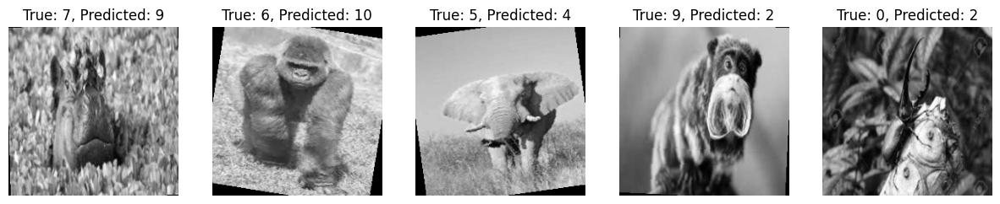

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,19,0,2,0,0,0,0,1,1,1,1,0,0,0,0
Butterfly,0,22,1,0,0,0,0,0,0,1,0,0,0,0,0
Cat,0,1,78,2,2,1,0,1,1,1,0,0,1,0,0
Cow,0,1,0,32,1,0,0,0,0,2,0,0,0,0,0
Dog,0,0,1,0,18,0,0,0,0,0,0,0,0,0,0
Elephant,0,2,4,0,0,56,0,1,1,2,0,1,0,0,0
Gorilla,0,0,0,0,0,0,6,0,0,0,0,0,0,1,0
Hippo,0,0,1,0,2,1,0,6,0,0,0,0,0,0,0
Lizard,0,0,1,0,0,0,0,0,16,0,1,0,0,0,0
Monkey,0,1,2,0,0,0,0,0,1,23,0,0,0,0,0


In [54]:
animal_1, animal_2 = make_cm(datamodule_r3, model_r3)
miss_animal_1 = miss_classified(model_r3, t_loader_r3, color=False)
show_confusion_matrix(animal_1, animal_2, class_names, gray=True)

The best accuracy for grayscale used a fully connected layer of [300] and was from a test that used random transformations. This is surprising that a random test had the best results because these transformatiosn were performed over the entire dataset first. We thought this might cause problems when evaluating, but it did pretty good in this experiment.   

4 of the missed images shown are a result of the rotate transformation. It's difficult to say whether these were missed due to the rotation or the image. It appears some of these missed to have a zoom transformation and perhaps these were mistaken for a larger animal.

#### Missclassified from worst performing model

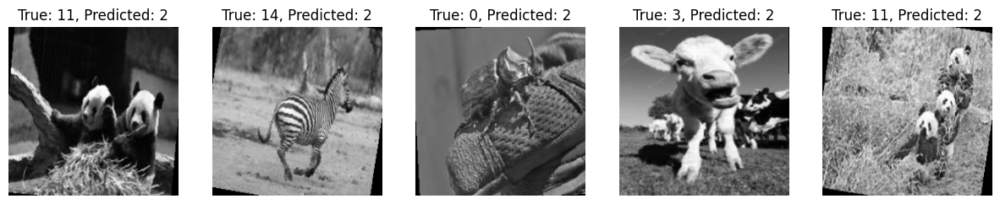

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,0,0,17,0,0,0,0,0,0,0,0,0,0,0,0
Butterfly,0,0,28,0,0,0,0,0,0,0,0,0,0,0,0
Cat,0,0,94,0,0,0,0,0,0,0,0,0,0,0,0
Cow,0,0,28,0,0,0,0,0,0,0,0,0,0,0,0
Dog,0,0,15,0,0,0,0,0,0,0,0,0,0,0,0
Elephant,0,0,55,0,0,0,0,0,0,0,0,0,0,0,0
Gorilla,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0
Hippo,0,0,14,0,0,0,0,0,0,0,0,0,0,0,0
Lizard,0,0,24,0,0,0,0,0,0,0,0,0,0,0,0
Monkey,0,0,34,0,0,0,0,0,0,0,0,0,0,0,0


In [57]:
animal_3, animal_4 = make_cm(datamodule_r2, model_r2)
miss_animal_2 = miss_classified(model_r2, t_loader_r2, color=False)
show_confusion_matrix(animal_3, animal_4, class_names, gray=True)

This test used one of the best fc_layers of [120, 84, 20] , a higher number of epochs but setting the learning rate to 0.01 caused the most impacet here. All these images above should be very easy for the network to classify and it had a difficult time with pandas and zebras. A lower learning rate is important even with a more complex network. 

#### End Animal Section
***

## Mini-Mushroom - grayscale

In [21]:
dataset1=datasets.ImageFolder(root="miniMushroomDataset",transform=None)

class_names=dataset1.classes
print(class_names)
print(len(class_names))

['Trametes hirsuta', 'Trametes ochracea', 'Trametes versicolor', 'Tremella mesenterica', 'Trichaptum biforme', 'Tricholomopsis rutilans', 'Urnula craterium', 'Verpa bohemica', 'Vulpicida pinastri', 'Xanthoria parietina']
10


#### Normal tests (no image transformations)

In [ ]:
transform = gray_transform(224,224)
datamodule_m1, t_loader_m1,  model_m1, df_m1 = runTrainer(transform, 'miniMushroomDataset', class_names, [120, 84, 20], 0.001, 10, color=False, l=True,  transform='normal', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_m2, t_loader_m2,  model_m2, df_m2 = runTrainer(transform, 'miniMushroomDataset', class_names, [120, 84, 20], 0.0001, 60, color=False, l=True,  transform='normal', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_m3, t_loader_m3,  model_m3, df_m3 = runTrainer(transform, 'miniMushroomDataset', class_names, [100, 120, 80, 40, 20], 0.0001, 12, color=False, l=True,  transform='normal', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_m4, t_loader_m4,  model_m4, df_m4 = runTrainer(transform, 'miniMushroomDataset', class_names, [200, 120, 80, 40, 20], 0.0001, 80, color=False, l=True,  transform='normal', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_m5, t_loader_m5,  model_m5, df_m5 = runTrainer(transform, 'miniMushroomDataset', class_names, [20, 10, 5], 0.001, 30, color=False, l=True,  transform='normal', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_m6, t_loader_m6,  model_m6, df_m6 = runTrainer(transform, 'miniMushroomDataset', class_names, [10,10], 0.001, 20, color=False, l=True,  transform='normal', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_m7, t_loader_m7,  model_m7, df_m7 = runTrainer(transform, 'miniMushroomDataset', class_names, [300], 0.001, 40, color=False, l=True,  transform='normal', name_of_data='mini-Mushroom', test_color='Grayscale')

#### Random image transformation tests (rotate, zoom, flip, crop)

In [ ]:
transform = gray_transform_rand(224,224)
datamodule_rm1, t_loader_rm_1, model_rm1, df_rm1 = runTrainer(transform, "miniMushroomDataset", class_names, [300], 0.001, 53, color=False, l=True, transform='random', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_rm2, t_loader_rm_2, model_rm2, df_rm2 = runTrainer(transform, "miniMushroomDataset", class_names, [200, 50, 10], 0.001, 50, color=False, l=True, transform='random', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_rm3, t_loader_rm_3, model_rm3, df_rm3 = runTrainer(transform, "miniMushroomDataset", class_names, [100, 50], 0.001, 40, color=False, l=True, transform='random', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_rm4, t_loader_rm_4, model_rm4, df_rm4 = runTrainer(transform, "miniMushroomDataset", class_names, [10], 0.01, 70, color=False, l=True, transform='random', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_rm5, t_loader_rm_5, model_rm5, df_rm5 = runTrainer(transform, "miniMushroomDataset", class_names, [100, 80, 40, 20], 0.001, 30, color=False, l=True, transform='random', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_rm6, t_loader_rm_6, model_rm6, df_rm6 = runTrainer(transform, "miniMushroomDataset", class_names, [120, 84, 20], 0.0001, 30, color=False, l=True, transform='random', name_of_data='mini-Mushroom', test_color='Grayscale')
datamodule_rm7, t_loader_rm_7, model_rm7, df_rm7 = runTrainer(transform, "miniMushroomDataset", class_names, [120, 84, 20], 0.0001, 12, color=False, l=True, transform='random', name_of_data='mini-Mushroom', test_color='Grayscale')

#### Cell below is reserved to save results to a csv for Mushroom tests.

In [28]:
make_csv(df_m1, 'gray_mushrooms_csv/l_m1.csv')
# etc..


#### Results

In [29]:
mush_df = make_dataframe('gray_mushrooms_csv')
mush_df

,Data,Transform,Fully Connected Layers,Learning Rate,Number of Epochs,Color,Test Accuracy
0,mini-Mushroom,normal,"[120, 84, 20]",0.0001,60,Grayscale,0.854167
1,mini-Mushroom,normal,"[200, 120, 80, 40, 20]",0.0001,80,Grayscale,0.843750
2,mini-Mushroom,normal,[300],0.0010,40,Grayscale,0.843750
3,mini-Mushroom,random,"[100, 50]",0.0010,40,Grayscale,0.833333
4,mini-Mushroom,normal,"[120, 84, 20]",0.0010,10,Grayscale,0.812500
5,mini-Mushroom,random,[300],0.0010,53,Grayscale,0.812500
6,mini-Mushroom,random,"[200, 50, 10]",0.0010,50,Grayscale,0.770833
7,mini-Mushroom,random,"[100, 80, 40, 20]",0.0010,30,Grayscale,0.593750
8,mini-Mushroom,normal,"[20, 10, 5]",0.0010,30,Grayscale,0.541667
9,mini-Mushroom,normal,"[10, 10]",0.0010,20,Grayscale,0.375000


#### Missclassified from best performing model

Epoch 11: 100%|██████████| 12/12 [21:05<00:00,  0.01it/s, v_num=247]


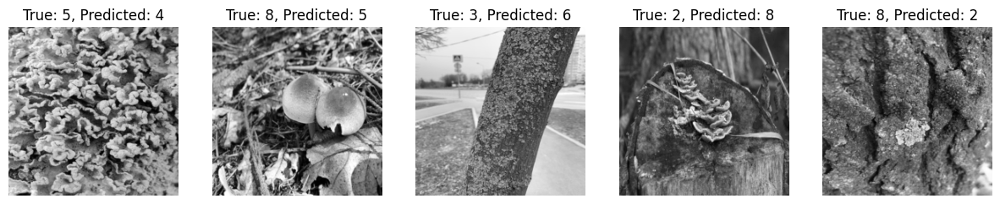

,Trametes hirsuta,Trametes ochracea,Trametes versicolor,Tremella mesenterica,Trichaptum biforme,Tricholomopsis rutilans,Urnula craterium,Verpa bohemica,Vulpicida pinastri,Xanthoria parietina
Trametes hirsuta,7,1,0,0,0,0,0,0,0,0
Trametes ochracea,0,6,0,0,0,0,0,0,1,0
Trametes versicolor,0,0,4,0,0,0,0,0,1,1
Tremella mesenterica,0,0,0,7,0,0,0,0,1,0
Trichaptum biforme,1,0,0,0,5,0,0,1,0,1
Tricholomopsis rutilans,1,1,0,0,1,10,0,0,0,0
Urnula craterium,0,0,0,0,0,0,8,0,0,0
Verpa bohemica,0,0,0,0,0,0,0,12,1,0
Vulpicida pinastri,0,1,0,0,0,0,0,1,10,1
Xanthoria parietina,0,0,0,0,0,0,0,0,0,12


In [30]:
mush_1, mush_2 = make_cm(datamodule_m2, model_m2)
miss_mush_1 = miss_classified(model_m2, t_loader_m2, color=False)
show_confusion_matrix(mush_1, mush_2, class_names, gray=True)

The best here was no transformations and used fc_layers of [120, 84, 20]. 3 of the images seem difficult to tell. Compared to Animals, mushrooms seems like it would be much more difficult to tell in grayscale. We did achieve a score of 85% here but color images may be able to beat this score and we will find out further in this notebook.

#### Missclassified from worst performing model

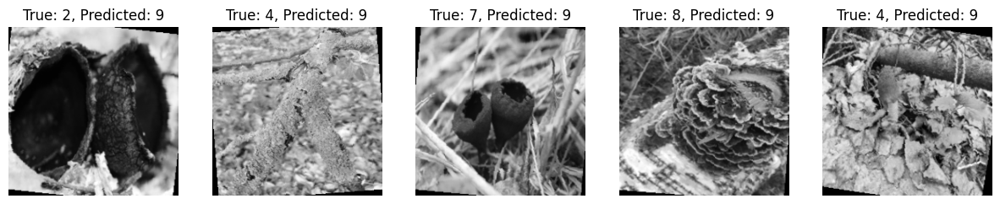

,Trametes hirsuta,Trametes ochracea,Trametes versicolor,Tremella mesenterica,Trichaptum biforme,Tricholomopsis rutilans,Urnula craterium,Verpa bohemica,Vulpicida pinastri,Xanthoria parietina
Trametes hirsuta,0,0,0,0,0,0,0,0,0,4
Trametes ochracea,0,0,0,0,0,0,0,0,0,6
Trametes versicolor,0,0,0,0,0,0,0,0,0,11
Tremella mesenterica,0,0,0,0,0,0,0,0,0,11
Trichaptum biforme,0,0,0,0,0,0,0,0,0,11
Tricholomopsis rutilans,0,0,0,0,0,0,0,0,0,13
Urnula craterium,0,0,0,0,0,0,0,0,0,11
Verpa bohemica,0,0,0,0,0,0,0,0,0,5
Vulpicida pinastri,0,0,0,0,0,0,0,0,0,13
Xanthoria parietina,0,0,0,0,0,0,0,0,0,11


In [31]:
mush_3, mush_4 = make_cm(datamodule_rm4, model_rm4)
miss_mush_2 = miss_classified(model_rm4, t_loader_rm_4, color=False)
show_confusion_matrix(mush_3, mush_4, class_names, gray=True)

The worst performing images have much more defined detail that would have been easy for the best model. This was so poor, it classified everything in to the same column. Again, this was a result of using a learning rate of 0.01. Another example where grayscale needs lower learning rate in it's networks.

#### End Mini-Mushroom Section
***

## Flowers - grayscale

In [71]:
dataset1=datasets.ImageFolder(root="flowers",transform=None)

class_names=dataset1.classes
print(class_names)
print(len(class_names))

['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
5


### Experiments

#### Normal tests (no image transformations)

In [ ]:
transform = gray_transform(224,224)
datamodule_f1, t_loader_f1,  model_f1, df_f1 = runTrainer(transform, "flowers", class_names, [100], 0.001, 35, color=False, l=True, transform='normal', name_of_data='full-flowers', test_color='Grayscale')
datamodule_f2, t_loader_f2,  model_f2, df_f2 = runTrainer(transform, "flowers", class_names, [120, 84], 0.001, 10, color=False, l=True, transform='normal', name_of_data='full-flowers', test_color='Grayscale')
datamodule_f3, t_loader_f3,  model_f3, df_f3 = runTrainer(transform, "flowers", class_names, [120, 84, 20], 0.0001, 75, color=False, l=True, transform='normal', name_of_data='full-flowers', test_color='Grayscale')
datamodule_f4, t_loader_f4,  model_f4, df_f4 = runTrainer(transform, "flowers", class_names, [140, 60, 30, 10], 0.001, 10, color=False, l=True, transform='normal', name_of_data='full-flowers', test_color='Grayscale')
datamodule_f5, t_loader_f5,  model_f5, df_f5 = runTrainer(transform, "flowers", class_names, [140, 60, 30, 10], 0.001, 40, color=False, l=True, transform='normal', name_of_data='full-flowers', test_color='Grayscale')
datamodule_f6, t_loader_f6,  model_f6, df_f6 = runTrainer(transform, "flowers", class_names, [200], 0.001, 28, color=False, l=True, transform='normal', name_of_data='full-flowers', test_color='Grayscale')


#### Random image transformation tests (rotate, zoom, flip, crop)

In [ ]:
transform = gray_transform_rand(224,224)
datamodule_rf1, t_loader_rf1,  model_rf1, df_rf1 = runTrainer(transform, "flowers", class_names, [100], 0.001, 35, color=False, l=True, transform='random', name_of_data='full-flowers', test_color='Grayscale')
datamodule_rf2, t_loader_rf2,  model_rf2, df_rf2 = runTrainer(transform, "flowers", class_names, [120, 84], 0.001, 10, color=False, l=True, transform='random', name_of_data='full-flowers', test_color='Grayscale')
datamodule_rf3, t_loader_rf3,  model_rf3, df_rf3 = runTrainer(transform, "flowers", class_names, [120, 84, 20], 0.0001, 75, color=False, l=True, transform='random', name_of_data='full-flowers', test_color='Grayscale')
datamodule_rf4, t_loader_rf4,  model_rf4, df_rf4 = runTrainer(transform, "flowers", class_names, [140, 60, 30, 10], 0.001, 20, color=False, l=True, transform='random', name_of_data='full-flowers', test_color='Grayscale')
datamodule_rf5, t_loader_rf5,  model_rf5, df_rf5 = runTrainer(transform, "flowers", class_names, [140, 60, 30, 10], 0.001, 40, color=False, l=True, transform='random', name_of_data='full-flowers', test_color='Grayscale')
datamodule_rf6, t_loader_rf6,  model_rf6, df_rf6 = runTrainer(transform, "flowers", class_names, [300], 0.001, 70, color=False, l=True, transform='random', name_of_data='full-flowers', test_color='Grayscale')

#### Cell below is reserved to save results to a csv for Flowers tests.

In [84]:
make_csv(df_rf2, 'gray_flowers_csv/l_f10.csv')
# etc...

#### Results

In [85]:
flowers_df = make_dataframe('gray_flowers_csv')
flowers_df

,Data,Transform,Fully Connected Layers,Learning Rate,Number of Epochs,Color,Test Accuracy
0,full-flowers,normal,"[140, 60, 30, 10]",0.0010,40,Grayscale,0.891204
1,full-flowers,normal,[200],0.0010,28,Grayscale,0.887731
2,full-flowers,normal,"[120, 84]",0.0010,10,Grayscale,0.887731
3,full-flowers,normal,"[120, 84, 20]",0.0001,75,Grayscale,0.885417
4,full-flowers,normal,[100],0.0010,35,Grayscale,0.884259
5,full-flowers,normal,"[120, 84]",0.0010,10,Grayscale,0.879630
6,full-flowers,normal,"[140, 60, 30, 10]",0.0010,10,Grayscale,0.878472
7,full-flowers,random,[300],0.0010,70,Grayscale,0.871528
8,full-flowers,random,"[140, 60, 30, 10]",0.0010,40,Grayscale,0.843750
9,full-flowers,random,"[120, 84, 20]",0.0001,75,Grayscale,0.728009


#### Missclassified from best performing model

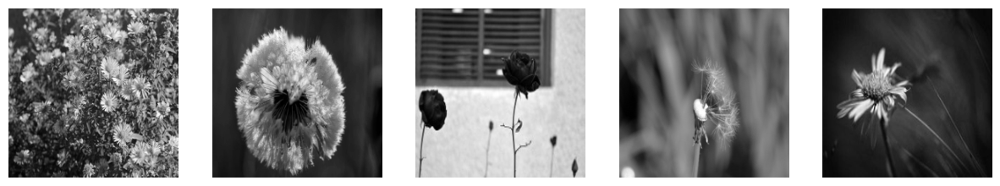

,daisy,dandelion,rose,sunflower,tulip
daisy,129,6,4,1,6
dandelion,3,219,1,3,2
rose,4,5,127,3,8
sunflower,1,4,3,121,11
tulip,2,3,6,3,189


In [89]:
flowers_1, flowers_2 = make_cm(datamodule_f5, model_f5)
miss_flowers_1 = miss_classified(model_f5, t_loader_f5, num_samples=5, color=False)
show_confusion_matrix(flowers_1, flowers_2, class_names, gray=True)

We almost got into the 90% with flowers. This test used no transformations and [140, 60, 30, 10] for it's fully connected layer. This dataset was much bigger than mini-animals and mini-mushrooms and benefitted from a more complex architecture than the others. I was surprised at the performance of the 4 fc_layers and I repeated this test two more times and got an accuracy score of 89 each time. If I had a larger dataset for the mini-mushrooms and mini-animals I think this 4 fc_layers would be worth testing. One of the images contains multiple flowers on a plant, which does cause some difficulty with clasifying. A couple of the flowers seem to be dying which there may not be too many examples of flowers in this state.

#### Missclassified from worst performing model

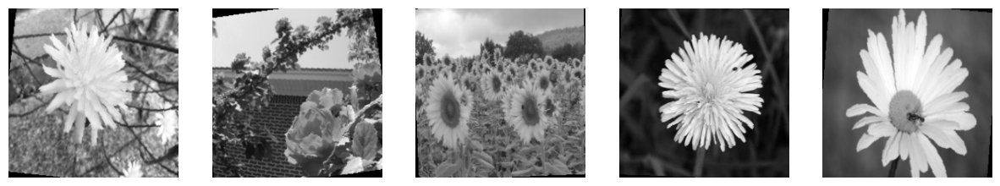

,daisy,dandelion,rose,sunflower,tulip
daisy,62,38,11,28,13
dandelion,5,187,9,19,16
rose,7,20,69,28,33
sunflower,4,17,7,91,18
tulip,5,15,14,21,127


In [88]:
flowers_3, flowers_4 = make_cm(datamodule_rf2, model_rf2)
miss_flowers_2 = miss_classified(model_rf2, t_loader_rf2, color=False)
show_confusion_matrix(flowers_3, flowers_4, class_names, gray=True)

The worst performing model was 2 fc_layers of [120, 84], lr=0.001, 10 epochs and used transformations. This is interesting in that the same test was conducted without transformation of images, and this architecture was almost the best for this dataset.  This model either needed more epochs or more fc_layers / more neurons to capture the complexities of the transformations. The best random used a single fc_layer of [300] but used 70 epochs. Increasaing the pochs would be beneficial here. 

#### End flower Section
***

## Final grayscale thoughts

The dimensionality reduction made this section faster to test and our accuracies were pretty good all over. One thing that was differnet in testing with grayscale is that we were able to achieve good results even with transformations. This was something that full color images did not. This is something that needs to be further investigated to understsand why that is. We got close, but were never able to get accuracy scores into the 90's in grayscale. There is a loss of information that could be benefical for species classification. We hope the color images can do even better.

***

# Flowers

In [9]:
dataset1=datasets.ImageFolder(root="flowers",transform=None)

class_names=dataset1.classes
print(len(class_names))
print(class_names)

5
['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


# Experiments

## Transformations

These experiments will test if transforming the flower data before running it through the CNN makes a significant difference in accuracy. The transformations to be tested are random rotations and a random horizontal flip. It is worth noting that some transformations are being performed on all of the data. These include resizing, a center crop, a tensor transformation, and normalization. These are necessary to run with the CNN used in this notebook. It is the random transformations that are being tested here.

Below Random rotation set to 10, and random horizontal flip is true

In [10]:
datamodule = DataModule(file="flowers", transform=color_transform(10,224,True))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[200, 60, 30], lr=0.001, color=True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 9.3 M 
3 | fc_out    | Linear     | 155   
-----------------------------------------
9.3 M     Trainable params
0         Non-trainable params
9.3 M     Total params
37.386    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:43<00:00,  1.04it/s, v_num=32]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:44<00:00,  1.03it/s, v_num=32]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_32\checkpoints\epoch=9-step=1070.ckpt


Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_32\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:12<00:00,  2.20it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.7858796119689941     │
│         test_loss         │    0.5794474482536316     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,119.0,6.0,10.0,6.0,7.0
dandelion,14.0,171.0,13.0,10.0,3.0
rose,0.0,5.0,132.0,0.0,27.0
sunflower,5.0,5.0,1.0,131.0,3.0
tulip,5.0,7.0,39.0,7.0,138.0


Below Random rotation set to 10, and random horizontal flip is false

In [11]:
datamodule = DataModule(file="flowers", transform=color_transform(10,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[200, 60, 30], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 9.3 M 
3 | fc_out    | Linear     | 155   
-----------------------------------------
9.3 M     Trainable params
0         Non-trainable params
9.3 M     Total params
37.386    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:39<00:00,  1.08it/s, v_num=33]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:39<00:00,  1.07it/s, v_num=33]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_33\checkpoints\epoch=9-step=1070.ckpt


Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_33\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.8634259104728699     │
│         test_loss         │    0.4687148630619049     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,143.0,3.0,3.0,2.0,6.0
dandelion,13.0,189.0,1.0,6.0,5.0
rose,3.0,5.0,137.0,1.0,9.0
sunflower,3.0,4.0,1.0,133.0,1.0
tulip,7.0,4.0,45.0,3.0,137.0


Below Random rotation set to 20, and random horizontal flip is false

In [12]:
datamodule = DataModule(file="flowers", transform=color_transform(20,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[200, 60, 30, 10], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 9.3 M 
3 | fc_out    | Linear     | 55    
-----------------------------------------
9.3 M     Trainable params
0         Non-trainable params
9.3 M     Total params
37.387    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:46<00:00,  1.00it/s, v_num=34]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:47<00:00,  1.00it/s, v_num=34]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_34\checkpoints\epoch=9-step=1070.ckpt


Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_34\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:11<00:00,  2.26it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.7523148059844971     │
│         test_loss         │    0.6835697293281555     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,129.0,9.0,5.0,10.0,1.0
dandelion,26.0,165.0,1.0,22.0,2.0
rose,11.0,14.0,87.0,4.0,37.0
sunflower,5.0,3.0,0.0,125.0,5.0
tulip,16.0,5.0,26.0,14.0,142.0


Below Random rotation set to 30, and random horizontal flip is False

In [13]:
datamodule = DataModule(file="flowers", transform=color_transform(30,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[200, 60, 30], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 9.3 M 
3 | fc_out    | Linear     | 155   
-----------------------------------------
9.3 M     Trainable params
0         Non-trainable params
9.3 M     Total params
37.386    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [02:00<00:00,  0.89it/s, v_num=35]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [02:01<00:00,  0.88it/s, v_num=35]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_35\checkpoints\epoch=9-step=1070.ckpt


Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_35\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:12<00:00,  2.24it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.7662037014961243     │
│         test_loss         │    0.6375262141227722     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,111.0,21.0,4.0,7.0,8.0
dandelion,9.0,179.0,1.0,17.0,4.0
rose,4.0,10.0,94.0,2.0,47.0
sunflower,4.0,11.0,0.0,127.0,4.0
tulip,1.0,20.0,19.0,7.0,153.0


Below no random transformations are being made

In [36]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[200, 60, 30], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 9.3 M 
3 | fc_out    | Linear     | 155   
-----------------------------------------
9.3 M     Trainable params
0         Non-trainable params
9.3 M     Total params
37.386    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:58<00:00,  0.90it/s, v_num=50]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:59<00:00,  0.90it/s, v_num=50]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_50\checkpoints\epoch=9-step=1070.ckpt


Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_50\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:12<00:00,  2.14it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9016203880310059     │
│         test_loss         │     0.514777660369873     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,125.0,7.0,4.0,2.0,1.0
dandelion,4.0,201.0,6.0,2.0,3.0
rose,1.0,3.0,148.0,1.0,12.0
sunflower,1.0,6.0,0.0,140.0,2.0
tulip,2.0,4.0,14.0,5.0,170.0


### Discussion

When it comes to random transformations on the flower dataset, it is, surprisingly, no random transformations that performs the best. A couple of hypothesis into explaining why this is the case are that the images are already quite deverse in angle and distance taken that the transformation doesn't do much, and that there are so many images in the dataset that running random transformations can be unnecessary. Also the transformations are occuring over both the train and test data. Perhaps different result would come from just transforming the train data. When running the above experiments, the accuracy immediately increased after taking off the random horizontal flip. After that, when the random rotation is set to a higher range, the accuracy starts to decline. Then when no transformations were run, the best accuracy was found. It is of note that in every model in this section the most likely misclassification to occur was tulips and roses being classified as each other. Some of the models showed other misclassifications, but the tulip and rose misclassification was always present even in the best performing model. This could be due to both of these flowers having a similar color, and shape.

## Changing learning rate

Below learning rate is .01

In [14]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[200, 60, 30], lr=0.01, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 9.3 M 
3 | fc_out    | Linear     | 155   
-----------------------------------------
9.3 M     Trainable params
0         Non-trainable params
9.3 M     Total params
37.386    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:48<00:00,  0.99it/s, v_num=36]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:49<00:00,  0.98it/s, v_num=36]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_36\checkpoints\epoch=9-step=1070.ckpt
Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_36\checkpoints\epoch=9-step=1070.ckpt


c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:10<00:00,  2.53it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.6365740895271301     │
│         test_loss         │    1.0352991819381714     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,42.0,108.0,3.0,3.0,0.0
dandelion,4.0,203.0,3.0,4.0,1.0
rose,2.0,17.0,120.0,2.0,14.0
sunflower,12.0,92.0,4.0,27.0,6.0
tulip,0.0,22.0,17.0,3.0,155.0


Below learning rate is .0001

In [15]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[200, 60, 30], lr=0.0001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 9.3 M 
3 | fc_out    | Linear     | 155   
-----------------------------------------
9.3 M     Trainable params
0         Non-trainable params
9.3 M     Total params
37.386    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:33<00:00,  1.15it/s, v_num=37]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:34<00:00,  1.14it/s, v_num=37]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_37\checkpoints\epoch=9-step=1070.ckpt
Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_37\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_worker


Testing DataLoader 0: 100%|██████████| 27/27 [00:10<00:00,  2.58it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.7893518805503845     │
│         test_loss         │    0.6166291236877441     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,101.0,24.0,4.0,3.0,3.0
dandelion,9.0,192.0,2.0,12.0,4.0
rose,4.0,14.0,87.0,2.0,31.0
sunflower,1.0,21.0,1.0,140.0,3.0
tulip,5.0,15.0,14.0,7.0,165.0


### Discussion
It would seem that a learning rate of .001 is optimal for the flower dataset using the lightning CNN. This makes sense, because a learning rate that is too low will lead to not enough significant changes being made (especially when there are only 10 epochs being run). On the other hand, if too great of a learning rate is used, then the model will jump too far and push past its target point. That is shown here with the learning rate of .01 performing the worst. It was making to significant of a change. This is shown mainly in the Daisy and Sunflower classes. It is interesting, because the other classes performed very well, but on these two classes, the CNN misclassified more elements than it got correct. They were both misclassified as dandelions, which brings up a point that when a learning rate is too high it is possible that a bias towards one class can be created. In this situation it was towards the dandelion class. While the lower .0001 learning rate did not perform as well as the optimal one, it did perform better than the higher learning rate model. It also did not make a majority misclassification for any class like the higher learning rate. A conclusion that can be drawn here is that using too low of a learning rate is preferable to one that is too high, because eventually a low learning rate will hit its mark with enough epochs, but a high learning rate will jump around forever most likely. Another note of importance is that in the lower learning rate the earlier stated misclassification of roses and tulips persists, but it does not in the higher learning rate example.

## Adjusting hidden layers

In this section, the number of hidden layers will be changed along with their values. experiments are run any where from 1 to 4 hidden layers. The values chosen for these layers are increase or decreasing (if there is more than one layer), range from very small to large, and are sometimes set to the same numbers.

Below hidden layers are set to [120, 84, 20]

In [16]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[120, 84, 20], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 105   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.447    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:21<00:00,  1.31it/s, v_num=38]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:21<00:00,  1.30it/s, v_num=38]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_38\checkpoints\epoch=9-step=1070.ckpt
Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_38\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_worker


Testing DataLoader 0: 100%|██████████| 27/27 [00:10<00:00,  2.48it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │           0.875           │
│         test_loss         │    0.5694946646690369     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,130.0,13.0,1.0,1.0,6.0
dandelion,2.0,214.0,1.0,6.0,7.0
rose,3.0,1.0,106.0,2.0,43.0
sunflower,1.0,8.0,3.0,124.0,5.0
tulip,3.0,2.0,3.0,1.0,178.0


Below hidden layers are set to [100, 60, 10]

In [17]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[100, 60, 10], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 4.7 M 
3 | fc_out    | Linear     | 55    
-----------------------------------------
4.7 M     Trainable params
0         Non-trainable params
4.7 M     Total params
18.694    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:19<00:00,  1.35it/s, v_num=39]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:19<00:00,  1.35it/s, v_num=39]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_39\checkpoints\epoch=9-step=1070.ckpt
Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_39\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_worker


Testing DataLoader 0: 100%|██████████| 27/27 [00:10<00:00,  2.57it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9247685074806213     │
│         test_loss         │    0.45157182216644287    │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,122.0,0.0,12.0,1.0,4.0
dandelion,8.0,207.0,3.0,7.0,7.0
rose,1.0,2.0,142.0,2.0,7.0
sunflower,0.0,4.0,1.0,130.0,2.0
tulip,4.0,0.0,13.0,6.0,179.0


Below hidden layers are set to [120, 84]

In [18]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[120, 84], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 425   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.442    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:24<00:00,  1.26it/s, v_num=40]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:25<00:00,  1.26it/s, v_num=40]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_40\checkpoints\epoch=9-step=1070.ckpt
Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_40\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_worker


Testing DataLoader 0: 100%|██████████| 27/27 [00:10<00:00,  2.56it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9293981194496155     │
│         test_loss         │    0.32992175221443176    │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,143.0,7.0,1.0,2.0,2.0
dandelion,4.0,186.0,3.0,3.0,0.0
rose,5.0,4.0,147.0,2.0,8.0
sunflower,2.0,3.0,0.0,138.0,0.0
tulip,2.0,9.0,11.0,4.0,178.0


Below hidden layers are set to [120]

In [19]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[120], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 605   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.402    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:25<00:00,  1.26it/s, v_num=41]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:25<00:00,  1.25it/s, v_num=41]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_41\checkpoints\epoch=9-step=1070.ckpt
Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_41\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_worker


Testing DataLoader 0: 100%|██████████| 27/27 [00:10<00:00,  2.53it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9212962985038757     │
│         test_loss         │    0.31772443652153015    │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,163.0,8.0,0.0,1.0,3.0
dandelion,5.0,185.0,1.0,2.0,3.0
rose,6.0,2.0,132.0,0.0,11.0
sunflower,0.0,3.0,0.0,140.0,5.0
tulip,4.0,1.0,2.0,1.0,186.0


Below hidden layers are set to [120, 84, 20, 5]

In [20]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[120, 84, 20, 5], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 30    
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:19<00:00,  1.35it/s, v_num=42]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:19<00:00,  1.34it/s, v_num=42]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_42\checkpoints\epoch=9-step=1070.ckpt
Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_42\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_worker


Testing DataLoader 0: 100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.8854166865348816     │
│         test_loss         │    0.5960262417793274     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,125.0,13.0,5.0,2.0,4.0
dandelion,8.0,190.0,3.0,5.0,1.0
rose,2.0,3.0,154.0,8.0,4.0
sunflower,1.0,4.0,3.0,131.0,0.0
tulip,2.0,4.0,28.0,6.0,158.0


Below hidden layers are set to [20, 50, 100]

In [22]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[20, 50, 100], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 939 K 
3 | fc_out    | Linear     | 505   
-----------------------------------------
940 K     Trainable params
0         Non-trainable params
940 K     Total params
3.763     Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:07<00:00,  1.58it/s, v_num=43]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:07<00:00,  1.58it/s, v_num=43]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_43\checkpoints\epoch=9-step=1070.ckpt


Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_43\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:10<00:00,  2.51it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9027777910232544     │
│         test_loss         │     0.542276918888092     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,136.0,7.0,8.0,2.0,2.0
dandelion,3.0,196.0,5.0,3.0,9.0
rose,1.0,2.0,132.0,0.0,7.0
sunflower,0.0,1.0,5.0,138.0,10.0
tulip,1.0,3.0,15.0,3.0,175.0


Below hidden layers are set to [20, 50]

In [23]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[20, 50], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 934 K 
3 | fc_out    | Linear     | 255   
-----------------------------------------
935 K     Trainable params
0         Non-trainable params
935 K     Total params
3.742     Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:17<00:00,  1.38it/s, v_num=44]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:17<00:00,  1.38it/s, v_num=44]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_44\checkpoints\epoch=9-step=1070.ckpt


Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_44\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:11<00:00,  2.26it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.8877314925193787     │
│         test_loss         │    0.5385189652442932     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,128.0,6.0,5.0,7.0,3.0
dandelion,10.0,186.0,2.0,14.0,2.0
rose,5.0,3.0,118.0,1.0,13.0
sunflower,7.0,1.0,0.0,148.0,5.0
tulip,4.0,4.0,5.0,5.0,182.0


Below hidden layers are set to [5]

In [24]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[5], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 233 K 
3 | fc_out    | Linear     | 30    
-----------------------------------------
234 K     Trainable params
0         Non-trainable params
234 K     Total params
0.937     Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:01<00:00,  1.74it/s, v_num=45]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:01<00:00,  1.74it/s, v_num=45]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_45\checkpoints\epoch=9-step=1070.ckpt
Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_45\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_worker


Testing DataLoader 0: 100%|██████████| 27/27 [00:10<00:00,  2.65it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.5370370149612427     │
│         test_loss         │    1.0918171405792236     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,69.0,49.0,0.0,0.0,40.0
dandelion,15.0,195.0,0.0,0.0,6.0
rose,5.0,6.0,36.0,0.0,106.0
sunflower,6.0,121.0,0.0,0.0,3.0
tulip,6.0,9.0,43.0,0.0,149.0


Below hidden layers are set to [5, 5, 5]

In [25]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[5, 5, 5], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 233 K 
3 | fc_out    | Linear     | 30    
-----------------------------------------
234 K     Trainable params
0         Non-trainable params
234 K     Total params
0.938     Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:02<00:00,  1.72it/s, v_num=46]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:02<00:00,  1.71it/s, v_num=46]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_46\checkpoints\epoch=9-step=1070.ckpt
Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_46\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_worker


Testing DataLoader 0: 100%|██████████| 27/27 [00:10<00:00,  2.70it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.26273149251937866    │
│         test_loss         │    1.5916311740875244     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,0.0,144.0,0.0,0.0,0.0
dandelion,0.0,233.0,0.0,0.0,0.0
rose,0.0,165.0,0.0,0.0,0.0
sunflower,0.0,130.0,0.0,0.0,0.0
tulip,0.0,192.0,0.0,0.0,0.0


### Discussion

The best performing model included a hidden layer configuration of [120, 84]. There were other models that also performed very well; getting a test accuracy score in the 90s. A big determinant of high accuracy is if a high enough value is used for each hidden layer that is chosen. This is shown in the experiments for the architectures [5], and [5,5,5]. These were the worst performing models by far, and it is because too low of a number was used. This means that these layers were not complex enough to classify flower images. This is also why a more complex 2-3 hidden layer tended to perform better in the experiments above. Flowers may not be the most complex images to tell apart, but they are still images with a lot to take into account. Exculding the previously mentioned worst performers of the section, it was the hidden layer architectures of [120, 84, 20, 5] and [120, 84, 20] that tended to misclassify Roses and Tulips the most. These are some of the most complex structures that were tested here. It may be a coincidence, but could also be a note worthy observation since these two flowers have tended to be misclassified the most in this notebook. 

## Adjusting epochs on best performing model

The best performing model was deemed to be one with no transformations, and a hidden layer architecture of [120, 84]. Here this model will be trained on more epochs to see if this increases performance.

Below epochs are set to 100

In [26]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[120, 84], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=100)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 425   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.442    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 99: 100%|██████████| 107/107 [01:23<00:00,  1.28it/s, v_num=47]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 99: 100%|██████████| 107/107 [01:23<00:00,  1.28it/s, v_num=47]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_47\checkpoints\epoch=99-step=10700.ckpt


Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_47\checkpoints\epoch=99-step=10700.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.8969907164573669     │
│         test_loss         │     0.897028386592865     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,139.0,8.0,3.0,5.0,4.0
dandelion,5.0,198.0,0.0,6.0,4.0
rose,5.0,3.0,136.0,2.0,10.0
sunflower,2.0,0.0,1.0,129.0,2.0
tulip,5.0,4.0,12.0,4.0,177.0


Below epochs are set to 50

In [27]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[120, 84], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=50)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 425   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.442    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 49: 100%|██████████| 107/107 [01:19<00:00,  1.34it/s, v_num=48]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 49: 100%|██████████| 107/107 [01:20<00:00,  1.33it/s, v_num=48]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_48\checkpoints\epoch=49-step=5350.ckpt
Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_48\checkpoints\epoch=49-step=5350.ckpt


c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9143518805503845     │
│         test_loss         │    0.5405195951461792     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,134.0,6.0,4.0,2.0,0.0
dandelion,4.0,205.0,1.0,8.0,1.0
rose,2.0,5.0,156.0,1.0,10.0
sunflower,3.0,3.0,1.0,134.0,3.0
tulip,1.0,7.0,4.0,2.0,167.0


### Discussion

Adding more epochs, while increasing the time necessary to run, did not significantly increase the performance of the model. In fact it actually made it perform worse. The 10 epoch version of this model ran the best, while the 100 epoch version performed the worst. When running 100 epochs the train loss increased greatly, even though the test accuracy did not decrease proportionately. This means that the model most likely hit an optimal point at some point during the training, and then the loss began to rise as it was run too long. This is interesting, because it still managed to perform fairly well on the test set.

## Looking at misclassified images

The best model CNN will be run again multiple times with examples of misclassified images from that run printed out. We will look to see why these images might have been misclassified by the model

In [10]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[120, 84], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 425   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.442    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:36<00:00,  1.11it/s, v_num=52]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:36<00:00,  1.11it/s, v_num=52]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_52\checkpoints\epoch=9-step=1070.ckpt


Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_52\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:10<00:00,  2.51it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9120370149612427     │
│         test_loss         │    0.4704321324825287     │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,131.0,5.0,1.0,3.0,1.0
dandelion,4.0,214.0,0.0,0.0,3.0
rose,4.0,1.0,123.0,0.0,13.0
sunflower,3.0,2.0,2.0,142.0,4.0
tulip,1.0,3.0,9.0,3.0,192.0


In [18]:
datamodule = DataModule(file="flowers", transform=color_transform(0,224,False))
datamodule.setup()
model = ConvolutionalNetwork(class_names, n_hiddens=[120, 84], lr=0.001, color = True)
trainer = pl.Trainer(max_epochs=10)
trainer.fit(model, datamodule)
datamodule.setup(stage='test')
test_loader = datamodule.test_dataloader()
trainer.test(dataloaders=test_loader)

#make_cm(datamodule, model)
a, b = make_cm(datamodule, model)

yo_df = confusion_matrix(a, b)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues').format("{:.1f}")
conf_val_df

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 425   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.442    Total estimated model params size (MB)
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3`

Epoch 9: 100%|██████████| 107/107 [01:45<00:00,  1.02it/s, v_num=53]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 107/107 [01:45<00:00,  1.01it/s, v_num=53]

c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.


Restoring states from the checkpoint path at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_53\checkpoints\epoch=9-step=1070.ckpt
Loaded model weights from the checkpoint at c:\Users\Administrator\Desktop\CSU CS\Spring 2024\CS 445\Project\ProjectSnapshot\lightning_logs\version_53\checkpoints\epoch=9-step=1070.ckpt
c:\Users\Administrator\miniconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=3` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 27/27 [00:15<00:00,  1.77it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9259259104728699     │
│         test_loss         │    0.37492600083351135    │
└───────────────────────────┴───────────────────────────┘

,daisy,dandelion,rose,sunflower,tulip
daisy,135.0,8.0,0.0,1.0,2.0
dandelion,9.0,205.0,0.0,6.0,3.0
rose,8.0,3.0,129.0,0.0,9.0
sunflower,1.0,7.0,0.0,128.0,2.0
tulip,3.0,4.0,10.0,3.0,188.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


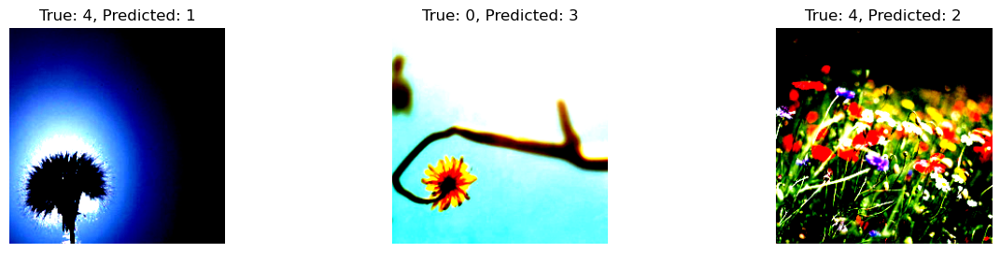

              precision    recall  f1-score   support

       daisy     0.9161    0.9291    0.9225       141
   dandelion     0.9511    0.9683    0.9596       221
        rose     0.9111    0.8723    0.8913       141
   sunflower     0.9595    0.9281    0.9435       153
       tulip     0.9014    0.9231    0.9121       208

    accuracy                         0.9282       864
   macro avg     0.9278    0.9242    0.9258       864
weighted avg     0.9284    0.9282    0.9281       864



In [17]:
miss_flower = miss_classified(model, test_loader)
class_report = classification_report(a, b, target_names=class_names, digits=4)
print(class_report)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


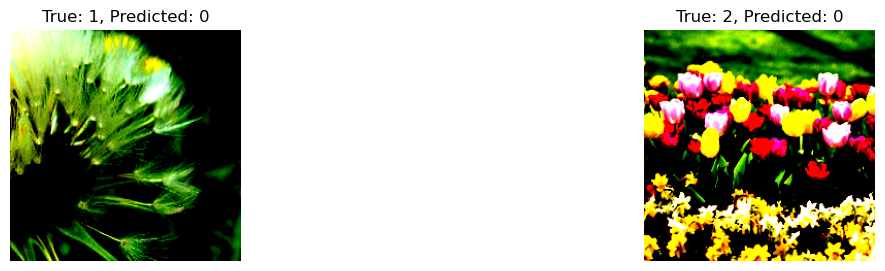

              precision    recall  f1-score   support

       daisy     0.8654    0.9247    0.8940       146
   dandelion     0.9031    0.9193    0.9111       223
        rose     0.9281    0.8658    0.8958       149
   sunflower     0.9275    0.9275    0.9275       138
       tulip     0.9216    0.9038    0.9126       208

    accuracy                         0.9086       864
   macro avg     0.9091    0.9082    0.9082       864
weighted avg     0.9094    0.9086    0.9086       864



In [20]:
miss_flower2 = miss_classified(model, test_loader)
class_report2 = classification_report(a, b, target_names=class_names, digits=4)
print(class_report2)

### Discussion

**1st image:** is actually a tulip, but was misclassified as a dandelion. This lighting on this picture is very dark and it is hard to see all of the attribues. The abstract nature of the photo could have led to its misclassification. Also when I look at the pictrue, it also looks like a dandelion to me, so it makes sense that the model would misclassify this one. Because of this, it could have been a problem with the dataset itself.

**2nd imgae:** Is actually a daisy, but was misclassified as a sunflower. It makes sense that these two classes would be misclassified as each other. Daisies and sunflowers have a very similar shape overall (circular center with elongated petals coming out from it). The biggest difference between these two types of flower comes in the color, and the amount and shape of the petals coming from the center. In this image the color has been warped to be the same color as a sunflower, and the angle of the flower is facing away from the viewer's perspective. These two elements most likely came into play by the model when it misclassified this image.

**3rd image:** Is actually a tulip, but was misclassified as a rose. Initially looking at the image, the first thing that can be seen is a vignette around the flower. This makes it harder for the model to classify it. Also it looks as if the flowers are still relatively young, and have not bloomed yet. Before blooming roses and tulips can look very similar. This has most likely attributed to this particular image being misclassified.

**4th image:** Is actually a dandelion, but was misclassifed as a daisy. This image is more clear to a viewers eyes that it is a dandelion. The main reason the model had a hard time classifying it, however, is due to its proximity to the camera. This is a very close up image of the flower. This makes the center look more circular then it should. The CNN did not pick up on the opaque outer ring and assumed they were petals leading to its misclassification.

**5th image:** Is actually a rose, but was misclassified as a daisy. This one is an interesting case, because it seems like there actually features two types of flower in this image. The flowers in the middle are clearly roses, but at the very bottom a different type of flower can be seen. These flowers off to the side seem a lot like daisies. The model must have focused in on these instead of looking at the featured flower in the center. So while this image may have been deemed as misclassified, it actually correctly classified an aspect of it. This is a problem with the dataset, but is also a real world example that could be possible. It is worth noting that the CNN does not always focus on the center of the image when looking for similarities.

## Animals

## Class Names

In [10]:
dataset1=datasets.ImageFolder(root="miniAnimalDataset",transform=None)

class_names=dataset1.classes
print(class_names)
print(len(class_names))

['Beetle', 'Butterfly', 'Cat', 'Cow', 'Dog', 'Elephant', 'Gorilla', 'Hippo', 'Lizard', 'Monkey', 'Mouse', 'Panda', 'Spider', 'Tiger', 'Zebra']
15


## Mini-dataset, no random transformations of images

#### 2-fc_layer

##### 1)

In [11]:
transform = defineTransforms(0, 0, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
2024-05-08 15:21:30.116826: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 1.3 K 
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.445    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_21/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_21/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8979166746139526
        test_loss           0.5183423161506653
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


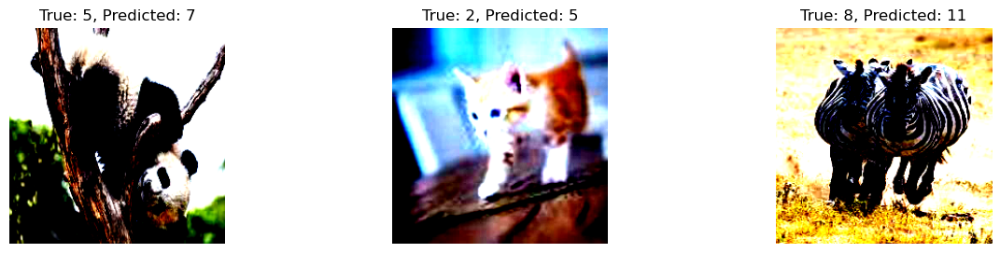

In [12]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [13]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.7647    0.8125    0.7879        16
   Butterfly     0.8696    0.9091    0.8889        22
         Cat     0.9067    0.9189    0.9128        74
         Cow     0.8913    0.8723    0.8817        47
         Dog     1.0000    0.8235    0.9032        17
    Elephant     0.8788    0.9062    0.8923        64
     Gorilla     1.0000    0.8750    0.9333         8
       Hippo     0.8571    0.6667    0.7500         9
      Lizard     0.8333    0.9091    0.8696        22
      Monkey     0.8286    0.8056    0.8169        36
       Mouse     0.7143    0.8333    0.7692        18
       Panda     0.9149    0.9556    0.9348        45
      Spider     0.8889    0.7619    0.8205        21
       Tiger     0.9333    0.9032    0.9180        31
       Zebra     1.0000    1.0000    1.0000        50

    accuracy                         0.8917       480
   macro avg     0.8854    0.8635    0.8719       480
weighted avg     0.8940   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,13,0,1,0,0,1,0,0,0,1,0,0,0,0,0
Butterfly,0,20,1,0,0,0,0,0,1,0,0,0,0,0,0
Cat,0,0,68,2,0,0,0,0,1,0,2,1,0,0,0
Cow,0,1,1,41,0,2,0,0,0,0,2,0,0,0,0
Dog,1,0,2,0,14,0,0,0,0,0,0,0,0,0,0
Elephant,0,0,1,1,0,58,0,1,0,1,0,2,0,0,0
Gorilla,0,0,0,1,0,0,7,0,0,0,0,0,0,0,0
Hippo,0,0,0,0,0,1,0,6,0,1,1,0,0,0,0
Lizard,0,1,0,0,0,0,0,0,20,0,0,0,0,1,0
Monkey,1,0,1,0,0,2,0,0,1,29,0,1,0,1,0


#### 3-fc_layer

##### 1)

In [16]:
transform = defineTransforms(0, 0, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84, 20], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 315   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_23/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_23/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8916666507720947
        test_loss           0.8496964573860168
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


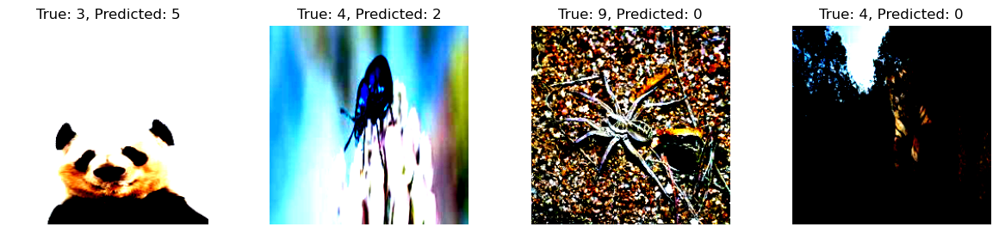

In [17]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [18]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.6471    1.0000    0.7857        22
   Butterfly     0.7857    0.8462    0.8148        26
         Cat     0.9315    0.9067    0.9189        75
         Cow     0.6757    0.8333    0.7463        30
         Dog     1.0000    0.6875    0.8148        16
    Elephant     0.9516    0.8676    0.9077        68
     Gorilla     1.0000    0.8000    0.8889         5
       Hippo     0.8000    0.8889    0.8421         9
      Lizard     0.9545    0.9130    0.9333        23
      Monkey     0.9355    0.7838    0.8529        37
       Mouse     0.9286    0.6842    0.7879        19
       Panda     0.8636    0.9268    0.8941        41
      Spider     0.8333    0.8696    0.8511        23
       Tiger     0.9412    0.8889    0.9143        36
       Zebra     0.9423    0.9800    0.9608        50

    accuracy                         0.8771       480
   macro avg     0.8794    0.8584    0.8609       480
weighted avg     0.8906   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,22,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Butterfly,0,22,0,0,0,1,0,0,0,0,0,0,0,1,2
Cat,2,2,68,2,0,0,0,0,0,0,0,0,1,0,0
Cow,0,0,3,25,0,1,0,1,0,0,0,0,0,0,0
Dog,2,0,0,1,11,0,0,0,0,0,0,2,0,0,0
Elephant,3,0,0,3,0,59,0,0,0,1,0,2,0,0,0
Gorilla,0,0,0,0,0,1,4,0,0,0,0,0,0,0,0
Hippo,0,0,0,0,0,0,0,8,0,1,0,0,0,0,0
Lizard,1,0,1,0,0,0,0,0,21,0,0,0,0,0,0
Monkey,4,1,0,1,0,0,0,0,0,29,1,1,0,0,0


#### 4-fc_layer

##### 1)

In [19]:
transform = defineTransforms(0, 0, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [180, 80, 40, 20], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 8.4 M 
3 | fc_out    | Linear     | 315   
-----------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.673    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_24/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_24/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8500000238418579
        test_loss           0.8914176821708679
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


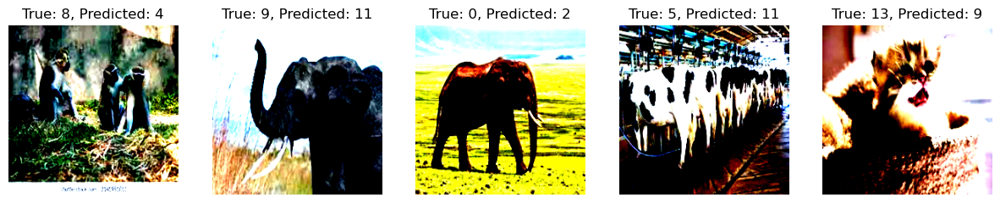

In [20]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [21]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     1.0000    0.7500    0.8571        12
   Butterfly     0.7000    0.8235    0.7568        17
         Cat     0.8571    0.8852    0.8710        61
         Cow     0.8750    0.9459    0.9091        37
         Dog     0.7778    0.7778    0.7778        18
    Elephant     0.8571    0.9153    0.8852        59
     Gorilla     0.4286    1.0000    0.6000         3
       Hippo     1.0000    0.9000    0.9474        20
      Lizard     0.9412    0.7273    0.8205        22
      Monkey     0.8158    0.8611    0.8378        36
       Mouse     0.9231    0.6667    0.7742        18
       Panda     0.8571    0.8936    0.8750        47
      Spider     0.7391    0.7083    0.7234        24
       Tiger     0.9286    0.8864    0.9070        44
       Zebra     0.9500    0.9194    0.9344        62

    accuracy                         0.8646       480
   macro avg     0.8434    0.8440    0.8318       480
weighted avg     0.8727   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,9,0,0,0,1,0,0,0,0,1,0,0,1,0,0
Butterfly,0,14,0,0,0,0,0,0,1,0,0,0,1,1,0
Cat,0,1,54,3,0,2,0,0,0,0,0,0,1,0,0
Cow,0,0,0,35,0,1,0,0,0,0,0,0,1,0,0
Dog,0,0,2,1,14,0,1,0,0,0,0,0,0,0,0
Elephant,0,0,3,0,0,54,1,0,0,1,0,0,0,0,0
Gorilla,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0
Hippo,0,0,0,1,0,0,1,18,0,0,0,0,0,0,0
Lizard,0,0,0,0,1,0,0,0,16,0,1,1,0,1,2
Monkey,0,0,0,0,0,1,0,0,0,31,0,3,1,0,0


On our miniAnimal dataset we almost reached 90%, the best results came from running a 2-fc_layer. Those layers being [120, 84]. The surprising aspects were that the model lost accuracy with the more layers that were added. You can notice a significant decline in the accuracy as we added more layers from the intial two layers. While accuracy was noticably decreased as the layers increased, the overall accuracy still remained high, 84%+. One beliefe that we have for the model performance decreasing with more layers is potential overfitting as the miniAnimal dataset is only a fraction of the size of the full dataset.

### Chaning Learning Rate

Lr = 0.01

In [61]:
transform = defineTransforms(0, 0, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84], 0.01, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 1.3 K 
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.445    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_39/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_39/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.17291666567325592
        test_loss           2.4986748695373535
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


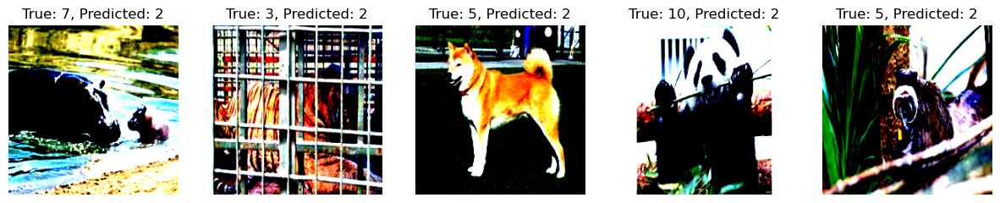

In [62]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [63]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.0000    0.0000    0.0000        25
   Butterfly     0.0000    0.0000    0.0000        25
         Cat     0.1354    1.0000    0.2385        65
         Cow     0.0000    0.0000    0.0000        43
         Dog     0.0000    0.0000    0.0000        16
    Elephant     0.0000    0.0000    0.0000        63
     Gorilla     0.0000    0.0000    0.0000         5
       Hippo     0.0000    0.0000    0.0000        13
      Lizard     0.0000    0.0000    0.0000        19
      Monkey     0.0000    0.0000    0.0000        44
       Mouse     0.0000    0.0000    0.0000        25
       Panda     0.0000    0.0000    0.0000        43
      Spider     0.0000    0.0000    0.0000        16
       Tiger     0.0000    0.0000    0.0000        26
       Zebra     0.0000    0.0000    0.0000        52

    accuracy                         0.1354       480
   macro avg     0.0090    0.0667    0.0159       480
weighted avg     0.0183   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,0,0,25,0,0,0,0,0,0,0,0,0,0,0,0
Butterfly,0,0,25,0,0,0,0,0,0,0,0,0,0,0,0
Cat,0,0,65,0,0,0,0,0,0,0,0,0,0,0,0
Cow,0,0,43,0,0,0,0,0,0,0,0,0,0,0,0
Dog,0,0,16,0,0,0,0,0,0,0,0,0,0,0,0
Elephant,0,0,63,0,0,0,0,0,0,0,0,0,0,0,0
Gorilla,0,0,5,0,0,0,0,0,0,0,0,0,0,0,0
Hippo,0,0,13,0,0,0,0,0,0,0,0,0,0,0,0
Lizard,0,0,19,0,0,0,0,0,0,0,0,0,0,0,0
Monkey,0,0,44,0,0,0,0,0,0,0,0,0,0,0,0


Lr = 0.001

In [64]:
transform = defineTransforms(0, 0, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 1.3 K 
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.445    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_40/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_40/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8916666507720947
        test_loss           0.5276429653167725
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


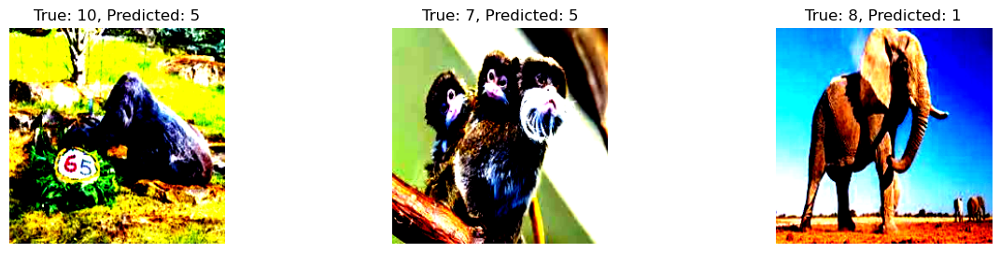

In [65]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [66]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.8947    0.8095    0.8500        21
   Butterfly     1.0000    0.8824    0.9375        17
         Cat     0.9070    0.9750    0.9398        80
         Cow     0.9189    0.9444    0.9315        36
         Dog     1.0000    0.8182    0.9000        22
    Elephant     0.8194    0.9219    0.8676        64
     Gorilla     0.8571    0.8571    0.8571         7
       Hippo     1.0000    0.8182    0.9000        11
      Lizard     0.9200    0.8214    0.8679        28
      Monkey     0.8611    0.9118    0.8857        34
       Mouse     0.9286    0.6500    0.7647        20
       Panda     0.8085    0.8636    0.8352        44
      Spider     0.7368    0.7368    0.7368        19
       Tiger     0.9091    0.9091    0.9091        33
       Zebra     0.9302    0.9091    0.9195        44

    accuracy                         0.8854       480
   macro avg     0.8994    0.8552    0.8735       480
weighted avg     0.8896   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,17,0,0,0,0,1,0,0,0,1,0,1,0,0,1
Butterfly,0,15,0,0,0,0,0,0,0,0,0,1,0,1,0
Cat,0,0,78,0,0,0,0,0,1,1,0,0,0,0,0
Cow,0,0,0,34,0,0,0,0,0,1,0,1,0,0,0
Dog,0,0,1,0,18,2,0,0,0,0,0,1,0,0,0
Elephant,1,0,1,1,0,59,0,0,0,1,0,1,0,0,0
Gorilla,0,0,0,0,0,0,6,0,0,0,0,1,0,0,0
Hippo,0,0,1,0,0,0,0,9,0,0,0,0,0,1,0
Lizard,0,0,1,0,0,1,0,0,23,1,0,0,1,0,1
Monkey,0,0,1,0,0,1,0,0,0,31,0,1,0,0,0


Lr = 0.0001

In [70]:
transform = defineTransforms(0, 0, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84], 0.0001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 1.3 K 
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.445    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_42/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_42/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6770833134651184
        test_loss            1.159968614578247
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


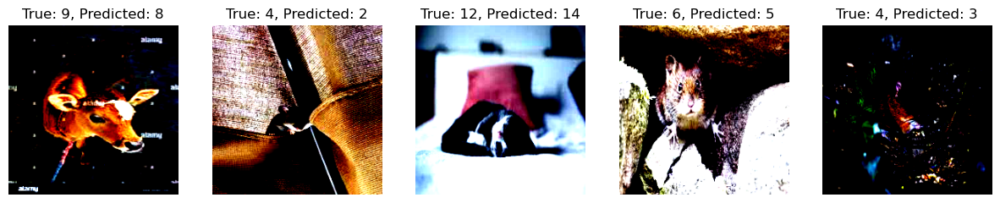

In [71]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [72]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.6000    0.2727    0.3750        22
   Butterfly     0.6667    0.7368    0.7000        19
         Cat     0.6574    0.8452    0.7396        84
         Cow     0.7812    0.6098    0.6849        41
         Dog     1.0000    0.4167    0.5882        12
    Elephant     0.6000    0.7778    0.6774        54
     Gorilla     0.0000    0.0000    0.0000         9
       Hippo     1.0000    0.0769    0.1429        13
      Lizard     0.5000    0.4800    0.4898        25
      Monkey     0.5636    0.9118    0.6966        34
       Mouse     1.0000    0.3684    0.5385        19
       Panda     0.8000    0.9600    0.8727        50
      Spider     0.8182    0.3913    0.5294        23
       Tiger     0.6800    0.6071    0.6415        28
       Zebra     0.8431    0.9149    0.8776        47

    accuracy                         0.6896       480
   macro avg     0.7007    0.5580    0.5703       480
weighted avg     0.7056   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,6,0,4,0,0,1,0,0,4,4,0,1,2,0,0
Butterfly,0,14,0,0,0,0,0,0,0,2,0,0,0,1,2
Cat,1,1,71,2,0,4,0,0,0,3,0,0,0,1,1
Cow,0,1,4,25,0,7,0,0,0,3,0,1,0,0,0
Dog,0,0,5,0,5,1,0,0,0,1,0,0,0,0,0
Elephant,1,0,3,1,0,42,0,0,1,2,0,4,0,0,0
Gorilla,0,0,1,0,0,5,0,0,0,2,0,0,0,1,0
Hippo,0,0,3,0,0,2,0,1,4,0,0,2,0,1,0
Lizard,0,2,5,0,0,3,0,0,12,1,0,1,0,0,1
Monkey,0,0,1,1,0,0,0,0,0,31,0,0,0,1,0


It seems here the learning rate of 0.001 is the ideal learning rate. Given there is only 10 epoch's being used, you do not want the learning rate too great or too small as important data has the chance of being skipped over. You can see this happening in the examples as the learning rate of 0.01 fails to pick up basically anything and has a significantly low accuracym whereas the learning rate of 0.001 has the highest of the three. And the lowest learning rate of 0.0001, while still having a decent accuracy still fails to pick up all of the needed information to properly run and have a good accuracy. Although looking a the confusion matrix you can see an obvious bias in the higher learning rate versus the smaller ones. While the 0.0001 learning rate performed suboptimally compared to the optimall learning rate, you can notice that using a smaller learning rate with this dataset is preferably to a larger one.

## Mini-dataset, with transformations

#### 2-fc_layer

##### 1)

In [73]:
transform = defineTransforms(10, 0.5, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [180, 40], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 8.4 M 
3 | fc_out    | Linear     | 615   
-----------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.629    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_43/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_43/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7229166626930237
        test_loss           1.0191047191619873
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


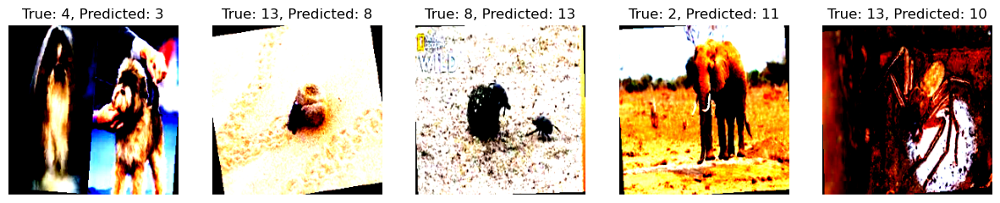

In [74]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [75]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.7778    0.5385    0.6364        26
   Butterfly     0.5714    0.4706    0.5161        17
         Cat     0.7561    0.7949    0.7750        78
         Cow     0.6857    0.7500    0.7164        32
         Dog     0.5000    0.4000    0.4444        10
    Elephant     0.9184    0.7759    0.8411        58
     Gorilla     0.5000    0.5000    0.5000         6
       Hippo     1.0000    0.2308    0.3750        13
      Lizard     0.7647    0.4815    0.5909        27
      Monkey     0.7105    0.6750    0.6923        40
       Mouse     0.8235    0.7000    0.7568        20
       Panda     0.6154    0.9302    0.7407        43
      Spider     0.5000    0.6471    0.5641        17
       Tiger     0.6364    0.8485    0.7273        33
       Zebra     0.9032    0.9333    0.9180        60

    accuracy                         0.7333       480
   macro avg     0.7109    0.6451    0.6530       480
weighted avg     0.7517   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,14,0,2,2,0,0,1,0,1,2,0,1,2,1,0
Butterfly,0,8,1,0,0,0,0,0,0,0,0,2,2,3,1
Cat,1,1,62,1,2,2,0,0,1,2,1,5,0,0,0
Cow,0,1,3,24,0,0,0,0,0,4,0,0,0,0,0
Dog,0,0,1,2,4,0,0,0,0,0,0,3,0,0,0
Elephant,1,0,2,5,0,45,1,0,0,1,0,2,1,0,0
Gorilla,0,0,0,0,0,0,3,0,0,1,1,1,0,0,0
Hippo,0,0,4,0,1,0,0,3,0,0,0,3,2,0,0
Lizard,0,3,1,0,0,0,1,0,13,0,0,1,1,6,1
Monkey,0,0,2,0,1,2,0,0,0,27,1,6,1,0,0


##### 2)

In [30]:
transform = defineTransforms(10, 5, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 1.3 K 
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.445    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_29/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_29/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.762499988079071
        test_loss           0.9249687194824219
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


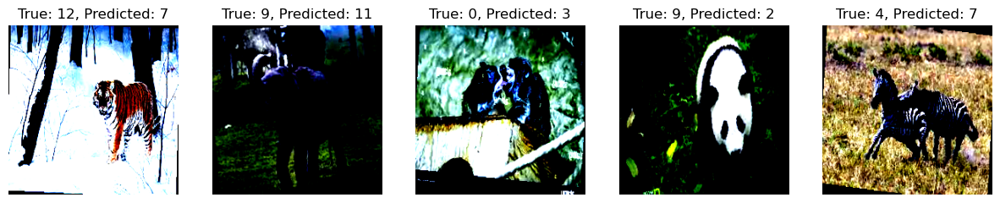

In [31]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [32]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     1.0000    0.5385    0.7000        13
   Butterfly     0.7895    0.7143    0.7500        21
         Cat     0.7273    0.8649    0.7901        74
         Cow     0.7586    0.6667    0.7097        33
         Dog     0.7692    0.5263    0.6250        19
    Elephant     0.8276    0.7869    0.8067        61
     Gorilla     0.5000    0.6000    0.5455         5
       Hippo     0.6154    0.6154    0.6154        13
      Lizard     0.8333    0.7143    0.7692        14
      Monkey     0.6000    0.7500    0.6667        32
       Mouse     0.5833    0.7000    0.6364        20
       Panda     0.8065    0.9259    0.8621        54
      Spider     1.0000    0.5000    0.6667        22
       Tiger     0.7250    0.8788    0.7945        33
       Zebra     1.0000    0.8788    0.9355        66

    accuracy                         0.7771       480
   macro avg     0.7690    0.7107    0.7249       480
weighted avg     0.7959   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,7,0,0,1,1,1,0,0,0,1,0,0,0,2,0
Butterfly,0,15,2,2,0,0,0,0,0,1,0,0,0,1,0
Cat,0,1,64,0,1,3,0,1,0,2,2,0,0,0,0
Cow,0,0,2,22,1,3,0,1,1,3,0,0,0,0,0
Dog,0,0,4,0,10,2,1,1,0,0,0,1,0,0,0
Elephant,0,0,2,1,0,48,1,2,0,3,2,1,0,1,0
Gorilla,0,0,1,1,0,0,3,0,0,0,0,0,0,0,0
Hippo,0,0,1,0,0,1,0,8,0,0,0,3,0,0,0
Lizard,0,0,2,0,0,0,0,0,10,0,0,2,0,0,0
Monkey,0,0,4,0,0,0,0,0,0,24,1,2,0,1,0


#### 3-fc_layer

##### 1)

In [46]:
transform = defineTransforms(10, 2.5, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84, 20], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 315   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_34/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_34/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6916666626930237
        test_loss            0.961062490940094
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


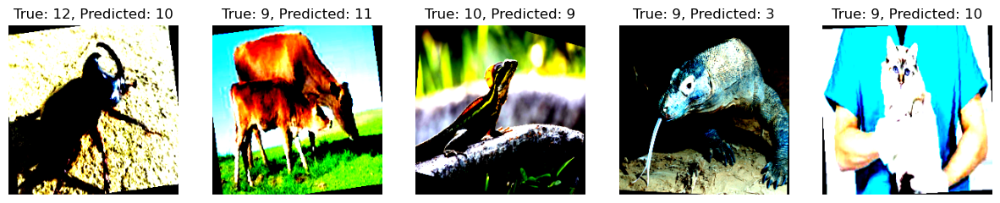

In [47]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [48]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.6364    0.5000    0.5600        28
   Butterfly     1.0000    0.5000    0.6667        16
         Cat     0.7872    0.8409    0.8132        88
         Cow     0.7083    0.5484    0.6182        31
         Dog     0.4286    0.1875    0.2609        16
    Elephant     0.5065    0.8478    0.6341        46
     Gorilla     0.5000    0.2500    0.3333         4
       Hippo     0.0000    0.0000    0.0000        11
      Lizard     0.7368    0.5600    0.6364        25
      Monkey     0.8750    0.4000    0.5490        35
       Mouse     0.5000    0.4286    0.4615        21
       Panda     0.5455    0.8780    0.6729        41
      Spider     0.3659    0.6000    0.4545        25
       Tiger     0.8846    0.6571    0.7541        35
       Zebra     0.8500    0.8793    0.8644        58

    accuracy                         0.6625       480
   macro avg     0.6217    0.5385    0.5520       480
weighted avg     0.6844   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,14,0,1,0,0,4,0,0,0,1,1,3,4,0,0
Butterfly,0,8,2,1,1,3,0,0,1,0,0,0,0,0,0
Cat,2,0,74,1,1,5,0,0,0,0,1,2,1,0,1
Cow,0,0,3,17,1,8,0,0,0,0,0,2,0,0,0
Dog,1,0,6,1,3,4,1,0,0,0,0,0,0,0,0
Elephant,1,0,1,2,0,39,0,0,0,0,0,2,0,1,0
Gorilla,1,0,0,0,0,0,1,0,0,0,0,2,0,0,0
Hippo,0,0,2,0,0,6,0,0,0,0,0,2,1,0,0
Lizard,0,0,0,0,0,0,0,0,14,0,1,1,5,2,2
Monkey,2,0,2,0,0,2,0,0,0,14,2,7,6,0,0


##### 2)

In [49]:
transform = defineTransforms(10, 5, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84, 20], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 315   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_35/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_35/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6729166507720947
        test_loss           1.0704001188278198
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


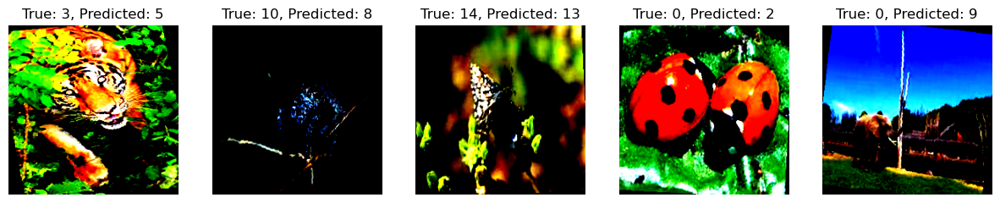

In [50]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [51]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.5333    0.5000    0.5161        16
   Butterfly     0.6316    0.6667    0.6486        18
         Cat     0.6316    0.8889    0.7385        81
         Cow     0.7273    0.3902    0.5079        41
         Dog     0.6000    0.1579    0.2500        19
    Elephant     0.6324    0.6935    0.6615        62
     Gorilla     1.0000    0.2000    0.3333         5
       Hippo     0.5000    0.1000    0.1667        10
      Lizard     0.4667    0.3889    0.4242        18
      Monkey     0.5882    0.6061    0.5970        33
       Mouse     0.2308    0.1667    0.1935        18
       Panda     0.6207    0.8182    0.7059        44
      Spider     0.7500    0.3333    0.4615        18
       Tiger     0.6774    0.7000    0.6885        30
       Zebra     0.8000    0.8955    0.8451        67

    accuracy                         0.6438       480
   macro avg     0.6260    0.5004    0.5159       480
weighted avg     0.6420   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,8,0,5,0,0,0,0,0,0,0,0,0,1,1,1
Butterfly,1,12,2,1,0,1,0,0,0,0,1,0,0,0,0
Cat,0,2,72,1,0,2,0,0,0,1,0,2,0,0,1
Cow,1,2,4,16,1,10,0,0,0,1,2,1,0,2,1
Dog,3,0,9,2,3,0,0,0,0,1,0,1,0,0,0
Elephant,0,0,5,2,0,43,0,1,0,4,3,3,1,0,0
Gorilla,0,0,1,0,0,3,1,0,0,0,0,0,0,0,0
Hippo,0,1,2,0,0,4,0,1,0,0,0,2,0,0,0
Lizard,0,0,3,0,0,0,0,0,7,0,0,1,0,2,5
Monkey,0,1,3,0,0,2,0,0,1,20,0,4,0,0,2


#### 4-fc_layer

##### 1)

In [52]:
transform = defineTransforms(10, 2.5, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [180, 80, 40, 20], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 8.4 M 
3 | fc_out    | Linear     | 315   
-----------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.673    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_36/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_36/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6604166626930237
        test_loss           1.0626108646392822
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


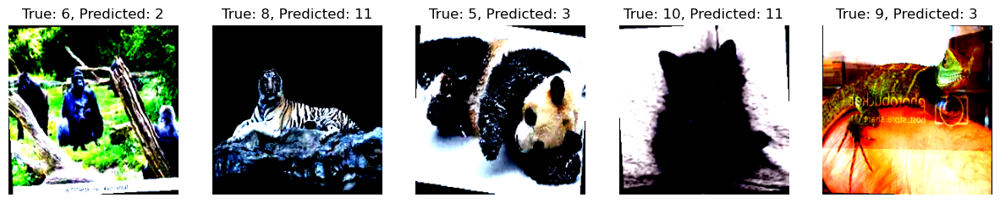

In [53]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [54]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.6250    0.2941    0.4000        17
   Butterfly     0.8125    0.5652    0.6667        23
         Cat     0.6909    0.9268    0.7917        82
         Cow     0.5778    0.6842    0.6265        38
         Dog     0.0000    0.0000    0.0000        19
    Elephant     0.7432    0.8209    0.7801        67
     Gorilla     0.0000    0.0000    0.0000         6
       Hippo     0.0000    0.0000    0.0000        11
      Lizard     0.5000    0.7333    0.5946        15
      Monkey     0.4138    0.4000    0.4068        30
       Mouse     0.4000    0.3077    0.3478        13
       Panda     0.6562    0.9130    0.7636        46
      Spider     0.5000    0.2000    0.2857        20
       Tiger     0.7234    0.8293    0.7727        41
       Zebra     0.9565    0.8462    0.8980        52

    accuracy                         0.6792       480
   macro avg     0.5066    0.5014    0.4889       480
weighted avg     0.6300   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,5,2,3,1,0,3,0,0,2,1,0,0,0,0,0
Butterfly,0,13,4,0,0,1,0,0,0,2,0,1,0,1,1
Cat,0,0,76,3,0,0,0,0,0,1,1,1,0,0,0
Cow,0,0,3,26,0,8,0,0,0,0,1,0,0,0,0
Dog,0,0,14,4,0,1,0,0,0,0,0,0,0,0,0
Elephant,0,0,1,6,1,55,0,0,0,1,0,2,0,1,0
Gorilla,0,0,0,0,0,2,0,0,0,1,0,3,0,0,0
Hippo,1,1,3,0,0,4,0,0,0,2,0,0,0,0,0
Lizard,0,0,0,0,0,0,0,0,11,0,0,1,2,1,0
Monkey,0,0,3,0,0,0,0,0,1,12,1,10,1,2,0


##### 2)

In [55]:
transform = defineTransforms(10, 5, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [180, 80, 40, 20], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 8.4 M 
3 | fc_out    | Linear     | 315   
-----------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.673    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_37/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_37/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6041666865348816
        test_loss           1.2209969758987427
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


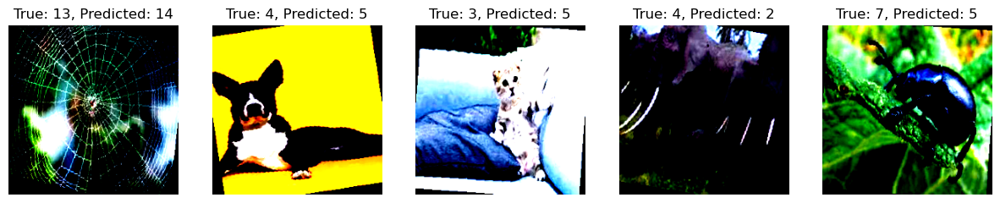

In [56]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [57]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.1818    0.1818    0.1818        11
   Butterfly     0.9167    0.4231    0.5789        26
         Cat     0.5455    0.8919    0.6769        74
         Cow     0.5405    0.5556    0.5479        36
         Dog     0.0000    0.0000    0.0000        21
    Elephant     0.6203    0.7000    0.6577        70
     Gorilla     0.0000    0.0000    0.0000         3
       Hippo     0.0000    0.0000    0.0000        11
      Lizard     0.3158    0.5000    0.3871        24
      Monkey     0.3438    0.3548    0.3492        31
       Mouse     0.4286    0.3333    0.3750        18
       Panda     0.6885    0.8571    0.7636        49
      Spider     0.0000    0.0000    0.0000        20
       Tiger     0.9500    0.4750    0.6333        40
       Zebra     0.7736    0.8913    0.8283        46

    accuracy                         0.5813       480
   macro avg     0.4203    0.4109    0.3987       480
weighted avg     0.5466   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,2,0,2,0,1,2,0,0,1,3,0,0,0,0,0
Butterfly,1,11,7,0,0,1,0,0,3,3,0,0,0,0,0
Cat,1,0,66,3,0,2,0,0,0,0,1,0,0,0,1
Cow,0,0,4,20,0,9,0,0,1,1,1,0,0,0,0
Dog,0,0,15,0,0,6,0,0,0,0,0,0,0,0,0
Elephant,0,0,5,8,0,49,0,0,1,4,1,2,0,0,0
Gorilla,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0
Hippo,0,0,8,0,0,3,0,0,0,0,0,0,0,0,0
Lizard,3,0,4,0,0,1,0,0,12,2,2,0,0,0,0
Monkey,1,0,3,1,0,1,0,0,1,11,2,11,0,0,0


The 2-fc_layer again seems to be the optimal amount of layers as was it with the no transformation runs. It seems that the more layers the model has to go through, the more it creates a bias towards certain animals and classifies others mistakenly as those animals.

### Chaning learning rate

Lr = 0.01

In [76]:
transform = defineTransforms(10, 0.5, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84], 0.01, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 1.3 K 
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.445    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_44/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_44/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.19583334028720856
        test_loss           2.4329397678375244
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


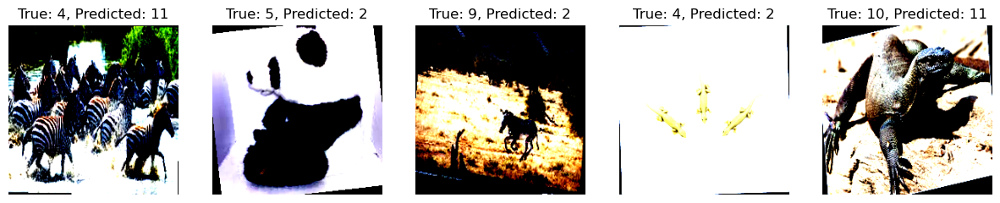

In [77]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [78]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.0000    0.0000    0.0000        20
   Butterfly     0.1667    0.0909    0.1176        22
         Cat     0.2323    0.5750    0.3309        80
         Cow     0.0000    0.0000    0.0000        31
         Dog     0.0000    0.0000    0.0000        19
    Elephant     0.1579    0.0435    0.0682        69
     Gorilla     0.0000    0.0000    0.0000         5
       Hippo     0.0000    0.0000    0.0000        11
      Lizard     0.0000    0.0000    0.0000        19
      Monkey     0.0000    0.0000    0.0000        28
       Mouse     0.0000    0.0000    0.0000        20
       Panda     0.1566    0.8298    0.2635        47
      Spider     0.0000    0.0000    0.0000        22
       Tiger     0.0000    0.0000    0.0000        31
       Zebra     0.0000    0.0000    0.0000        56

    accuracy                         0.1875       480
   macro avg     0.0476    0.1026    0.0520       480
weighted avg     0.0844   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,0,1,11,0,0,2,0,0,0,0,0,6,0,0,0
Butterfly,0,2,9,0,0,1,0,0,0,0,0,10,0,0,0
Cat,0,1,46,0,0,6,0,0,0,0,0,27,0,0,0
Cow,0,1,14,0,0,1,0,0,0,0,0,15,0,0,0
Dog,0,0,10,0,0,1,0,0,0,1,0,7,0,0,0
Elephant,0,3,27,0,0,3,0,0,0,0,0,36,0,0,0
Gorilla,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0
Hippo,0,0,5,0,0,0,0,0,0,0,0,6,0,0,0
Lizard,0,0,11,0,0,0,0,0,0,1,0,7,0,0,0
Monkey,0,0,10,0,0,0,0,0,0,0,0,18,0,0,0


Lr = 0.001

In [79]:
transform = defineTransforms(10, 0.5, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 1.3 K 
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.445    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_45/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_45/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6916666626930237
        test_loss           1.0355300903320312
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


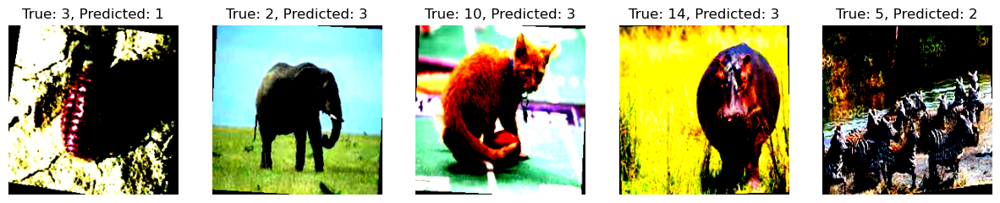

In [80]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [81]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.7333    0.4783    0.5789        23
   Butterfly     0.5455    0.6667    0.6000         9
         Cat     0.6854    0.8592    0.7625        71
         Cow     0.6500    0.7222    0.6842        36
         Dog     0.7500    0.4000    0.5217        15
    Elephant     0.6289    0.8592    0.7262        71
     Gorilla     1.0000    0.7000    0.8235        10
       Hippo     1.0000    0.2000    0.3333        10
      Lizard     1.0000    0.3684    0.5385        19
      Monkey     1.0000    0.5610    0.7188        41
       Mouse     0.3600    0.6923    0.4737        13
       Panda     0.7500    0.8235    0.7850        51
      Spider     0.8333    0.2941    0.4348        17
       Tiger     0.6250    0.7895    0.6977        38
       Zebra     0.9348    0.7679    0.8431        56

    accuracy                         0.7063       480
   macro avg     0.7664    0.6121    0.6348       480
weighted avg     0.7561   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,11,1,1,2,2,5,0,0,0,0,1,0,0,0,0
Butterfly,1,6,1,0,0,1,0,0,0,0,0,0,0,0,0
Cat,0,0,61,1,0,7,0,0,0,0,0,1,0,1,0
Cow,0,2,0,26,0,4,0,0,0,0,3,1,0,0,0
Dog,0,0,3,0,6,3,0,0,0,0,0,3,0,0,0
Elephant,0,0,4,4,0,61,0,0,0,0,1,1,0,0,0
Gorilla,0,0,1,0,0,2,7,0,0,0,0,0,0,0,0
Hippo,1,0,2,1,0,4,0,2,0,0,0,0,0,0,0
Lizard,0,0,2,1,0,0,0,0,7,0,1,2,1,2,3
Monkey,2,0,5,3,0,1,0,0,0,23,2,2,0,3,0


Lr = 0.0001

In [82]:
transform = defineTransforms(10, 0.5, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "miniAnimalDataset", class_names, [120, 84], 0.0001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 1.3 K 
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.445    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_46/checkpoints/epoch=9-step=600.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_46/checkpoints/epoch=9-step=600.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.49791666865348816
        test_loss           1.6203303337097168
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


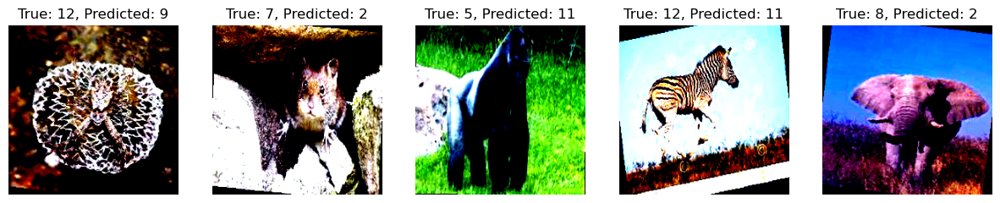

In [83]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [84]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.6667    0.1053    0.1818        19
   Butterfly     0.5714    0.2963    0.3902        27
         Cat     0.5984    0.7917    0.6816        96
         Cow     0.3571    0.1667    0.2273        30
         Dog     0.0000    0.0000    0.0000        18
    Elephant     0.4505    0.7193    0.5541        57
     Gorilla     0.0000    0.0000    0.0000        10
       Hippo     0.0000    0.0000    0.0000         7
      Lizard     0.0000    0.0000    0.0000        12
      Monkey     0.4412    0.3571    0.3947        42
       Mouse     0.0000    0.0000    0.0000        20
       Panda     0.4659    0.8542    0.6029        48
      Spider     0.0000    0.0000    0.0000        10
       Tiger     0.4091    0.6429    0.5000        28
       Zebra     0.7460    0.8393    0.7899        56

    accuracy                         0.5271       480
   macro avg     0.3138    0.3182    0.2882       480
weighted avg     0.4501   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,2,1,6,1,0,4,0,0,0,0,0,3,0,0,2
Butterfly,0,8,5,0,0,2,0,0,0,3,0,3,0,6,0
Cat,0,2,76,1,0,6,0,0,0,7,0,0,0,4,0
Cow,0,1,6,5,0,9,0,0,1,1,0,4,0,1,2
Dog,0,1,7,1,0,5,0,0,0,0,0,0,0,3,1
Elephant,1,0,3,1,0,41,0,0,0,0,0,9,0,1,1
Gorilla,0,0,3,0,0,4,0,0,0,0,0,3,0,0,0
Hippo,0,0,1,1,0,4,0,0,0,0,0,1,0,0,0
Lizard,0,1,1,0,0,0,0,0,0,2,0,2,1,3,2
Monkey,0,0,5,3,0,6,0,0,0,15,0,11,0,2,0


Looking again at the learning rates but this time with transformations, we again see that the learning rate of 0.001 is the optimal learning rate. While the transformations clearly add confusion to the model, this learning rate allows the model to "jump" enough where it is not over stepping or understepping and can still, to an extent, make sense of the data it is reading and correctly fit images to their correct classes on a more consistent basis.

Analyzing the runs using datasets, they all performed worse than when no transformations were made. They all but two tend to be all over the place regardless of their fc-layers or their learning rate. While again, 2-fc_layers and a learning rate seems to be ideal it is hard to see consistent accuracy between those units that we were seeing before with the runs that did not involve any type of rotations. I believe this could be because with the colored datasets, there is already enough information there for the model to learn from that adding these rotations adds more confusion and possibly makes it misidentify certain animals within the dataset.

### Full Dataset with no Transformations

In [85]:
transform = defineTransforms(0, 0, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "animalsCombined", class_names, [120, 84], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 1.3 K 
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.445    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_47/checkpoints/epoch=9-step=8040.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_47/checkpoints/epoch=9-step=8040.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8997201323509216
        test_loss           0.7636857032775879
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


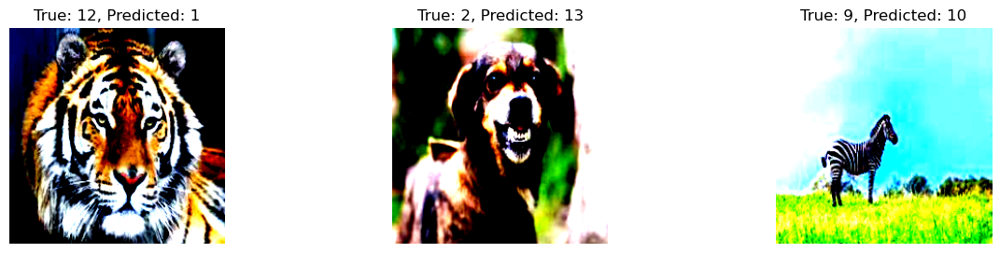

In [86]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [87]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.8913    0.8935    0.8924       413
   Butterfly     0.8391    0.9559    0.8937       431
         Cat     0.8929    0.8596    0.8760       456
         Cow     0.9199    0.8165    0.8651       436
         Dog     0.9527    0.8764    0.9130       437
    Elephant     0.9157    0.9260    0.9208       446
     Gorilla     0.8954    0.8976    0.8965       410
       Hippo     0.8665    0.8789    0.8726       421
      Lizard     0.8566    0.9436    0.8980       443
      Monkey     0.8844    0.8778    0.8811       401
       Mouse     0.8797    0.9187    0.8988       406
       Panda     0.9222    0.9284    0.9253       447
      Spider     0.9209    0.8870    0.9036       407
       Tiger     0.8886    0.8635    0.8759       425
       Zebra     0.9685    0.9514    0.9599       453

    accuracy                         0.8986      6432
   macro avg     0.8996    0.8983    0.8982      6432
weighted avg     0.9001   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,369,16,2,2,2,0,1,2,5,3,0,2,9,0,0
Butterfly,5,412,0,2,1,0,0,1,2,0,1,0,3,2,2
Cat,5,4,392,1,4,5,4,7,5,2,17,1,3,4,2
Cow,6,14,6,356,6,8,7,6,2,6,7,6,3,2,1
Dog,6,4,5,7,383,4,4,5,1,3,7,1,5,2,0
Elephant,0,3,1,5,1,413,4,4,1,5,1,2,0,6,0
Gorilla,1,3,2,1,1,6,368,10,3,4,1,6,1,2,1
Hippo,6,4,3,4,0,3,6,370,5,6,3,3,0,7,1
Lizard,0,3,4,0,0,2,0,3,418,2,6,0,2,3,0
Monkey,1,6,3,1,2,3,8,7,3,352,2,6,2,5,0


3-fc

In [90]:
transform = defineTransforms(0, 0, (224, 224), 224)
datamodule, t_loader,  model = runTrainer(transform, "animalsCombined", class_names, [180, 80, 20], 0.001, 10)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 8.4 M 
3 | fc_out    | Linear     | 315   
-----------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.663    Total estimated model params size (MB)


Training: |                                               | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
Restoring states from the checkpoint path at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_49/checkpoints/epoch=9-step=8040.ckpt
Loaded model weights from the checkpoint at /Users/tylerbair/Desktop/College/CS445/Group Project/ProjectSnapshot-main/lightning_logs/version_49/checkpoints/epoch=9-step=8040.ckpt


Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.8843283653259277
        test_loss           0.7680171132087708
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


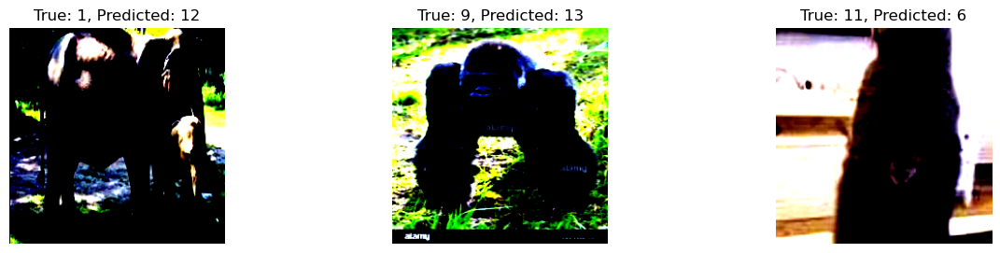

In [91]:
miss_animal = miss_classified(model, t_loader)
a, b = make_cm(datamodule, model)
class_report = classification_report(a, b, target_names=class_names, digits=4)

In [92]:
new_animal_df = show_confusion_matrix(a, b, class_names)
print(class_report)
new_animal_df

              precision    recall  f1-score   support

      Beetle     0.9475    0.8337    0.8870       433
   Butterfly     0.9544    0.8211    0.8827       408
         Cat     0.7805    0.9143    0.8421       490
         Cow     0.7895    0.8844    0.8343       424
         Dog     0.8789    0.8832    0.8811       411
    Elephant     0.9438    0.8630    0.9016       467
     Gorilla     0.9361    0.8383    0.8845       402
       Hippo     0.9341    0.8170    0.8717       399
      Lizard     0.9577    0.8851    0.9200       435
      Monkey     0.7882    0.8910    0.8365       376
       Mouse     0.9155    0.9111    0.9133       416
       Panda     0.8889    0.9621    0.9241       449
      Spider     0.8707    0.8767    0.8737       438
       Tiger     0.8876    0.8337    0.8598       445
       Zebra     0.8236    0.9681    0.8901       439

    accuracy                         0.8798      6432
   macro avg     0.8865    0.8789    0.8801      6432
weighted avg     0.8860   

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Zebra
Beetle,361,7,4,5,8,2,3,1,3,4,6,3,17,2,7
Butterfly,6,335,5,10,9,1,0,3,2,0,1,1,12,8,15
Cat,1,0,448,7,8,2,1,4,1,6,5,1,4,1,1
Cow,0,1,10,375,5,2,2,1,0,3,3,14,0,2,6
Dog,2,0,21,9,363,0,0,1,1,7,2,2,3,0,0
Elephant,0,0,4,32,2,403,7,3,0,9,1,0,1,2,3
Gorilla,1,0,12,2,6,2,337,1,0,13,0,20,3,2,3
Hippo,1,0,13,10,2,7,5,326,1,13,4,3,2,10,2
Lizard,1,1,3,3,1,2,0,0,385,15,5,1,8,4,6
Monkey,1,0,10,4,1,1,3,3,1,335,5,3,2,3,4


Running the optimal 2-fc_layer and learning rate of 0.001 on the full animal dataset backed up our thesis and validated that these are in fact opitmal parameters to run on the full dataset and not just the mini. We initially thought that there could be significant overfitting happening with the model but after seeing the results we can lay those worries to rest. It does seem from the results that the model does a nice job of accurately fitting animals to their intended classes. The accuracy on the 2-fc_layer with a learning rate of 0.001 matches closely with the accuracy we were acheiving on the mini-dataset run with those same exact parameters. To our surprise, it actually performed marginally better than the min-dataset

We also ran another expirement on the full dataset using 3-fc_layers to see if our initial thoughts of adding more layers decreased accuracy. Again, to our surprise, the accuracy of a 3-fc_layer run on the full dataset performed better than the miniset. It also closely rivaled the 2-fc_layer run on the full dataset but still fell just short of the 2-fc_layer performance. This leads us to believe that on the larger dataset, the 2-fc_layer still will be the best performer with the hyper parameters, but potentially there could be ones that give the edge to the 3-fc_layers, but tinkering with the hyperparams too much can lead to overfitting which we are trying to avoid.

# Mushrooms

## Mini Mushroom Dataset Experiments  
To determine the best hyperparameters for mushroom species classification, a series of experiments were performed to test the effect of the following: transformations, network architecture, learning rate, and epochs. These experiments were performed in replicates on the mini mushroom dataset that included 10/100 classes present in the full dataset. 

In [ ]:
dataset0 = datasets.ImageFolder(root="miniMushroomDataset",transform=None)

class_names = dataset0.classes
print(class_names)
print(len(class_names))

['Trametes hirsuta', 'Trametes ochracea', 'Trametes versicolor', 'Tremella mesenterica', 'Trichaptum biforme', 'Tricholomopsis rutilans', 'Urnula craterium', 'Verpa bohemica', 'Vulpicida pinastri', 'Xanthoria parietina']


10


### Network Architecture [120,84, 20], Learning Rate 0.001, 10 Epochs, Batch Size of 32

### No Transformations
For these replicates, no transformation was performed aside from resizing of the image to a standard size and a center crop into a square sizing.

In [ ]:
myNoTransform = defineTransforms(0, 0, (224, 224), 224) 

#### Run 1

In [ ]:
noTransRep01, ntr01Model = runTrainer(transformSpecs=myNoTransform, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[120, 84, 20], lr=0.001, bs=32, numEpochs=10)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_24\checkpoints\epoch=9-step=120.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_24\checkpoints\epoch=9-step=120.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers w

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │          0.84375          │
│         test_loss         │    0.6037663221359253     │
└───────────────────────────┴───────────────────────────┘

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


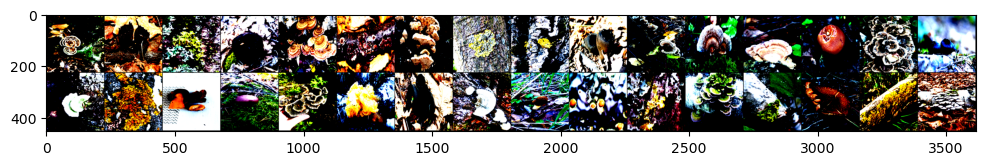

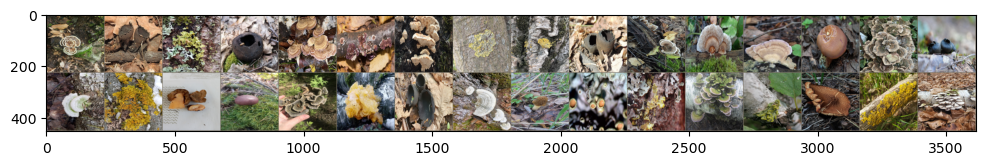

In [ ]:
showImages(noTransRep01)

In [ ]:
yt, yp = getClassificationReport(noTransRep01, ntr01Model)
print(classification_report(yt, yp, target_names=class_names,digits=4, zero_division='warn'))

                         precision    recall  f1-score   support

       Trametes hirsuta     1.0000    1.0000    1.0000         6
      Trametes ochracea     0.9091    0.9091    0.9091        11
    Trametes versicolor     0.9167    0.8462    0.8800        13
   Tremella mesenterica     1.0000    1.0000    1.0000         7
     Trichaptum biforme     0.8333    1.0000    0.9091         5
Tricholomopsis rutilans     0.7000    1.0000    0.8235         7
       Urnula craterium     0.9000    0.9000    0.9000        10
         Verpa bohemica     0.7778    0.7778    0.7778         9
     Vulpicida pinastri     0.9000    0.7500    0.8182        12
    Xanthoria parietina     1.0000    0.9375    0.9677        16

               accuracy                         0.8958        96
              macro avg     0.8937    0.9121    0.8985        96
           weighted avg     0.9040    0.8958    0.8964        96



In [ ]:
yo_df = confusion_matrix(yt, yp)
yo_df = pd.DataFrame(yo_df, index=class_names, columns=class_names) 
conf_val_df = yo_df.style.background_gradient(cmap='Blues')
conf_val_df

,Trametes hirsuta,Trametes ochracea,Trametes versicolor,Tremella mesenterica,Trichaptum biforme,Tricholomopsis rutilans,Urnula craterium,Verpa bohemica,Vulpicida pinastri,Xanthoria parietina
Trametes hirsuta,6,0,0,0,0,0,0,0,0,0
Trametes ochracea,0,10,0,0,0,0,0,1,0,0
Trametes versicolor,0,0,11,0,1,1,0,0,0,0
Tremella mesenterica,0,0,0,7,0,0,0,0,0,0
Trichaptum biforme,0,0,0,0,5,0,0,0,0,0
Tricholomopsis rutilans,0,0,0,0,0,7,0,0,0,0
Urnula craterium,0,0,0,0,0,1,9,0,0,0
Verpa bohemica,0,0,0,0,0,1,1,7,0,0
Vulpicida pinastri,0,1,1,0,0,0,0,1,9,0
Xanthoria parietina,0,0,0,0,0,0,0,0,1,15


#### Run 2

In [ ]:
#noTransRep02 = runTrainer(myTransform, "miniMushroomDataset")
noTransRep02, ntr02Model = runTrainer(transformSpecs=myNoTransform, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[120, 84, 20], lr=0.001, bs=32, numEpochs=10)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_26\checkpoints\epoch=9-step=120.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_26\checkpoints\epoch=9-step=120.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers w

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.8854166865348816     │
│         test_loss         │    0.6058281064033508     │
└───────────────────────────┴───────────────────────────┘

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


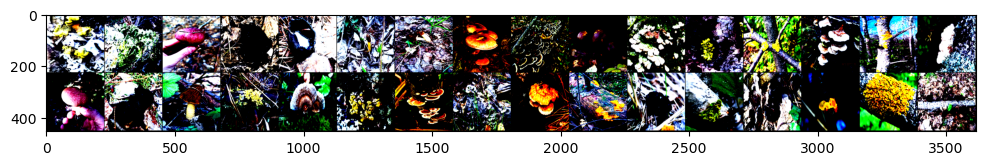

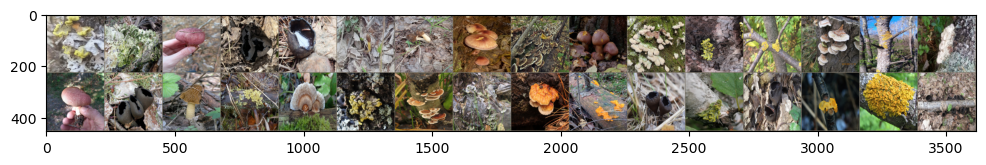

In [ ]:
showImages(noTransRep02)

In [ ]:
yt2, yp2 = getClassificationReport(noTransRep02, ntr02Model)
print(classification_report(yt2, yp2, target_names=class_names,digits=4, zero_division='warn'))

                         precision    recall  f1-score   support

       Trametes hirsuta     0.9091    0.8333    0.8696        12
      Trametes ochracea     0.8333    0.8333    0.8333        12
    Trametes versicolor     0.9167    0.9167    0.9167        12
   Tremella mesenterica     0.7857    1.0000    0.8800        11
     Trichaptum biforme     0.8750    0.8750    0.8750         8
Tricholomopsis rutilans     1.0000    1.0000    1.0000        11
       Urnula craterium     1.0000    1.0000    1.0000         4
         Verpa bohemica     1.0000    0.9231    0.9600        13
     Vulpicida pinastri     1.0000    0.7500    0.8571         8
    Xanthoria parietina     0.8333    1.0000    0.9091         5

               accuracy                         0.9062        96
              macro avg     0.9153    0.9131    0.9101        96
           weighted avg     0.9137    0.9062    0.9062        96



In [ ]:
yo_df2 = confusion_matrix(yt2, yp2)
yo_df2 = pd.DataFrame(yo_df2, index=class_names, columns=class_names) 
conf_val_df2 = yo_df2.style.background_gradient(cmap='Blues')
conf_val_df2

,Trametes hirsuta,Trametes ochracea,Trametes versicolor,Tremella mesenterica,Trichaptum biforme,Tricholomopsis rutilans,Urnula craterium,Verpa bohemica,Vulpicida pinastri,Xanthoria parietina
Trametes hirsuta,10,2,0,0,0,0,0,0,0,0
Trametes ochracea,0,10,0,1,1,0,0,0,0,0
Trametes versicolor,1,0,11,0,0,0,0,0,0,0
Tremella mesenterica,0,0,0,11,0,0,0,0,0,0
Trichaptum biforme,0,0,1,0,7,0,0,0,0,0
Tricholomopsis rutilans,0,0,0,0,0,11,0,0,0,0
Urnula craterium,0,0,0,0,0,0,4,0,0,0
Verpa bohemica,0,0,0,1,0,0,0,12,0,0
Vulpicida pinastri,0,0,0,1,0,0,0,0,6,1
Xanthoria parietina,0,0,0,0,0,0,0,0,0,5


#### Run 3

In [ ]:
#noTransRep03 = runTrainer(myTransform, "miniMushroomDataset")
noTransRep03, ntr03Model = runTrainer(transformSpecs=myNoTransform, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[120, 84, 20], lr=0.001, bs=32, numEpochs=10)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_27\checkpoints\epoch=9-step=120.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_27\checkpoints\epoch=9-step=120.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers w

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │          0.78125          │
│         test_loss         │    0.7291590571403503     │
└───────────────────────────┴───────────────────────────┘

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


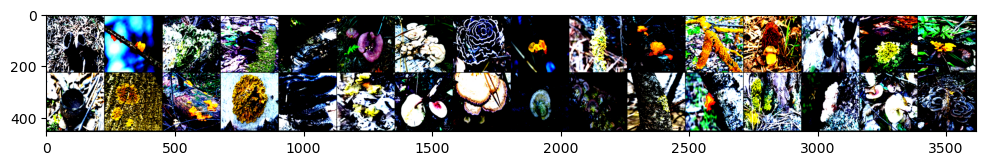

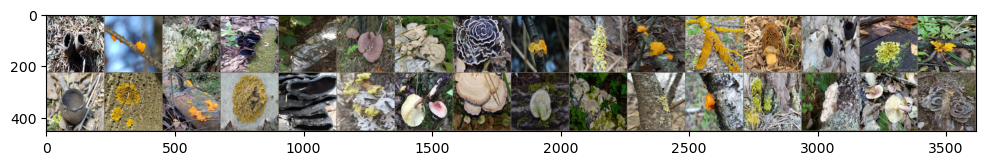

In [ ]:
showImages(noTransRep03)

In [ ]:
yt3, yp3 = getClassificationReport(noTransRep03, ntr03Model)
print(classification_report(yt3, yp3, target_names=class_names,digits=4, zero_division='warn'))

                         precision    recall  f1-score   support

       Trametes hirsuta     0.8571    1.0000    0.9231        12
      Trametes ochracea     1.0000    0.6000    0.7500         5
    Trametes versicolor     0.8750    0.8750    0.8750         8
   Tremella mesenterica     0.8000    0.6667    0.7273         6
     Trichaptum biforme     0.9091    0.9091    0.9091        11
Tricholomopsis rutilans     0.9231    0.8000    0.8571        15
       Urnula craterium     0.8235    1.0000    0.9032        14
         Verpa bohemica     0.6667    1.0000    0.8000         6
     Vulpicida pinastri     1.0000    0.8750    0.9333         8
    Xanthoria parietina     1.0000    0.8182    0.9000        11

               accuracy                         0.8750        96
              macro avg     0.8855    0.8544    0.8578        96
           weighted avg     0.8902    0.8750    0.8735        96



In [ ]:
yo_df3 = confusion_matrix(yt3, yp3)
yo_df3 = pd.DataFrame(yo_df3, index=class_names, columns=class_names) 
conf_val_df3 = yo_df3.style.background_gradient(cmap='Blues')
conf_val_df3

,Trametes hirsuta,Trametes ochracea,Trametes versicolor,Tremella mesenterica,Trichaptum biforme,Tricholomopsis rutilans,Urnula craterium,Verpa bohemica,Vulpicida pinastri,Xanthoria parietina
Trametes hirsuta,12,0,0,0,0,0,0,0,0,0
Trametes ochracea,1,3,1,0,0,0,0,0,0,0
Trametes versicolor,0,0,7,0,0,0,0,1,0,0
Tremella mesenterica,0,0,0,4,0,0,2,0,0,0
Trichaptum biforme,0,0,0,0,10,0,1,0,0,0
Tricholomopsis rutilans,1,0,0,0,1,12,0,1,0,0
Urnula craterium,0,0,0,0,0,0,14,0,0,0
Verpa bohemica,0,0,0,0,0,0,0,6,0,0
Vulpicida pinastri,0,0,0,0,0,1,0,0,7,0
Xanthoria parietina,0,0,0,1,0,0,0,1,0,9


In [ ]:
# [train], [test]
noTransReps = [[0.84375, 0.8985, 0.78125], [0.8854, 0.9062, 0.8750]]

### With Transformations  
These experiments were perfromed with a 10 degree random rotation (may rotate +/1 10 degrees) and a random horizontal flip were each image has a 0.5 probability of flipping in addition to the standard size and center crop detailed above.

In [ ]:
# pass: randRota, randHoriFlip, resizeVal, centCrop
myTransform1 = defineTransforms(10, 0.50, (224, 224), 224) 

#### Run 1

In [138]:
trans1Rep01, t1r01Model = runTrainer(transformSpecs=myTransform1, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[120, 84, 20], lr=0.001, bs=32, numEpochs=10)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_28\checkpoints\epoch=9-step=120.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_28\checkpoints\epoch=9-step=120.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers w

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.4895833432674408     │
│         test_loss         │    1.1621474027633667     │
└───────────────────────────┴───────────────────────────┘

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


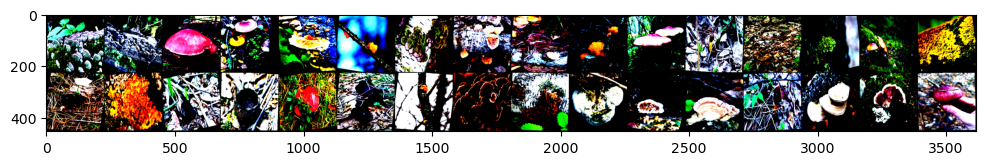

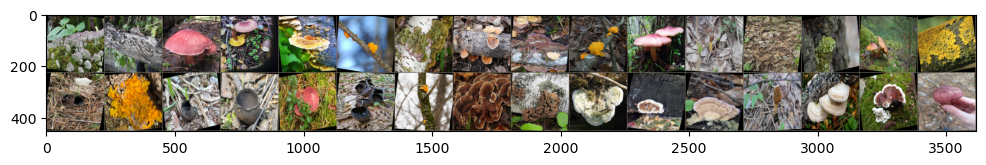

In [139]:
showImages(trans1Rep01)

In [140]:
yt4, yp4 = getClassificationReport(trans1Rep01, t1r01Model)
print(classification_report(yt4, yp4, target_names=class_names,digits=4, zero_division='warn'))

C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                         precision    recall  f1-score   support

       Trametes hirsuta     0.7143    0.4545    0.5556        11
      Trametes ochracea     0.0000    0.0000    0.0000         7
    Trametes versicolor     0.3000    0.6000    0.4000         5
   Tremella mesenterica     0.8000    0.5000    0.6154         8
     Trichaptum biforme     0.2667    0.6667    0.3810         6
Tricholomopsis rutilans     0.2500    0.2000    0.2222        10
       Urnula craterium     0.8462    0.9167    0.8800        12
         Verpa bohemica     0.0000    0.0000    0.0000         7
     Vulpicida pinastri     0.4000    0.7059    0.5106        17
    Xanthoria parietina     0.7143    0.3846    0.5000        13

               accuracy                         0.4792        96
              macro avg     0.4291    0.4428    0.4065        96
           weighted avg     0.4802    0.4792    0.4509        96



In [141]:
yo_df4 = confusion_matrix(yt4, yp4)
yo_df4 = pd.DataFrame(yo_df4, index=class_names, columns=class_names) 
conf_val_df4 = yo_df4.style.background_gradient(cmap='Blues')
conf_val_df4

,Trametes hirsuta,Trametes ochracea,Trametes versicolor,Tremella mesenterica,Trichaptum biforme,Tricholomopsis rutilans,Urnula craterium,Verpa bohemica,Vulpicida pinastri,Xanthoria parietina
Trametes hirsuta,5,1,2,0,1,1,0,0,1,0
Trametes ochracea,2,0,1,0,1,1,0,0,2,0
Trametes versicolor,0,0,3,0,0,2,0,0,0,0
Tremella mesenterica,0,0,1,4,1,0,0,0,0,2
Trichaptum biforme,0,0,1,0,4,0,1,0,0,0
Tricholomopsis rutilans,0,0,1,0,3,2,1,0,3,0
Urnula craterium,0,0,0,0,1,0,11,0,0,0
Verpa bohemica,0,0,0,0,1,1,0,0,5,0
Vulpicida pinastri,0,0,1,1,3,0,0,0,12,0
Xanthoria parietina,0,0,0,0,0,1,0,0,7,5


#### Run 2

In [142]:
trans1Rep02, t1r02Model = runTrainer(transformSpecs=myTransform1, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[120, 84, 20], lr=0.001, bs=32, numEpochs=10)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_29\checkpoints\epoch=9-step=120.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_29\checkpoints\epoch=9-step=120.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers w

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │            0.5            │
│         test_loss         │    1.3127013444900513     │
└───────────────────────────┴───────────────────────────┘

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


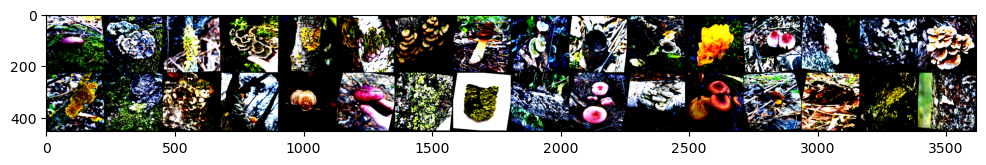

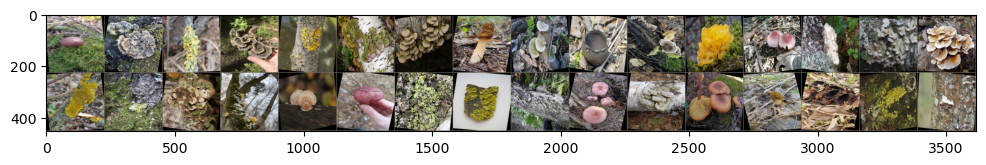

In [143]:
showImages(trans1Rep02)

In [144]:
yt5, yp5 = getClassificationReport(trans1Rep02, t1r02Model)
print(classification_report(yt5, yp5, target_names=class_names,digits=4, zero_division='warn'))

                         precision    recall  f1-score   support

       Trametes hirsuta     0.6667    0.2222    0.3333         9
      Trametes ochracea     0.3333    0.1429    0.2000         7
    Trametes versicolor     0.3333    0.2727    0.3000        11
   Tremella mesenterica     0.6000    0.6000    0.6000        10
     Trichaptum biforme     0.2500    0.1250    0.1667         8
Tricholomopsis rutilans     0.4211    0.5333    0.4706        15
       Urnula craterium     0.5500    1.0000    0.7097        11
         Verpa bohemica     0.1667    0.2000    0.1818         5
     Vulpicida pinastri     0.4444    0.4000    0.4211        10
    Xanthoria parietina     0.6154    0.8000    0.6957        10

               accuracy                         0.4688        96
              macro avg     0.4381    0.4296    0.4079        96
           weighted avg     0.4562    0.4688    0.4372        96



In [145]:
yo_df5 = confusion_matrix(yt5, yp5)
yo_df5 = pd.DataFrame(yo_df5, index=class_names, columns=class_names) 
conf_val_df5 = yo_df5.style.background_gradient(cmap='Blues')
conf_val_df5

,Trametes hirsuta,Trametes ochracea,Trametes versicolor,Tremella mesenterica,Trichaptum biforme,Tricholomopsis rutilans,Urnula craterium,Verpa bohemica,Vulpicida pinastri,Xanthoria parietina
Trametes hirsuta,2,1,2,1,1,1,0,0,0,1
Trametes ochracea,0,1,1,1,1,1,1,0,1,0
Trametes versicolor,0,0,3,0,1,6,0,0,1,0
Tremella mesenterica,0,0,0,6,0,0,1,1,1,1
Trichaptum biforme,0,1,1,2,1,0,1,2,0,0
Tricholomopsis rutilans,1,0,2,0,0,8,1,1,2,0
Urnula craterium,0,0,0,0,0,0,11,0,0,0
Verpa bohemica,0,0,0,0,0,1,3,1,0,0
Vulpicida pinastri,0,0,0,0,0,1,1,1,4,3
Xanthoria parietina,0,0,0,0,0,1,1,0,0,8


#### Run 3

In [146]:
trans1Rep03, t1r03Model = runTrainer(transformSpecs=myTransform1, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[120, 84, 20], lr=0.001, bs=32, numEpochs=10)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_30\checkpoints\epoch=9-step=120.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_30\checkpoints\epoch=9-step=120.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers w

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.5208333134651184     │
│         test_loss         │     1.407300353050232     │
└───────────────────────────┴───────────────────────────┘

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


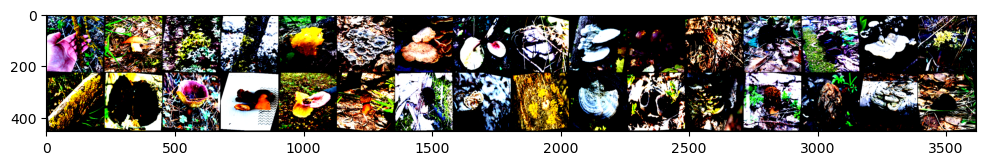

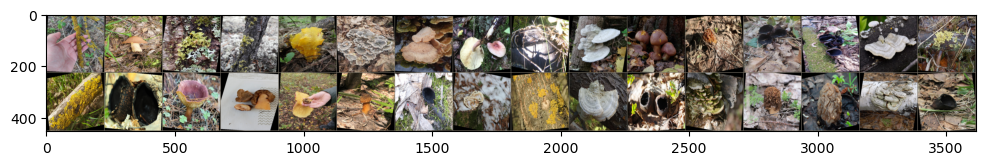

In [147]:
showImages(trans1Rep03)

In [148]:
yt6, yp6 = getClassificationReport(trans1Rep03, t1r03Model)
print(classification_report(yt6, yp6, target_names=class_names,digits=4, zero_division='warn'))

C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                         precision    recall  f1-score   support

       Trametes hirsuta     0.4211    0.7273    0.5333        11
      Trametes ochracea     0.0000    0.0000    0.0000        10
    Trametes versicolor     0.6364    0.7778    0.7000         9
   Tremella mesenterica     0.5000    0.2857    0.3636         7
     Trichaptum biforme     0.4615    0.5455    0.5000        11
Tricholomopsis rutilans     0.1667    0.1429    0.1538         7
       Urnula craterium     0.9167    0.9167    0.9167        12
         Verpa bohemica     0.5000    0.6000    0.5455        10
     Vulpicida pinastri     0.6667    0.5455    0.6000        11
    Xanthoria parietina     0.5000    0.6250    0.5556         8

               accuracy                         0.5417        96
              macro avg     0.4769    0.5166    0.4868        96
           weighted avg     0.4941    0.5417    0.5082        96



In [149]:
yo_df6 = confusion_matrix(yt6, yp6)
yo_df6 = pd.DataFrame(yo_df6, index=class_names, columns=class_names) 
conf_val_df6 = yo_df6.style.background_gradient(cmap='Blues')
conf_val_df6

,Trametes hirsuta,Trametes ochracea,Trametes versicolor,Tremella mesenterica,Trichaptum biforme,Tricholomopsis rutilans,Urnula craterium,Verpa bohemica,Vulpicida pinastri,Xanthoria parietina
Trametes hirsuta,8,0,1,0,2,0,0,0,0,0
Trametes ochracea,4,0,1,0,1,2,0,2,0,0
Trametes versicolor,1,0,7,0,0,1,0,0,0,0
Tremella mesenterica,0,0,0,2,0,0,1,0,1,3
Trichaptum biforme,2,0,1,0,6,0,0,2,0,0
Tricholomopsis rutilans,2,0,0,0,3,1,0,1,0,0
Urnula craterium,0,0,0,0,0,0,11,1,0,0
Verpa bohemica,0,0,1,0,1,0,0,6,1,1
Vulpicida pinastri,2,0,0,1,0,1,0,0,6,1
Xanthoria parietina,0,0,0,1,0,1,0,0,1,5


In [165]:
# transform = 910, 0.5, (224, 224), 224)
trans1Reps = [[0.489583, 0.5, 0.52083313],[0.4792, 0.4688, 0.5417]]

### No Transformations with a Learning Rate of 0.001

#### Run 1

In [151]:
noTranslrRep01, ntlr01Model = runTrainer(transformSpecs=myNoTransform, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[120, 84, 20], lr=0.0001, bs=32, numEpochs=10)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_31\checkpoints\epoch=9-step=120.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_31\checkpoints\epoch=9-step=120.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers w

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.4895833432674408     │
│         test_loss         │    1.6617608070373535     │
└───────────────────────────┴───────────────────────────┘

In [152]:
yt7, yp7 = getClassificationReport(noTranslrRep01, ntlr01Model)
print(classification_report(yt7, yp7, target_names=class_names,digits=4, zero_division='warn'))

                         precision    recall  f1-score   support

       Trametes hirsuta     0.3333    0.1667    0.2222         6
      Trametes ochracea     0.0000    0.0000    0.0000         7
    Trametes versicolor     1.0000    0.1250    0.2222         8
   Tremella mesenterica     0.2000    0.2857    0.2353         7
     Trichaptum biforme     0.3214    1.0000    0.4865         9
Tricholomopsis rutilans     1.0000    0.0909    0.1667        11
       Urnula craterium     0.8889    0.5714    0.6957        14
         Verpa bohemica     0.5238    1.0000    0.6875        11
     Vulpicida pinastri     0.7500    0.6000    0.6667        10
    Xanthoria parietina     0.7857    0.8462    0.8148        13

               accuracy                         0.5208        96
              macro avg     0.5803    0.4686    0.4198        96
           weighted avg     0.6376    0.5208    0.4743        96



#### Run 2

In [153]:
noTranslrRep02, ntlr02Model = runTrainer(transformSpecs=myNoTransform, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[120, 84, 20], lr=0.0001, bs=32, numEpochs=10)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_32\checkpoints\epoch=9-step=120.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_32\checkpoints\epoch=9-step=120.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers w

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │           0.375           │
│         test_loss         │    1.6988091468811035     │
└───────────────────────────┴───────────────────────────┘

In [154]:
yt8, yp8 = getClassificationReport(noTranslrRep02, ntlr02Model)
print(classification_report(yt8, yp8, target_names=class_names,digits=4, zero_division='warn'))

C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                         precision    recall  f1-score   support

       Trametes hirsuta     0.0000    0.0000    0.0000         8
      Trametes ochracea     0.0000    0.0000    0.0000         8
    Trametes versicolor     0.5000    0.5385    0.5185        13
   Tremella mesenterica     1.0000    0.1818    0.3077        11
     Trichaptum biforme     1.0000    0.1111    0.2000         9
Tricholomopsis rutilans     0.1667    0.6000    0.2609         5
       Urnula craterium     0.4000    1.0000    0.5714         4
         Verpa bohemica     1.0000    0.1429    0.2500        14
     Vulpicida pinastri     0.2941    0.4167    0.3448        12
    Xanthoria parietina     0.3125    0.8333    0.4545        12

               accuracy                         0.3542        96
              macro avg     0.4673    0.3824    0.2908        96
           weighted avg     0.5230    0.3542    0.2980        96



#### Run 3

In [155]:
noTranslrRep03, ntlr03Model = runTrainer(transformSpecs=myNoTransform, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[120, 84, 20], lr=0.0001, bs=32, numEpochs=10)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_33\checkpoints\epoch=9-step=120.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_33\checkpoints\epoch=9-step=120.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers w

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.4895833432674408     │
│         test_loss         │    1.6767843961715698     │
└───────────────────────────┴───────────────────────────┘

In [156]:
yt9, yp9 = getClassificationReport(noTranslrRep03, ntlr03Model)
print(classification_report(yt9, yp9, target_names=class_names,digits=4, zero_division='warn'))

C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\siura\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                         precision    recall  f1-score   support

       Trametes hirsuta     0.5333    1.0000    0.6957         8
      Trametes ochracea     0.0000    0.0000    0.0000         9
    Trametes versicolor     0.5000    0.5000    0.5000         8
   Tremella mesenterica     0.0000    0.0000    0.0000        15
     Trichaptum biforme     0.4444    0.5714    0.5000         7
Tricholomopsis rutilans     0.6364    0.7778    0.7000         9
       Urnula craterium     0.5714    0.4000    0.4706        10
         Verpa bohemica     1.0000    0.3333    0.5000        12
     Vulpicida pinastri     1.0000    0.3636    0.5333        11
    Xanthoria parietina     0.1842    1.0000    0.3111         7

               accuracy                         0.4375        96
              macro avg     0.4870    0.4946    0.4211        96
           weighted avg     0.4907    0.4375    0.3970        96



In [163]:
# [train], [test]
noTransLR0001Reps = [[0.48958, 0.375, 0.489583],[0.5208, 0.3542, 0.4375]]

### No Transformations with 50 Epochs

#### Run 1

In [157]:
noTransepRep01, ntep01Model = runTrainer(transformSpecs=myNoTransform, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[120, 84, 20], lr=0.001, bs=32, numEpochs=50)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=50` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_34\checkpoints\epoch=49-step=600.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_34\checkpoints\epoch=49-step=600.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.8333333134651184     │
│         test_loss         │    0.9819499850273132     │
└───────────────────────────┴───────────────────────────┘

In [158]:
yt10, yp10 = getClassificationReport(noTransepRep01, ntep01Model)
print(classification_report(yt10, yp10, target_names=class_names,digits=4, zero_division='warn'))

                         precision    recall  f1-score   support

       Trametes hirsuta     1.0000    0.8000    0.8889        10
      Trametes ochracea     0.8000    1.0000    0.8889         4
    Trametes versicolor     1.0000    0.8667    0.9286        15
   Tremella mesenterica     0.8750    0.8750    0.8750         8
     Trichaptum biforme     0.8333    0.7143    0.7692         7
Tricholomopsis rutilans     0.8667    1.0000    0.9286        13
       Urnula craterium     1.0000    0.8333    0.9091        12
         Verpa bohemica     0.5455    1.0000    0.7059         6
     Vulpicida pinastri     0.7778    0.7778    0.7778         9
    Xanthoria parietina     0.8182    0.7500    0.7826        12

               accuracy                         0.8542        96
              macro avg     0.8516    0.8617    0.8455        96
           weighted avg     0.8791    0.8542    0.8580        96



#### Rep 2

In [159]:
noTransepRep02, ntep02Model = runTrainer(transformSpecs=myNoTransform, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[120, 84, 20], lr=0.001, bs=32, numEpochs=50)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 5.6 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
5.6 M     Trainable params
0         Non-trainable params
5.6 M     Total params
22.448    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=50` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_35\checkpoints\epoch=49-step=600.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_35\checkpoints\epoch=49-step=600.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.8958333134651184     │
│         test_loss         │    0.8259915709495544     │
└───────────────────────────┴───────────────────────────┘

In [160]:
yt11, yp11 = getClassificationReport(noTransepRep02, ntep02Model)
print(classification_report(yt11, yp11, target_names=class_names,digits=4, zero_division='warn'))

                         precision    recall  f1-score   support

       Trametes hirsuta     0.8889    1.0000    0.9412         8
      Trametes ochracea     1.0000    0.7500    0.8571         8
    Trametes versicolor     1.0000    0.9231    0.9600        13
   Tremella mesenterica     0.8750    1.0000    0.9333         7
     Trichaptum biforme     0.9000    1.0000    0.9474         9
Tricholomopsis rutilans     0.9091    0.9091    0.9091        11
       Urnula craterium     1.0000    1.0000    1.0000        11
         Verpa bohemica     0.8000    0.8889    0.8421         9
     Vulpicida pinastri     0.7778    1.0000    0.8750         7
    Xanthoria parietina     1.0000    0.7692    0.8696        13

               accuracy                         0.9167        96
              macro avg     0.9151    0.9240    0.9135        96
           weighted avg     0.9269    0.9167    0.9160        96



In [162]:
# [train], [test]
noTransEpochs50Reps = [[0.83333, 0.89583],[0.8542, 0.9167]]

### Network Architecture [180, 40, 20] and 50 Epochs

#### Rep 1

In [167]:
noTranHidEpRep01, ntHidEp01Model = runTrainer(transformSpecs=myNoTransform, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[180, 40, 20], lr=0.001, bs=32, numEpochs=50)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 8.4 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.630    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=50` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_36\checkpoints\epoch=49-step=600.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_36\checkpoints\epoch=49-step=600.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │          0.9375           │
│         test_loss         │    0.3408215045928955     │
└───────────────────────────┴───────────────────────────┘

In [168]:
yt12, yp12 = getClassificationReport(noTranHidEpRep01, ntHidEp01Model)
print(classification_report(yt12, yp12, target_names=class_names,digits=4, zero_division='warn'))

                         precision    recall  f1-score   support

       Trametes hirsuta     0.7143    0.7143    0.7143         7
      Trametes ochracea     0.8889    0.8889    0.8889         9
    Trametes versicolor     1.0000    1.0000    1.0000        12
   Tremella mesenterica     0.7273    1.0000    0.8421         8
     Trichaptum biforme     0.8333    0.7143    0.7692         7
Tricholomopsis rutilans     1.0000    1.0000    1.0000         6
       Urnula craterium     0.9167    1.0000    0.9565        11
         Verpa bohemica     0.9231    0.8571    0.8889        14
     Vulpicida pinastri     1.0000    0.7273    0.8421        11
    Xanthoria parietina     0.9167    1.0000    0.9565        11

               accuracy                         0.8958        96
              macro avg     0.8920    0.8902    0.8859        96
           weighted avg     0.9036    0.8958    0.8945        96



#### Rep 2

In [169]:
noTranHidEpRep02, ntHidEp02Model = runTrainer(transformSpecs=myNoTransform, datasetName="miniMushroomDataset", classNames=class_names, nHiddens=[180, 40, 20], lr=0.001, bs=32, numEpochs=50)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 8.4 M 
3 | fc_out    | Linear     | 210   
-----------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.630    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=50` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_37\checkpoints\epoch=49-step=600.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\termProject\ProjectSnapshot\lightning_logs\version_37\checkpoints\epoch=49-step=600.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9166666865348816     │
│         test_loss         │    0.4606614112854004     │
└───────────────────────────┴───────────────────────────┘

In [170]:
yt13, yp13 = getClassificationReport(noTranHidEpRep02, ntHidEp02Model)
print(classification_report(yt13, yp13, target_names=class_names,digits=4, zero_division='warn'))

                         precision    recall  f1-score   support

       Trametes hirsuta     0.7778    1.0000    0.8750         7
      Trametes ochracea     1.0000    0.7500    0.8571         8
    Trametes versicolor     1.0000    1.0000    1.0000         8
   Tremella mesenterica     1.0000    1.0000    1.0000         7
     Trichaptum biforme     1.0000    1.0000    1.0000         7
Tricholomopsis rutilans     1.0000    0.9091    0.9524        11
       Urnula craterium     1.0000    0.9231    0.9600        13
         Verpa bohemica     0.8000    1.0000    0.8889         8
     Vulpicida pinastri     0.7500    0.8182    0.7826        11
    Xanthoria parietina     0.9333    0.8750    0.9032        16

               accuracy                         0.9167        96
              macro avg     0.9261    0.9275    0.9219        96
           weighted avg     0.9274    0.9167    0.9178        96



In [171]:
# use network [180, 40, 20] and epochs 50
noTrans_180_40_20_Epochs50Reps = [[0.9375, 0.91666],[0.8958, 0.9167]]

In [ ]:
# Data from mini tests
#[[transform], [network], lr, epochs, train acc, test acc]
miniTesting = [
[['rep01'] ,[0, 0, (224, 224), 224], [120, 80, 20], 0.001, 10, 0.84375, 0.8854],
[['rep02'], [0, 0, (224, 224), 224], [120, 80, 20], 0.001, 10, 0.8958, 0.9062],
[['rep03'], [0, 0, (224, 224), 224], [120, 80, 20], 0.001, 10, 0.78125, 0.8750],

[['rep01'], [10, 0.5, (224, 224), 224], [120, 80, 20], 0.001, 10, 0.48958, 0.4792],
[['rep02'], [10, 0.5, (224, 224), 224], [120, 80, 20], 0.001, 10, 0.5, 0.4688],
[['rep03'], [10, 0.5, (224, 224), 224], [120, 80, 20], 0.001, 10, 0.52083, 0.5417],

[['rep01'],[0, 0, (224, 224), 224], [120, 80, 20], 0.001, 50, 0.83333, 0.8542],
[['rep02'],[0, 0, (224, 224), 224], [120, 80, 20], 0.001, 50, 0.89583, 0.9167],

[['rep01'],[0, 0, (224, 224), 224], [120, 80, 20], 0.0001, 10, 0.48958, 0.5208],
[['rep02'],[0, 0, (224, 224), 224], [120, 80, 20], 0.0001, 10, 0.375, 0.3542],
[['rep03'],[0, 0, (224, 224), 224], [120, 80, 20], 0.0001, 10, 0.48958, 0.4375],

[['rep01'],[0, 0, (224, 224), 224], [180, 40, 20], 0.001, 50, 0.9375, 0.8958],
[['rep02'],[0, 0, (224, 224), 224], [180, 40, 20], 0.001, 50, 0.91666, 0.9167],

[['rep01'],[10, 0.5, (224, 224), 224], [180, 40, 20], 0.0001, 50, 0.572916, 0.7188],
[['rep02'],[10, 0.5, (224, 224), 224], [180, 40, 20], 0.0001, 50, 0.7291660, 0.7500]
]

In [ ]:
myCols = ['Repplicate', 'Transformations', 'Network Architecture', 'Learning Rate', 'Epochs', 'Train Accuracy', 'Test Accuracy']
mtdf = pd.DataFrame(miniTesting, columns=myCols)
mtdf

,Repplicate,Transformations,Network Architecture,Learning Rate,Epochs,Train Accuracy,Test Accuracy
0,[rep01],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0010,10,0.843750,0.8854
1,[rep02],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0010,10,0.895800,0.9062
2,[rep03],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0010,10,0.781250,0.8750
3,[rep01],"[10, 0.5, (224, 224), 224]","[120, 80, 20]",0.0010,10,0.489580,0.4792
4,[rep02],"[10, 0.5, (224, 224), 224]","[120, 80, 20]",0.0010,10,0.500000,0.4688
5,[rep03],"[10, 0.5, (224, 224), 224]","[120, 80, 20]",0.0010,10,0.520830,0.5417
6,[rep01],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0010,50,0.833330,0.8542
7,[rep02],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0010,50,0.895830,0.9167
8,[rep01],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0001,10,0.489580,0.5208
9,[rep02],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0001,10,0.375000,0.3542


In [ ]:
mtdf.to_excel('jens_minimush_reps.xlsx')
mtdf.to_csv('jens_minimusg_reps.csv')

## Full Mushroom Dataset Runs
Utilizing the best performing hyperparameters, the full mushroom dataset consisting of 100 different classes was tested. Although the best performing number of epochs was 50, my system could not process those effeciently and due to an extended run time and GPU load, a max number of 10 epochs was utilized. Although this experiment was able to run on my system, time constraints permitted only one run with 10 epochs and a second run with 5 epochs for comparison.

In [ ]:
dataset0 = datasets.ImageFolder(root="dataset",transform=None)

class_names = dataset0.classes
print(class_names)
print(len(class_names))

['Amanita citrina', 'Amanita muscaria', 'Amanita pantherina', 'Amanita rubescens', 'Apioperdon pyriforme', 'Armillaria borealis', 'Artomyces pyxidatus', 'Bjerkandera adusta', 'Boletus edulis', 'Boletus reticulatus', 'Calocera viscosa', 'Calycina citrina', 'Cantharellus cibarius', 'Cerioporus squamosus', 'Cetraria islandica', 'Chlorociboria aeruginascens', 'Chondrostereum purpureum', 'Cladonia fimbriata', 'Cladonia rangiferina', 'Cladonia stellaris', 'Clitocybe nebularis', 'Coltricia perennis', 'Coprinellus disseminatus', 'Coprinellus micaceus', 'Coprinopsis atramentaria', 'Coprinus comatus', 'Crucibulum laeve', 'Daedaleopsis confragosa', 'Daedaleopsis tricolor', 'Evernia mesomorpha', 'Evernia prunastri', 'Flammulina velutipes', 'Fomes fomentarius', 'Fomitopsis betulina', 'Fomitopsis pinicola', 'Ganoderma applanatum', 'Graphis scripta', 'Gyromitra esculenta', 'Gyromitra gigas', 'Gyromitra infula', 'Hericium coralloides', 'Hygrophoropsis aurantiaca', 'Hypholoma fasciculare', 'Hypholoma l

In [ ]:
mcn = np.array(class_names).reshape(25,4)
mushClassNamesdf = pd.DataFrame(mcn)
mushClassNamesdf

,0,1,2,3
0,Amanita citrina,Amanita muscaria,Amanita pantherina,Amanita rubescens
1,Apioperdon pyriforme,Armillaria borealis,Artomyces pyxidatus,Bjerkandera adusta
2,Boletus edulis,Boletus reticulatus,Calocera viscosa,Calycina citrina
3,Cantharellus cibarius,Cerioporus squamosus,Cetraria islandica,Chlorociboria aeruginascens
4,Chondrostereum purpureum,Cladonia fimbriata,Cladonia rangiferina,Cladonia stellaris
5,Clitocybe nebularis,Coltricia perennis,Coprinellus disseminatus,Coprinellus micaceus
6,Coprinopsis atramentaria,Coprinus comatus,Crucibulum laeve,Daedaleopsis confragosa
7,Daedaleopsis tricolor,Evernia mesomorpha,Evernia prunastri,Flammulina velutipes
8,Fomes fomentarius,Fomitopsis betulina,Fomitopsis pinicola,Ganoderma applanatum
9,Graphis scripta,Gyromitra esculenta,Gyromitra gigas,Gyromitra infula


In [ ]:
mushClassNamesdf.to_excel('full_mush_class_names.xlsx')
mushClassNamesdf.to_csv('full_mush_class_names.csv')

### Network Architecture [180, 40, 20], Learning Rate 0.001, 10 Epochs, and No Transformations

In [ ]:
# pass: randRota, randHoriFlip, resizeVal, centCrop
myNoTransform = defineTransforms(0, 0, (224, 224), 224) 

#### Rep 1 With 10 Epochs

In [ ]:
noTransFullDataset, noTransFullDatasetModel = runTrainer(transformSpecs=myNoTransform, datasetName="dataset", classNames=class_names, nHiddens=[180, 40, 20], lr=0.001, bs=32, numEpochs=10)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
You are using a CUDA device ('NVIDIA GeForce RTX 4050 Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 8.4 M 
3 | fc_out    | Linear     | 2.1 K 
---------------------------

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=10` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\filesForTermProject\lightning_logs\version_1\checkpoints\epoch=9-step=19340.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\filesForTermProject\lightning_logs\version_1\checkpoints\epoch=9-step=19340.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a 

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.8222696781158447     │
│         test_loss         │    1.6521921157836914     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
yt_ntf, yp_ntf = getClassificationReport(noTransFullDataset, noTransFullDatasetModel)
print(classification_report(yt_ntf, yp_ntf, target_names=class_names,digits=4, zero_division='warn'))

                             precision    recall  f1-score   support

            Amanita citrina     0.8600    0.6515    0.7414        66
           Amanita muscaria     0.9322    0.9150    0.9235       871
         Amanita pantherina     0.7714    0.7105    0.7397        76
          Amanita rubescens     0.6991    0.7670    0.7315       103
       Apioperdon pyriforme     0.7826    0.8072    0.7947       223
        Armillaria borealis     0.7872    0.6491    0.7115        57
        Artomyces pyxidatus     0.9245    0.7778    0.8448       189
         Bjerkandera adusta     0.7549    0.8280    0.7897        93
             Boletus edulis     0.8161    0.7774    0.7963       274
        Boletus reticulatus     0.7447    0.6481    0.6931        54
           Calocera viscosa     0.8873    0.8514    0.8690        74
           Calycina citrina     0.8000    0.8772    0.8368       114
      Cantharellus cibarius     0.9044    0.7278    0.8066       169
       Cerioporus squamosus     0

In [ ]:
ntf_df = confusion_matrix(yt_ntf, yp_ntf)
ntf_df = pd.DataFrame(ntf_df, index=class_names, columns=class_names) 
conf_val_ntf_df = ntf_df.style.background_gradient(cmap='Blues')
conf_val_ntf_df

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


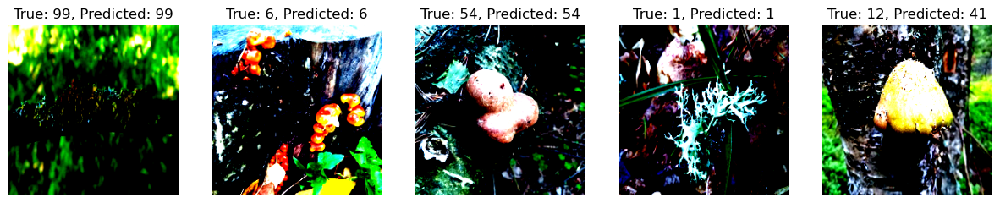

In [ ]:
miss_ntf = miss_classified(noTransFullDatasetModel, noTransFullDataset.test_dataloader(), 5)

#### Rep 2 With 5 Epochs

In [ ]:
noTransFullDataset02, noTransFullDatasetModel02, noTransFullDatasetLoader02 = runTrainer(transformSpecs=myNoTransform, datasetName="dataset", classNames=class_names, nHiddens=[180, 40, 20], lr=0.001, bs=32, numEpochs=5)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type       | Params
-----------------------------------------
0 | conv1     | Conv2d     | 168   
1 | conv2     | Conv2d     | 880   
2 | fc_layers | ModuleList | 8.4 M 
3 | fc_out    | Linear     | 2.1 K 
-----------------------------------------
8.4 M     Trainable params
0         Non-trainable params
8.4 M     Total params
33.638    Total estimated model params size (MB)
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers`

Training: |                                                                                      | 0/? [00:00<…

`Trainer.fit` stopped: `max_epochs=5` reached.
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
Restoring states from the checkpoint path at C:\Users\siura\Documents\Documents\Education\CSU\CS445\filesForTermProject\lightning_logs\version_2\checkpoints\epoch=4-step=9670.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at C:\Users\siura\Documents\Documents\Education\CSU\CS445\filesForTermProject\lightning_logs\version_2\checkpoints\epoch=4-step=9670.ckpt
C:\Users\siura\anaconda3\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'test_dataloader' does not have many workers which may be a bot

Testing: |                                                                                       | 0/? [00:00<…

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.6629140973091125     │
│         test_loss         │    1.4165542125701904     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
yt_ntf2, yp_ntf2 = getClassificationReport(noTransFullDataset02, noTransFullDatasetModel02)
print(classification_report(yt_ntf2, yp_ntf2, target_names=class_names,digits=4, zero_division='warn'))

                             precision    recall  f1-score   support

            Amanita citrina     0.3613    0.7049    0.4778        61
           Amanita muscaria     0.8643    0.8821    0.8731       823
         Amanita pantherina     0.6842    0.1757    0.2796        74
          Amanita rubescens     0.4020    0.4184    0.4100        98
       Apioperdon pyriforme     0.4000    0.5268    0.4547       205
        Armillaria borealis     0.5500    0.2340    0.3284        47
        Artomyces pyxidatus     0.6986    0.8202    0.7545       178
         Bjerkandera adusta     0.4500    0.5422    0.4918        83
             Boletus edulis     0.4738    0.5728    0.5186       316
        Boletus reticulatus     0.5000    0.2037    0.2895        54
           Calocera viscosa     0.9286    0.7959    0.8571        98
           Calycina citrina     0.7965    0.7965    0.7965       113
      Cantharellus cibarius     0.6468    0.8261    0.7255       184
       Cerioporus squamosus     0

In [ ]:
ntf2_df = confusion_matrix(yt_ntf2, yp_ntf2)
ntf2_df = pd.DataFrame(ntf2_df, index=class_names, columns=class_names) 
conf_val_ntf2_df = ntf2_df.style.background_gradient(cmap='Blues')
conf_val_ntf2_df

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


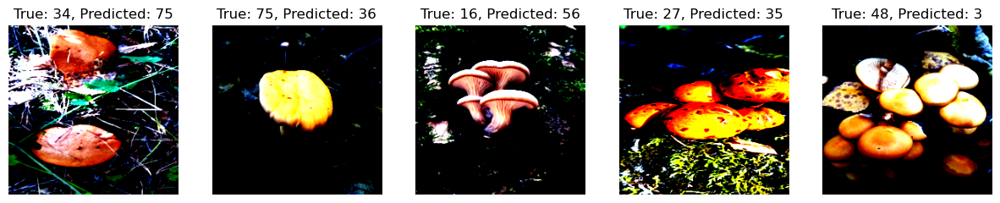

In [ ]:
miss_ntf2 = miss_classified(noTransFullDatasetModel02, noTransFullDatasetLoader02, 5)

## Discussion

### Recap of Mini Mushroom Dataset Experimental Results

In [10]:
miniSorted = pd.read_csv('jens_minimusg_reps.csv')
mt = miniSorted.sort_values('Test Accuracy', ascending=False)
mt2 = mt.drop(columns=mt.columns[0], inplace=False)
mt2

,Repplicate,Transformations,Network Architecture,Learning Rate,Epochs,Train Accuracy,Test Accuracy
7,['rep02'],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0010,50,0.895830,0.9167
12,['rep02'],"[0, 0, (224, 224), 224]","[180, 40, 20]",0.0010,50,0.916660,0.9167
1,['rep02'],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0010,10,0.895800,0.9062
11,['rep01'],"[0, 0, (224, 224), 224]","[180, 40, 20]",0.0010,50,0.937500,0.8958
0,['rep01'],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0010,10,0.843750,0.8854
2,['rep03'],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0010,10,0.781250,0.8750
6,['rep01'],"[0, 0, (224, 224), 224]","[120, 80, 20]",0.0010,50,0.833330,0.8542
14,['rep02'],"[10, 0.5, (224, 224), 224]","[180, 40, 20]",0.0001,50,0.729166,0.7500
13,['rep01'],"[10, 0.5, (224, 224), 224]","[180, 40, 20]",0.0001,50,0.572916,0.7188
5,['rep03'],"[10, 0.5, (224, 224), 224]","[120, 80, 20]",0.0010,10,0.520830,0.5417


### Mini Datset Analysis

While we did not have time to fully investigate, we suspect there may be an issue with the missclassified images and their respective classes denoted on the images. Just a disclosure that the images missclassified are truly missclassified, but the correct and incorrect class may be inaccurate.

Mini mushroom dataset results show that both network architectures [120, 80, 20] and [180, 40, 20] with a learning rate 0f 0.0010 performed similarly when classifying data without additional transformations (no rotation or flipping) irrespective of using 10 or 50 epochs. Test accuracy for three different experiments consisting of 2 - 3 replicates each, two utilzing the  [120, 80, 20] network and the other the [180, 40, 20] network, averaged 0.889, 0.885, and 0.906 % accuracy respectively. Using additional epochs may have increased the test accuracy score for similar experiments. But this would come with a time tradeoff as these experiments would take longer to run. Future testing of additional epochs is warranted to determine if accuracy can increase and whether or not the improvement gained by this is worth the extra computational time cost.

To test the effect of learning rate, one experiment with three replicates utilizing a network consisting of [120, 80, 20], 10 epochs and a LR of 0.0001 was performed. Test accuracy for these replicates averaged to 0.438 %. This was considerably lower than experiments with a LR of 0.001. Ideally a second experiment should have been performed utilzing the lower learning rate and 50 epochs to dig into the cause of this reduced performance. However, it is hypothesized that the lower learning rate in conjunction with fewer epochs did not allow the model to accurately learn quickly enough. We anticipate that with more epochs, the slower learing rate could have been overcome and performance would have improved. Future experiments should probe at this relationship further.

Transformations showed a strong effect on test accuracy. Both transformation experiments used the same transformations but employed different networks, learning rates, and epochs number. The first experiment consisted of three replicates utilzing the [120, 80, 20] network, LR of 0.001 and 10 epochs. Test accuracy for these reps averaged 0.497 %. The second experiment ustlized the [180, 40, 20] network, a LR of 0.0001, and 50 epochs. Test accuracy for this experiment improved to an average of 0.734 %. Ideally, additional experiments should have been performed to tease out the cause of almost a two fold increase in test accuracy. We anticipate that again the lower epochs of 10 in conjunction with a more diverse and varying data set to train on (die to the transformations) required more epochs to learn effectively.

Mini dataset testing highlighted some key details for determining the best performing network to utilzing for using with the full dataset. From the data above, it was determined that a network of [180, 40, 20], LR = 0.001 and 50 epochs should be used. Estimated run time for this experiment was over 8 hours and the GPU load spiked to 100 % repeatedly. Due to these constraints, only 10 epochs were used for testing with the entire dataset. 



### Full Dataset Analysis
Performance on the full dataset with [180, 40, 20], LR 0.001 and 10 epochs showed 0.820 % test accuracy which was lower than, but still close to performance seen during mini dataset testing. Due to extended computational run time and the poor performance of previosu experiments  that utilized 10 epochs for transformed data, the full data set was not tested further. As a followup to, one last experiment was run that used the same details but changing the epochs to 5. We knew this would liekyl perform quite poorly, but the run was possible within the timeframe allowed. Test accuracy for this run was 0.659 % which was surprising. 

Missclassified images from the 10 epoch full dataset run were attempted to be gathered using the functions, but for some odd reason the images included correctly identified data as well.

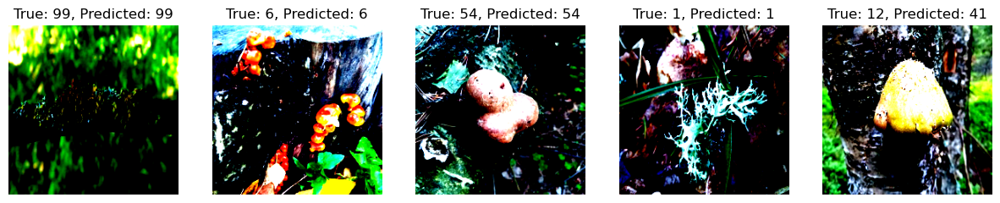

Above you can see that four correctly identified classes were presented and one missclassified image. The misclassified image was a *Cantharellus cibarius* but classified as a *Hygrophoropsis aurantiaca*. Mushroom classification seems difficult, especially to the untrained eye. These species were researched further and the *Cantharellus cibarius* is a golden chanterelle while the *Hygrophoropsis aurantiaca* is known as a false chanterelle. the images themselves look very similar to begin with as seen below so this is not a surprising  missclassification. However, the photo of the mushroom used in the dataset looks quite disimilar to my untrained eye.

Golden chanterelle

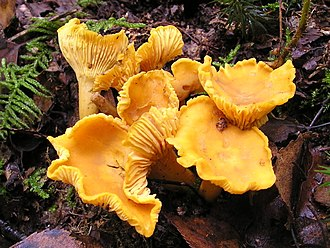  
https://en.wikipedia.org/wiki/Cantharellus_cibarius

False chanterelle

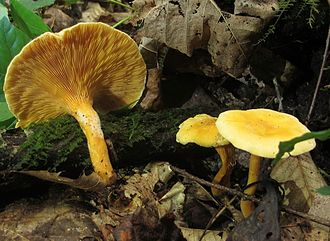  
https://en.wikipedia.org/wiki/Hygrophoropsis_aurantiaca  


For the full dataset run with 5 epochs, the missclassified function correctly pulled out five truly misclassified images as seen below. The fourth image was researched further for more information. This is an image of a misclassified *Daedaleopsis confragosa* as a *Ganoderma applanatum* species. Real life images of these two species look remarkebly similar to a lay person with no knowledge of mushroom species. It is impressive that many of this images could be classified accurately to begin with.

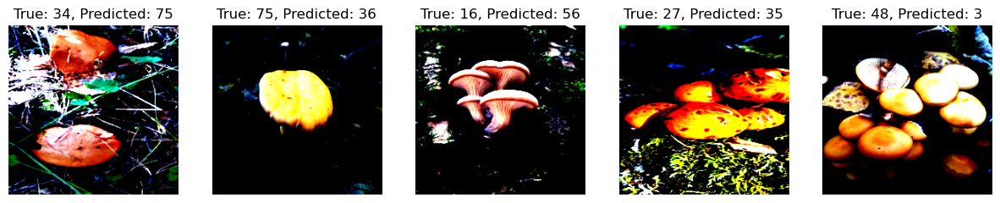  


*D. confragosa*  

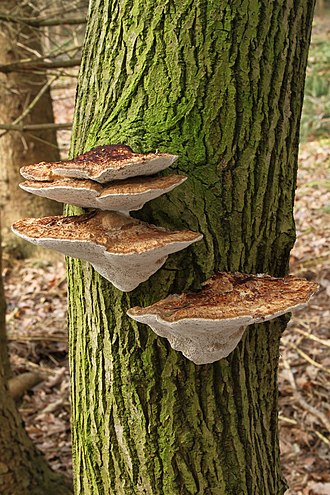  
https://en.wikipedia.org/wiki/Daedaleopsis_confragosa
  
*G. applanatum*  

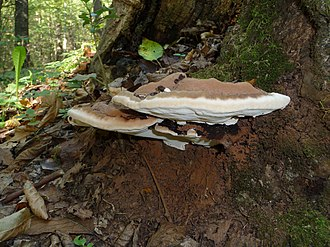  
https://en.wikipedia.org/wiki/Ganoderma_applanatum  


***
## Combined (mini-animals, mini-mushrooms, flowers)

#### Class names

In [12]:
dataset1=datasets.ImageFolder(root="minisAndFlowers",transform=None)

class_names=dataset1.classes
print(class_names)
print(len(class_names))

['Beetle', 'Butterfly', 'Cat', 'Cow', 'Dog', 'Elephant', 'Gorilla', 'Hippo', 'Lizard', 'Monkey', 'Mouse', 'Panda', 'Spider', 'Tiger', 'Trametes hirsuta', 'Trametes ochracea', 'Trametes versicolor', 'Tremella mesenterica', 'Trichaptum biforme', 'Tricholomopsis rutilans', 'Urnula craterium', 'Verpa bohemica', 'Vulpicida pinastri', 'Xanthoria parietina', 'Zebra', 'daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
30



The tests below are for color and grayscale

In [ ]:
# Grayscale
transform = gray_transform(224,224)
datamodule_g1, t_loader_g1,  model_g1, df_g1 = runTrainer(transform, "minisAndFlowers", class_names, [300], 0.001, 50, color=False, l=True,transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Grayscale')
datamodule_g2, t_loader_g2,  model_g2, df_g2 = runTrainer(transform, "minisAndFlowers", class_names, [120, 84, 20], 0.001, 50, color=False, l=True, transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Grayscale')
datamodule_g3, t_loader_g3,  model_g3, df_g3 = runTrainer(transform, "minisAndFlowers", class_names, [120, 84, 20], 0.001, 50, color=False, l=True, transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Grayscale')
datamodule_g4, t_loader_g4,  model_g4, df_g4 = runTrainer(transform, "minisAndFlowers", class_names, [120, 84, 20], 0.001, 50, color=False, l=True, transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Grayscale')
datamodule_g5, t_loader_g5,  model_g5, df_g5 = runTrainer(transform, "minisAndFlowers", class_names, [140, 60, 30, 10], 0.001, 50, color=False, l=True, transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Grayscale')
transform = gray_transform_rand(224,224)
datamodule_rg2, t_loader_gr2,  model_gr2, dr_gr2 = runTrainer(transform, 'minisAndFlowers', class_names, [120, 84, 20], 0.001, 10, color=False, l=True,  transform='random', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Grayscale')
datamodule_rg3, t_loader_gr3,  model_gr3, df_gr3 = runTrainer(transform, 'minisAndFlowers', class_names, [300], 0.001, 40, color=False, l=True,  transform='random', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Grayscale')
datamodule_rg4, t_loader_rg4,  model_rg4, df_rg4 = runTrainer(transform, "minisAndFlowers", class_names, [120, 84, 20], 0.001, 9, color=False, l=True, transform='random', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Grayscale')
# Color
transform = color_transform(224,224)
datamodule_c1, t_loader_c1,  model_c1, df_c1 = runTrainer(transform, "minisAndFlowers", class_names, [120, 84, 20], 0.001, 10, color=True, l=True,transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Color')
datamodule_c2, t_loader_c2,  model_c2, df_c2 = runTrainer(transform, "minisAndFlowers", class_names, [300], 0.001, 12, color=True, l=True, transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Color')
datamodule_c3, t_loader_c3,  model_c3, df_c3 = runTrainer(transform, "minisAndFlowers", class_names, [120, 84], 0.001, 10, color=True, l=True, transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Color')
datamodule_c4, t_loader_c4,  model_c4, df_c4 = runTrainer(transform, "minisAndFlowers", class_names, [120, 84], 0.001, 60, color=True, l=True, transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Color')
datamodule_c5, t_loader_c5,  model_c5, df_c5 = runTrainer(transform, "minisAndFlowers", class_names, [120, 84, 20], 0.001, 100, color=True, l=True, transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Color')
datamodule_c6, t_loader_c6,  model_c6, df_c6 = runTrainer(transform, "minisAndFlowers", class_names, [140, 60, 30, 10], 0.001, 50, color=True, l=True, transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Color')
datamodule_c7, t_loader_c7,  model_c7, df_c7 = runTrainer(transform, "minisAndFlowers", class_names, [300], 0.0001, 50, color=True, l=True, transform='normal', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Color')
transform = color_transform(224,224, flip=True)
datamodule_rc2, t_loader_cr2,  model_cr2, dr_cr2 = runTrainer(transform, 'minisAndFlowers', class_names, [120, 84, 20], 0.001, 10, color=True, l=True,  transform='random', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Color')
datamodule_rc3, t_loader_cr3,  model_cr3, df_cr3 = runTrainer(transform, 'minisAndFlowers', class_names, [120, 84], 0.001, 70, color=True, l=True,  transform='random', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Color')
datamodule_rc4, t_loader_cr4,  model_cr4, dr_cr4 = runTrainer(transform, 'minisAndFlowers', class_names, [120, 84, 20], 0.001, 70, color=True, l=True,  transform='random', name_of_data='mini-Mushroom/Animals + Flowers', test_color='Color')

#### Cell below is reserved to save results to a csv for Combined tests.

In [72]:
make_csv(df_c6, 'combined-csv/gray_color_c8.csv')
# etc...

#### Results

In [73]:
df = make_dataframe('combined-csv')
df

,Data,Transform,Fully Connected Layers,Learning Rate,Number of Epochs,Color,Test Accuracy
0,mini-Mushroom/Animals + Flowers,normal,"[140, 60, 30, 10]",0.0010,50,Grayscale,0.867361
1,mini-Mushroom/Animals + Flowers,normal,"[120, 84, 20]",0.0010,50,Grayscale,0.864583
2,mini-Mushroom/Animals + Flowers,normal,"[120, 84, 20]",0.0010,50,Grayscale,0.863194
3,mini-Mushroom/Animals + Flowers,normal,"[120, 84, 20]",0.0010,60,Grayscale,0.851389
4,mini-Mushroom/Animals + Flowers,normal,[300],0.0010,50,Grayscale,0.849306
5,mini-Mushroom/Animals + Flowers,random,[300],0.0010,40,Grayscale,0.746528
6,mini-Mushroom/Animals + Flowers,normal,"[120, 84, 20]",0.0010,100,Color,0.734722
7,mini-Mushroom/Animals + Flowers,random,"[120, 84]",0.0010,70,Color,0.715278
8,mini-Mushroom/Animals + Flowers,normal,"[120, 84]",0.0010,50,Color,0.708333
9,mini-Mushroom/Animals + Flowers,random,"[120, 84, 20]",0.0010,70,Color,0.686806


#### Missclassified from best performing Grayscale model

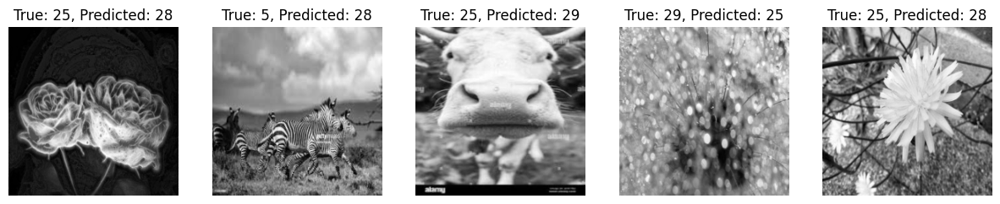

In [63]:
best_1, best_2 = make_cm(datamodule_g5, model_g5)
miss_best_1 = miss_classified(model_g5, t_loader_g5, color=False)

#### Missclassified from best performing Color model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


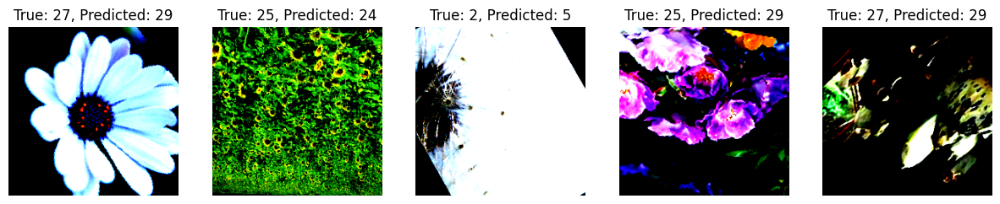

In [58]:
best_3, best_4 = make_cm(datamodule_c5, model_c5)
miss_best_2 = miss_classified(model_c5, t_loader_c5, color=True)

#### Missclassified from worst performing Grayscale model

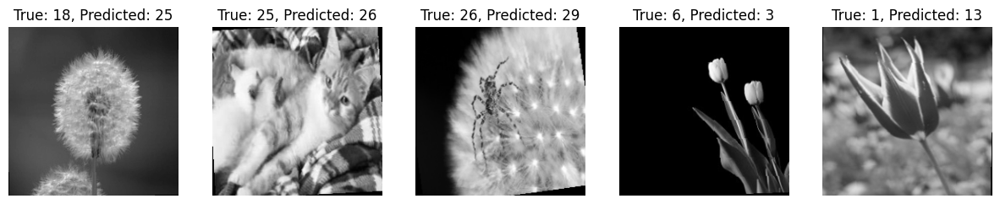

In [30]:
datamodule_rg4, t_loader_rg4,  model_rg4, df_rg4
worst_1, worst_2 = make_cm(datamodule_rg4, model_rg4)
miss_worst_1 = miss_classified(model_rg4, t_loader_rg4, color=False)

#### Missclassified from worst performing Color model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


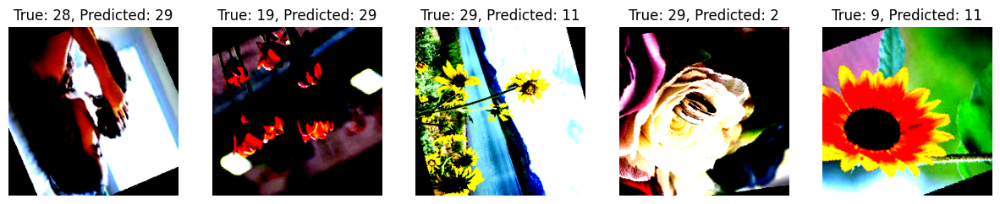

In [34]:
worst_3, wost_4 = make_cm(datamodule_rc2, model_cr2)
miss_wost_2 = miss_classified(model_cr2, t_loader_cr2, color=True)

#### Best Performing Combined Model Confusion Matrix


#### Grayscale!

In [70]:
show_confusion_matrix(best_1, best_2, class_names, gray=True)

,Beetle,Butterfly,Cat,Cow,Dog,Elephant,Gorilla,Hippo,Lizard,Monkey,Mouse,Panda,Spider,Tiger,Trametes hirsuta,Trametes ochracea,Trametes versicolor,Tremella mesenterica,Trichaptum biforme,Tricholomopsis rutilans,Urnula craterium,Verpa bohemica,Vulpicida pinastri,Xanthoria parietina,Zebra,daisy,dandelion,rose,sunflower,tulip
Beetle,20,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Butterfly,0,14,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
Cat,1,0,65,0,2,0,0,0,0,2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,1,0
Cow,1,0,1,27,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
Dog,1,0,0,0,19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
Elephant,2,0,0,2,1,47,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,0,1,2
Gorilla,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Hippo,0,0,0,1,0,0,0,6,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Lizard,0,0,0,0,0,0,0,0,14,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
Monkey,0,0,0,0,0,0,0,0,0,25,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,2


### Discussion

Grayscale is the current winner in performance of the combined tests! We have already learned that a learning rate of 0.001 is on average the better choice. A couple experiments above we tried a lr of 0.0001 to see if an even lower learning rate could help the combined data. It so far has not helped.

The best architecture in this section resulted from 4 connected layers and 50 epochs and got results in the mid 80's. We tried the exact same architecture for color and it's accuracy is in the 60's. This was surprising that the performance was this low, but we have noticed a difference in architectures that work well for grayscale and not color. 

***

# Conclusions

CNNs are a powerful tool for image classification tasks. Our project demonstrated that by utilizing small datasets for pretraining of our CNNs, we could reduce run time yet still determine the correct hyperparameters for a more complex dataset. Performance on larger, more diverse datasets performed just as well in some cases when compared to performance with less diverse datasets. Transformation of images does still pose a hurdle to overcome with regards to model performance. This was in part hampered by our individial systems hardware and inability to handle high computational load tasks. Future work could be geared more towards this area to better determine network complexity and hyperparameters necessary to improve classification accuracy for more complex image datasets including multiple orientations.

#### <u>What we learned</u> 
* We learned how generalized we can use these models to classify images. We were surprised that similar architectures worked fairly well across species. 
* Working with this type of data gave us more insight into how fully connected layers can benefit the CNN.
* More experience with BatchNormalization and Maxpooling. 

#### <u>What was difficult</u> 
* Adding flexibility of parameters with the classification of images.
* Managing our dataset was a challenge. Figuring out where to store them and the time it took to run the large datasets through the CNN. 
* Computational limitations of our individual systems was a hurdle for additional full dataset experimentation.


#### <u>Changes to timeline</u> 
* Figuring out how/where to store our data set us back. 
* It took us some time to get a working CNN in the first place. Even though the class CNN2D was mostly the same, acquiring and preprocessing the data was a challenge.
* We were surprised that we were not able to improve the class CNN2D by changing the parameters alone. This set us back quite a bit in our timeline. Once we all moved to experimenting with the Lightning CNN things began to move along again. 

#### <u>Future work</u>
*  Color images performed very well and better than grayscale on the individual datasets. However on the combined data, the highest accuracy scores were in the 70's. With more experimentation we should be able to get an accuracy score equaled or even better than grayscale. 
*  It appears that there are benefits to using grayscale and benefits to using color images. One thing we could try in the future is using grayscale and color images in our training set. This could make up for some of the downfalls of using grayscale only or color only. If we had more time for the project this would be the direction we would be headed next.
*   More experimentation with devising a CNN that can handle images that are transformed in more ways - additional rotations, areas of an image, sizes too.


# Team Member Contributions

Lucas Dowers: Class CNN2D, Grayscale section, Methods, Combined section(mini-mushrooms, mini-animals, flowers), Conclusions

Tyler Bair: created Mini-datasets, Confusion matrix, Animals section, expiremented with class CNN2D

Jennifer Arce: Acquired the three datasets from Kaggle and transfered to shared folder. Performed mini mushroom experiments and full mushroom dataset run. Refactored initial Lightning version code to implement needed functionality and flexibility. Contributed to Methods section. Experimented with viewing dataset images and determining characteristics prior to use. Completed mushroom section. Introduction. Conclusions.

Brett Kuyper: Identified the datasets for use, found/implemented initial lightning module (CNN/dataloader), added functionality to the lightning module, Completed the Flowers section of the notebook, worked on the Methods section, experimented somewhat with the class CNN, Conclusions section.

# References

https://www.kaggle.com/code/stpeteishii/mushroom-species-pytorch-lightning-cnn  
https://www.kaggle.com/datasets/thehir0/mushroom-species